## Final report guidelines

### 1) Summary of problem statement, data and findings


### Problem Statement

* The dataset comprises supply chain data from DataCo Global, including transaction records, customer data, product information, and logistics. The primary focus is to analyse these variables to uncover patterns indicative of fraudulent activities, such as anomalies in transaction amounts, discrepancies between shipping and order data, and unusual patterns in customer behaviour.

### Dataset and domain
* The Dataset belongs to supply chain domain. It contains 180519 rows and 53 columns

### Data Dictionary 

| # | FIELDS | DESCRIPTION
| -- | ------------ | --------------------------------------- |
| 1 | Type	|  Type of transaction made|
| 2 | Days for shipping (real)     |  Actual shipping days of the purchased product |
| 3 | Days for shipment (scheduled)	|  Days of scheduled delivery of the purchased product |
| 4 | Benefit per order	|  Earnings per order placed| 1 | , Late delivery , Shipping canceled , Shipping on time |
| 5 | Late_delivery_risk  | Categorical variable that indicates if sending is late (1), it is not late (0). |
| 6 | Category Id	 |  Product category code |
| 7 | Category Name	 |  Description of the product category |
| 8 | Customer City	 |  City where the customer made the purchase |
| 9 | Customer Country	 |  Country where the customer made the purchase |
| 10 | Customer Email	 |  Customer's email |
| 11 | Customer Fname	 |  Customer name |
| 12 | Customer Id	 |  Customer ID |
| 13 | Customer Lname	 | Customer lastname |
| 14 | Customer Password	 | Masked customer key |
| 15 | Customer Segment	 | Types of Customers: Consumer , Corporate , Home Office |
| 16 | Customer State	 | State to which the store where the purchase is registered belongs |
| 17 | Customer Street	| Street to which the store where the purchase is registered belongs |
| 18 | Customer Zipcode	| Customer Zipcode |
| 19 | Department Id	| Department code of store |
| 20 | Department Name	|  Department name of store|
| 21 | Latitude	|  Latitude corresponding to location of store|
| 22 | Longitude |  Longitude corresponding to location of store|
| 23 | Market	|  Market to where the order is delivered : Africa , Europe , LATAM , Pacific Asia , USCA|
| 24 | Order City	| Destination city of the order|
| 25 | Order Country	| Destination country of the order|
| 26 | Order Customer Id	| Customer order code|
| 27 | order date (DateOrders)	| Date on which the order is made|
| 28 | Order Id	| Order code|
| 29 | Order Item Cardprod Id	| Product code generated through the RFID reader|
| 30 | Order Item Discount	|  Order item discount value|
| 31 | Order Item Discount Rate   |  Order item discount percentage|
| 32 | Order Item Id | Order item code| 1 | 
| 33 | Order Item Product Price | Price of products without discount|
| 34 | Order Item Profit Ratio | Order Item Profit Ratio|
| 35 | Order Item Quantity	| Number of products per order|
| 36 | Sales		|  Value in sales|
| 37 | Order Item Total  	|  Total amount per order|
| 38 | Order Profit Per Order		|  Order Profit Per Order|
| 39 | Order Region		|   Region of the world where the order is delivered :  Southeast Asia ,South Asia ,Oceania ,Eastern Asia, West Asia , West of USA , US Center , West Africa, Central Africa ,North Africa ,Western Europe ,Northern , Caribbean , South America ,Ea| 1 | st Africa ,Southern Europe , East of USA ,Canada ,Southern Africa , Central Asia ,  Europe , Central America, Eastern Europe , South of  USA |
| 40 | Order State		|   State of the region where the order is delivered|
| 41 | Order Status		|   Order Status : COMPLETE , PENDING , CLOSED , PENDING_PAYMENT ,CANCELLED , PROCESSING ,SUSPECTED_FRAUD ,ON_HOLD ,PAYMENT_REVIEW|
| 42| Product Card Id		|   Product code|
| 43 | Product Category Id	|   Product category code|
| 44 | Product Description	|   Product Description|
| 45| Product Image 	|  Link of visit and purchase of the product|
| 46 | Product Name		|   Product Name|
| 47 | Product Pric  	|  Product Price|
| 48 | Product Status	|   Status of the product | 1 | stock :If it is 1 not available , 0 the product is available |
| 49 | Shipping date (DateOrders)   	|   Exact date and time of shipment|
| 50 | Shipping Mode	|  The following shipping modes are presented : Standard Class , First Class , Second Class , Same Day|

### Measure execution time

In [1]:
from datetime import datetime 

start_time = datetime.now()

### Import Libraries

In [2]:
import numpy                    as     np
import seaborn                  as     sns
import matplotlib.pyplot        as     plt
import plotly.express           as     plx
import pandas                   as     pd
import statistics
import statsmodels.api          as     sm
import sklearn.metrics          as     metrics
from   sklearn.metrics          import recall_score
import warnings
warnings.filterwarnings("ignore")

from   sklearn                  import  tree
from   sklearn.tree             import  DecisionTreeClassifier
from   sklearn.tree             import _tree

from scipy import stats
from sklearn.model_selection    import train_test_split,cross_val_score,cross_val_predict
from sklearn.model_selection    import  StratifiedKFold
from sklearn.linear_model       import LogisticRegression
from sklearn.preprocessing      import StandardScaler,LabelEncoder
from sklearn.metrics            import confusion_matrix,accuracy_score,roc_auc_score,roc_curve,f1_score,classification_report

from statsmodels.stats.outliers_influence  import variance_inflation_factor
from sklearn.tree                          import DecisionTreeClassifier,plot_tree
from statsmodels.stats.stattools           import durbin_watson
from sklearn.preprocessing                 import FunctionTransformer

In [3]:
# check scikit-learn version
import sklearn
print(sklearn.__version__)

1.5.1


In [4]:
from   sklearn.feature_selection   import  RFECV
from   sklearn.feature_selection   import  RFE
from   sklearn                     import  metrics
from   sklearn.pipeline            import  Pipeline
from   sklearn                     import  preprocessing   
from   sklearn.model_selection     import  cross_val_score
from   sklearn.model_selection     import  RepeatedStratifiedKFold
from   sklearn.ensemble            import  RandomForestClassifier

In [5]:
import warnings
from sklearn.exceptions import ConvergenceWarning

import warnings
warnings.filterwarnings("ignore")
# Ignore ConvergenceWarning
warnings.filterwarnings("ignore", category = ConvergenceWarning)

In [6]:
def draw_cm( actual, predicted ):
    
    import matplotlib.pyplot as   plt
    import sklearn.metrics   as   metrics
    import seaborn           as   sns
    
    cm = metrics.confusion_matrix( actual, predicted)
    sns.heatmap(cm, annot=True, fmt='.2f', xticklabels = ["Yes", "No"] , yticklabels = ["Yes", "No"] )
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()  

In [7]:
def draw_roc( actual, probs ):
    
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
    drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(6, 4))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic curve')
    plt.legend(loc="lower right")
    plt.show()
    return fpr, tpr, thresholds

In [8]:
def calculate_VIF(X):
    from statsmodels.stats.outliers_influence import variance_inflation_factor
    #calculate VIF for each explanatory variable
    vif             =  pd.DataFrame()
    vif['VIF']      =  [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif['variable'] =  X.columns

    #view VIF for each explanatory variable 
    return vif

In [9]:
 def remove_high_vif(X, thresh = 5):
    from statsmodels.stats.outliers_influence import variance_inflation_factor   
    cols = X.columns
    variables = np.arange(X.shape[1])
    dropped=True
    while dropped:
        dropped=False
        c = X[cols[variables]].values
        vif = [variance_inflation_factor(c, ix) for ix in np.arange(c.shape[1])]

        maxloc = vif.index(max(vif))
        if max(vif) > thresh:
            print('dropping \'' + X[cols[variables]].columns[maxloc] + '\' at index: ' + str(maxloc))
            variables = np.delete(variables, maxloc)
            dropped=True

    print('Remaining variables:')
    print(X.columns[variables])
    ncdf = X[cols[variables]]
    return ncdf

In [10]:
def  report_null(df):
    counts_list          =  list(zip(df.isnull().sum(),round((df.isnull().sum() * 100) / df.shape[0],2)))
    cols                 =  df.columns
    c                    =  df.isnull().sum()
    p                    =  round((df.isnull().sum() * 100) / df.shape[0],2)
    count_df             =  pd.DataFrame({'Column' : cols, 'NA Count' : c, 'NA Percentage' : p })
    filtered_df          =  count_df[(count_df['NA Count'] > 0)]
    return filtered_df

## Load the Dataset

In [11]:
file_name = 'DataCoSupplyChainDataset.csv'

In [12]:
df         =  pd.read_csv(file_name,low_memory = False, encoding = 'Latin1')
df.head()

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Zipcode,Product Card Id,Product Category Id,Product Description,Product Image,Product Name,Product Price,Product Status,shipping date (DateOrders),Shipping Mode
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,2/3/2018 22:56,Standard Class
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/18/2018 12:27,Standard Class
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/17/2018 12:06,Standard Class
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/16/2018 11:45,Standard Class
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,...,NaN,1360,73,NaN,http://images.acmesports.sports/Smart+watch,Smart watch,327.75,0,1/15/2018 11:24,Standard Class


In [13]:
print("The dataset has ",df.shape[0]," rows and ",df.shape[1]," columns")
df.info()

The dataset has  180519  rows and  53  columns
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180519 entries, 0 to 180518
Data columns (total 53 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Type                           180519 non-null  object 
 1   Days for shipping (real)       180519 non-null  int64  
 2   Days for shipment (scheduled)  180519 non-null  int64  
 3   Benefit per order              180519 non-null  float64
 4   Sales per customer             180519 non-null  float64
 5   Delivery Status                180519 non-null  object 
 6   Late_delivery_risk             180519 non-null  int64  
 7   Category Id                    180519 non-null  int64  
 8   Category Name                  180519 non-null  object 
 9   Customer City                  180519 non-null  object 
 10  Customer Country               180519 non-null  object 
 11  Customer Email                 180519 non-nu

In [14]:
df_num = df.select_dtypes(exclude=['string','object'])
print("Number of numeric columns {}".format(df_num.shape[1]))
print("Numeric columns {}".format(df_num.columns))

Number of numeric columns 29
Numeric columns Index(['Days for shipping (real)', 'Days for shipment (scheduled)',
       'Benefit per order', 'Sales per customer', 'Late_delivery_risk',
       'Category Id', 'Customer Id', 'Customer Zipcode', 'Department Id',
       'Latitude', 'Longitude', 'Order Customer Id', 'Order Id',
       'Order Item Cardprod Id', 'Order Item Discount',
       'Order Item Discount Rate', 'Order Item Id', 'Order Item Product Price',
       'Order Item Profit Ratio', 'Order Item Quantity', 'Sales',
       'Order Item Total', 'Order Profit Per Order', 'Order Zipcode',
       'Product Card Id', 'Product Category Id', 'Product Description',
       'Product Price', 'Product Status'],
      dtype='object')


In [15]:
df_cat = df.select_dtypes(exclude = ['float64','int64'])
print("Number of numeric columns {}".format(df_cat.shape[1]))
print("Numeric columns {}".format(df_cat.columns))

Number of numeric columns 24
Numeric columns Index(['Type', 'Delivery Status', 'Category Name', 'Customer City',
       'Customer Country', 'Customer Email', 'Customer Fname',
       'Customer Lname', 'Customer Password', 'Customer Segment',
       'Customer State', 'Customer Street', 'Department Name', 'Market',
       'Order City', 'Order Country', 'order date (DateOrders)',
       'Order Region', 'Order State', 'Order Status', 'Product Image',
       'Product Name', 'shipping date (DateOrders)', 'Shipping Mode'],
      dtype='object')


### Variable categorization (count of numeric and categorical)

The following *twenty nine* (29) are numeric variables:

1) Days for shipping (real)
2) Days for shipment (scheduled)
3) Benefit per order
4) Sales per customer
5) Late_delivery_risk
6) Category Id
7) Customer Id
8) Customer Zipcode
9) Department Id
10) Latitude
11) Longitude
12) Order Customer Id
13) Order Id
14) Order Item Cardprod Id
15) Order Item Discount
16) Order Item Discount Rate
17) Order Item Id
18) Order Item Product Price
19) Order Item Profit Ratio
20) Order Item Quantity
21) Sales
22) Order Item Total
23) Order Profit Per Order
24) Order Zipcode
25) Product Card Id
26) Product Category Id
27) Product Description
28) Product Price
29) Product Status

The following *Twentyfour* (24) are categorical variables each one is a code or an indicator:
1) Type
2) Delivery Status
3) Category Name
4) Customer City
5) Customer Country
6) Customer Email
7) Customer Fname
8) Customer Lname 
9) Customer Password 
10) Customer Segment 
11) Customer State 
12) Customer Street 
13) Department Name 
14) Market 
15) Order City
16) Order Country
17) order date (DateOrders)
18) Order Region
19) Order State
20) Order Status
21) Product Image
22) Product Name
23) shipping date (DateOrders)
24) Shipping Mode

We observe that the ID variables and customer personal details such as Customer Email, FName, LName, Password, etc. will not add value to our analysis and hence we need to remove them for our analysis.

### 2. Overview of the final process

The flow of the solving the problem is as follows, <br>
Understand the dataset,its description and problem statement completely. <br>
Analyse the data with five point summary and gain insights on the numerical and categorical columns. <br>
Employ different visualization technique and understand the patterns better. <br>
Identify and handle missing values, outliers, inconsistencies, and duplicates in your dataset. This step is crucial to ensure data quality and prevent errors in your model. <br>
Transform your data into a suitable format for machine learning algorithms. This might involve normalization, standardization, feature engineering, or handling categorical variables. <br>
Check if there is a presence of multicollinearity in the data.<br>
Check for the outliers in the data and decide on how to treat the outliers.<br>
Perform different statistical analysis for the dependent and independent variables based on the different type of the independent variable.<br>
Data Preprocessing is done next to make the data to be effectively understood and to avoid bais of the algorithm towards one independent features.<br>
Feature Selection is employed next to list out the features that are significant and select those only for effective prediction of the fraud .<br>
After selecting the features , the different models that can be implemented is taken under discussion and base model is constructed .<br>
If there is imbalance in the target variable , nesscessary sampling technique is employed and the different models is analysed based on different metrics such as Recall,precision F1 score , weighted F1 score .<br>
Based on our criticality of type 1 and type 2 errors the metric to be considered is carefully chosen accordingly based on the criticallity of the error and domain expertise.<br>



#### Five point summary

In [16]:
df['Late_delivery_risk'].value_counts()

# # As the late delivery column is categorical in nature we change the type to
# categorical
df['Late_delivery_risk']=df['Late_delivery_risk'].astype('object')
df['Late_delivery_risk'].value_counts()

Late_delivery_risk
1    98977
0    81542
Name: count, dtype: int64

In [17]:
df.describe(exclude = "object").T

,count,mean,std,min,25%,50%,75%,max
Days for shipping (real),180519.0,3.497654,1.623722,0.000000,2.000000,3.000000,5.000000,6.000000
Days for shipment (scheduled),180519.0,2.931847,1.374449,0.000000,2.000000,4.000000,4.000000,4.000000
Benefit per order,180519.0,21.974989,104.433526,-4274.979980,7.000000,31.520000,64.800003,911.799988
Sales per customer,180519.0,183.107609,120.043670,7.490000,104.379997,163.990005,247.399994,1939.989990
Category Id,180519.0,31.851451,15.640064,2.000000,18.000000,29.000000,45.000000,76.000000
Customer Id,180519.0,6691.379495,4162.918106,1.000000,3258.500000,6457.000000,9779.000000,20757.000000
Customer Zipcode,180516.0,35921.126914,37542.461122,603.000000,725.000000,19380.000000,78207.000000,99205.000000
Department Id,180519.0,5.443460,1.629246,2.000000,4.000000,5.000000,7.000000,12.000000
Latitude,180519.0,29.719955,9.813646,-33.937553,18.265432,33.144863,39.279617,48.781933
Longitude,180519.0,-84.915675,21.433241,-158.025986,-98.446312,-76.847908,-66.370583,115.263077


In [18]:
df.describe(include="object").T

,count,unique,top,freq
Type,180519,4,DEBIT,69295
Delivery Status,180519,4,Late delivery,98977
Late_delivery_risk,180519,2,1,98977
Category Name,180519,50,Cleats,24551
Customer City,180519,563,Caguas,66770
Customer Country,180519,2,EE. UU.,111146
Customer Email,180519,1,XXXXXXXXX,180519
Customer Fname,180519,782,Mary,65150
Customer Lname,180511,1109,Smith,64104
Customer Password,180519,1,XXXXXXXXX,180519


### Inference for Categorical Variables:

1) Type: Most common type is "DEBIT", followed by "TRANSFER" and "PAYMENT". Few instances of "CASH".

2) Delivery Status: Majority of orders are "Shipping on time", with a significant portion "Late delivery". Few instances of other statuses.

3) Late_delivery_risk: Mostly "No risk", indicating most deliveries are on time. A smaller portion flagged as "High risk".

4) Category Name: Most frequent category is Cleats

5) Customer City: Customer city of the most of the shipment	is Caguas	

6) Customer Country: Customer country of the most freqent transactions is EE. UU.

7) Customer Segment: Customer Segment: "Consumer" is the most dominant segment, followed by "Corporate" and "Home Office".

8) Customer State: Most frequent transactions occured in the customer state PR

9) Customer Street: Most frequent transactions occured in the customer Stree Wishing Expressway

10) Department Name: Most frequent transactions occured in the department Fan Shop

11) Market: "LATAM" and "Europe" are the most frequent markets, followed by "Pacific Asia". "USCA" is the least frequent.

12) Order City: "Caguas" is the most frequent city, followed by "Chicago" and "Los Angeles". High cardinality with many unique cities.

13) Order Country: "Estados Unidos" is the most frequent country, followed by "Francia" and "México". Many other countries with smaller order volumes.

14) Order Region: "Central America" and "Western Europe" are the most frequent regions, followed by "South America". Other regions have smaller representation.

15) Order State: "California" and "Isla de la Juventud" are the most frequent states. Many other states with smaller representation.

16) Product Name: High cardinality with many unique product names. Most frequent names likely correspond to popular or commonly ordered items.

17) Shipping Mode: "Standard Class" is the most common shipping mode, followed by "Second Class" and "First Class". "Same Day" is the least frequent.


18) Shipping weekday: Most of the transactions occured on Monday

19) Shipping month: Most of the transactions occured in January


20) order weekday: Orders are relatively evenly distributed across weekdays, with a slight dip on weekends.

21) order month: Orders are relatively consistent throughout the year, with a slight peak in November and December.


### Overall: Categorical variables exhibit varying levels of cardinality. Some variables like "Order City" and "Product Name" have high cardinality. The distribution of orders across different categories provides insights into customer behavior and preferences.


In [19]:
backup_data=df.copy()

In [20]:
print("The number of duplicated rows is ",df.duplicated().sum())

The number of duplicated rows is  0


### Observation

There are no duplicated rows

In [21]:
#### Treating anamolies

In [22]:
df['Customer Country'].unique()

array(['Puerto Rico', 'EE. UU.'], dtype=object)

In [23]:
df['Customer Country'].replace('EE. UU.','USA',inplace=True)

In [24]:
df['Customer Country'].unique()

array(['Puerto Rico', 'USA'], dtype=object)

In [25]:
df['Customer State'].unique()

array(['PR', 'CA', 'NY', 'FL', 'MA', 'IL', 'MT', 'PA', 'MI', 'TX', 'DE',
       'GA', 'MD', 'OH', 'HI', 'NJ', 'WI', 'AZ', 'CO', 'MN', 'NC', 'NM',
       'OR', 'SC', 'VA', 'UT', 'WA', 'KY', 'WV', 'RI', 'CT', 'LA', 'TN',
       'DC', 'ND', 'MO', 'IN', 'ID', 'NV', 'KS', 'AR', 'OK', 'AL', 'IA',
       '95758', '91732'], dtype=object)

In [26]:
df['Customer State'].replace({'95758':'CA','91732':'CA'},inplace=True)

In [27]:
df['Customer State'].unique()

array(['PR', 'CA', 'NY', 'FL', 'MA', 'IL', 'MT', 'PA', 'MI', 'TX', 'DE',
       'GA', 'MD', 'OH', 'HI', 'NJ', 'WI', 'AZ', 'CO', 'MN', 'NC', 'NM',
       'OR', 'SC', 'VA', 'UT', 'WA', 'KY', 'WV', 'RI', 'CT', 'LA', 'TN',
       'DC', 'ND', 'MO', 'IN', 'ID', 'NV', 'KS', 'AR', 'OK', 'AL', 'IA'],
      dtype=object)

In [28]:
df['Order City'].replace({'Bra?ov':'Brasov','Klaip?da':'Klaipeda'
                           ,'Kahramanmara?':'Kahramanmaraş','Gy?r':'Gyor'},inplace=True)

### Check for null values

In [29]:
report_null(df)

,Column,NA Count,NA Percentage
Customer Lname,Customer Lname,8,0.00
Customer Zipcode,Customer Zipcode,3,0.00
Order Zipcode,Order Zipcode,155679,86.24
Product Description,Product Description,180519,100.00


In [30]:
## Customer Zipcode: 3 missing values.
## Order Zipcode: 155,679 missing values; not critical due to other location features.
## Product Description: All values are missing; drop the column.
## Customer LName: 8 missing values; not significant since Customer Id is used.
## All other columns have no missing values.

### Null values treatment

### Dropping columns having more than 80% missing values

In [31]:
df.drop("Order Zipcode",axis=1,inplace=True)
df.drop("Product Description",axis=1,inplace=True)
df.shape

(180519, 51)

In [32]:
df= df.interpolate(method ='linear', limit_direction ='forward')

We again check for missing values

In [33]:
report_null(df)

,Column,NA Count,NA Percentage
Customer Lname,Customer Lname,8,0.0


In [34]:
df1=df.drop(columns=['Customer Email', 'Customer Fname','Customer Lname', 'Customer Password', 'Customer Street',
                       'Department Name', 'Product Image', 'Product Status','Order Country',
                    'Customer Id', 'Customer Zipcode',
                        'Latitude', 'Longitude'])

In [35]:
num=df1.select_dtypes(include=np.number)
cat=df1.select_dtypes(exclude=np.number)

In [36]:
num=num.drop(columns=['Product Card Id','Product Category Id'])

In [37]:
num

,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Category Id,Department Id,Order Customer Id,Order Id,Order Item Cardprod Id,Order Item Discount,Order Item Discount Rate,Order Item Id,Order Item Product Price,Order Item Profit Ratio,Order Item Quantity,Sales,Order Item Total,Order Profit Per Order,Product Price
0,3,4,91.250000,314.640015,73,2,20755,77202,1360,13.110000,0.04,180517,327.750000,0.29,1,327.750000,314.640015,91.250000,327.750000
1,5,4,-249.089996,311.359985,73,2,19492,75939,1360,16.389999,0.05,179254,327.750000,-0.80,1,327.750000,311.359985,-249.089996,327.750000
2,4,4,-247.779999,309.720001,73,2,19491,75938,1360,18.030001,0.06,179253,327.750000,-0.80,1,327.750000,309.720001,-247.779999,327.750000
3,3,4,22.860001,304.809998,73,2,19490,75937,1360,22.940001,0.07,179252,327.750000,0.08,1,327.750000,304.809998,22.860001,327.750000
4,2,4,134.210007,298.250000,73,2,19489,75936,1360,29.500000,0.09,179251,327.750000,0.45,1,327.750000,298.250000,134.210007,327.750000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180514,4,4,40.000000,399.980011,45,7,1005,26043,1004,0.000000,0.00,65177,399.980011,0.10,1,399.980011,399.980011,40.000000,399.980011
180515,3,2,-613.770019,395.980011,45,7,9141,26037,1004,4.000000,0.01,65161,399.980011,-1.55,1,399.980011,395.980011,-613.770019,399.980011
180516,5,4,141.110001,391.980011,45,7,291,26024,1004,8.000000,0.02,65129,399.980011,0.36,1,399.980011,391.980011,141.110001,399.980011
180517,3,4,186.229996,387.980011,45,7,2813,26022,1004,12.000000,0.03,65126,399.980011,0.48,1,399.980011,387.980011,186.229996,399.980011


In [38]:
cat

,Type,Delivery Status,Late_delivery_risk,Category Name,Customer City,Customer Country,Customer Segment,Customer State,Market,Order City,order date (DateOrders),Order Region,Order State,Order Status,Product Name,shipping date (DateOrders),Shipping Mode
0,DEBIT,Advance shipping,0,Sporting Goods,Caguas,Puerto Rico,Consumer,PR,Pacific Asia,Bekasi,1/31/2018 22:56,Southeast Asia,Java Occidental,COMPLETE,Smart watch,2/3/2018 22:56,Standard Class
1,TRANSFER,Late delivery,1,Sporting Goods,Caguas,Puerto Rico,Consumer,PR,Pacific Asia,Bikaner,1/13/2018 12:27,South Asia,Rajastán,PENDING,Smart watch,1/18/2018 12:27,Standard Class
2,CASH,Shipping on time,0,Sporting Goods,San Jose,USA,Consumer,CA,Pacific Asia,Bikaner,1/13/2018 12:06,South Asia,Rajastán,CLOSED,Smart watch,1/17/2018 12:06,Standard Class
3,DEBIT,Advance shipping,0,Sporting Goods,Los Angeles,USA,Home Office,CA,Pacific Asia,Townsville,1/13/2018 11:45,Oceania,Queensland,COMPLETE,Smart watch,1/16/2018 11:45,Standard Class
4,PAYMENT,Advance shipping,0,Sporting Goods,Caguas,Puerto Rico,Corporate,PR,Pacific Asia,Townsville,1/13/2018 11:24,Oceania,Queensland,PENDING_PAYMENT,Smart watch,1/15/2018 11:24,Standard Class
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180514,CASH,Shipping on time,0,Fishing,Brooklyn,USA,Home Office,NY,Pacific Asia,Shanghái,1/16/2016 3:40,Eastern Asia,Shanghái,CLOSED,Field & Stream Sportsman 16 Gun Fire Safe,1/20/2016 3:40,Standard Class
180515,DEBIT,Late delivery,1,Fishing,Bakersfield,USA,Corporate,CA,Pacific Asia,Hirakata,1/16/2016 1:34,Eastern Asia,Osaka,COMPLETE,Field & Stream Sportsman 16 Gun Fire Safe,1/19/2016 1:34,Second Class
180516,TRANSFER,Late delivery,1,Fishing,Bristol,USA,Corporate,CT,Pacific Asia,Adelaide,1/15/2016 21:00,Oceania,Australia del Sur,PENDING,Field & Stream Sportsman 16 Gun Fire Safe,1/20/2016 21:00,Standard Class
180517,PAYMENT,Advance shipping,0,Fishing,Caguas,Puerto Rico,Consumer,PR,Pacific Asia,Adelaide,1/15/2016 20:18,Oceania,Australia del Sur,PENDING_PAYMENT,Field & Stream Sportsman 16 Gun Fire Safe,1/18/2016 20:18,Standard Class


## 3. Step-by-step walk through of the solution

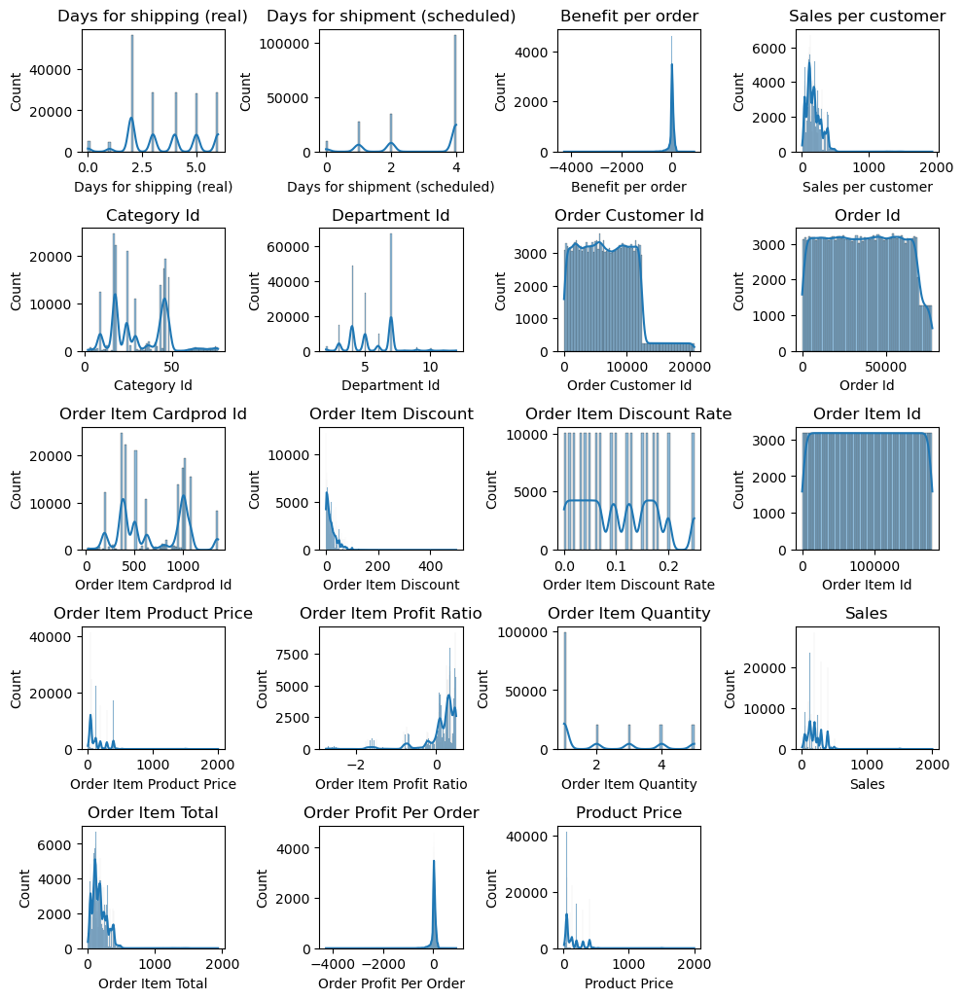

In [39]:
# Univariate Analysis
plt.figure(figsize=(10,12))
t=1
for i in num.columns.to_list():
    plt.subplot(6,4,t)
    sns.histplot(df1[i],kde=True)
    plt.title(i)
    t+=1
plt.tight_layout()
plt.show()
    

In [40]:
cat.columns.to_list()

['Type',
 'Delivery Status',
 'Late_delivery_risk',
 'Category Name',
 'Customer City',
 'Customer Country',
 'Customer Segment',
 'Customer State',
 'Market',
 'Order City',
 'order date (DateOrders)',
 'Order Region',
 'Order State',
 'Order Status',
 'Product Name',
 'shipping date (DateOrders)',
 'Shipping Mode']

In [41]:
c=['Type','Delivery Status','Customer Segment','Market', 'Order Region','Order Status','Shipping Mode']

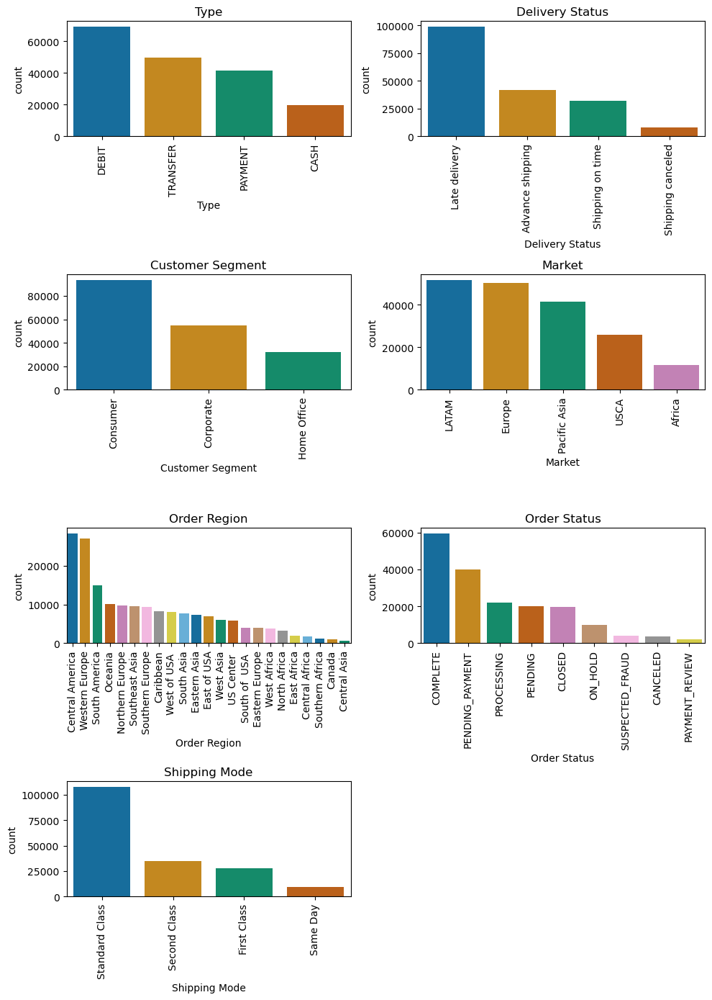

In [42]:
plt.figure(figsize=(10,14))
t=1
for i in c:
    plt.subplot(4,2,t)
    sns.countplot(data=df1,x=i,order=df1[i].value_counts().index,palette='colorblind')
    plt.title(i)
    plt.xticks(rotation=90)
    t+=1
plt.tight_layout()
plt.show()

In [43]:
def set_target(x):
    df1['Target'] = 0
    conditions = [
        (df1[x]  == 'SUSPECTED_FRAUD') 
        ]
    # create a list of the values we want to assign for each condition
    values = [1]

    # create a new column and use np.select to assign values to it using our lists as arguments
    df1['Target'] = np.select(conditions, values)
    return df1
x                  =     'Order Status'
set_target(x)

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Region,Order State,Order Status,Product Card Id,Product Category Id,Product Name,Product Price,shipping date (DateOrders),Shipping Mode,Target
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,...,Southeast Asia,Java Occidental,COMPLETE,1360,73,Smart watch,327.750000,2/3/2018 22:56,Standard Class,0
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,...,South Asia,Rajastán,PENDING,1360,73,Smart watch,327.750000,1/18/2018 12:27,Standard Class,0
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,...,South Asia,Rajastán,CLOSED,1360,73,Smart watch,327.750000,1/17/2018 12:06,Standard Class,0
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,...,Oceania,Queensland,COMPLETE,1360,73,Smart watch,327.750000,1/16/2018 11:45,Standard Class,0
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,...,Oceania,Queensland,PENDING_PAYMENT,1360,73,Smart watch,327.750000,1/15/2018 11:24,Standard Class,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180514,CASH,4,4,40.000000,399.980011,Shipping on time,0,45,Fishing,Brooklyn,...,Eastern Asia,Shanghái,CLOSED,1004,45,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,1/20/2016 3:40,Standard Class,0
180515,DEBIT,3,2,-613.770019,395.980011,Late delivery,1,45,Fishing,Bakersfield,...,Eastern Asia,Osaka,COMPLETE,1004,45,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,1/19/2016 1:34,Second Class,0
180516,TRANSFER,5,4,141.110001,391.980011,Late delivery,1,45,Fishing,Bristol,...,Oceania,Australia del Sur,PENDING,1004,45,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,1/20/2016 21:00,Standard Class,0
180517,PAYMENT,3,4,186.229996,387.980011,Advance shipping,0,45,Fishing,Caguas,...,Oceania,Australia del Sur,PENDING_PAYMENT,1004,45,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,1/18/2016 20:18,Standard Class,0


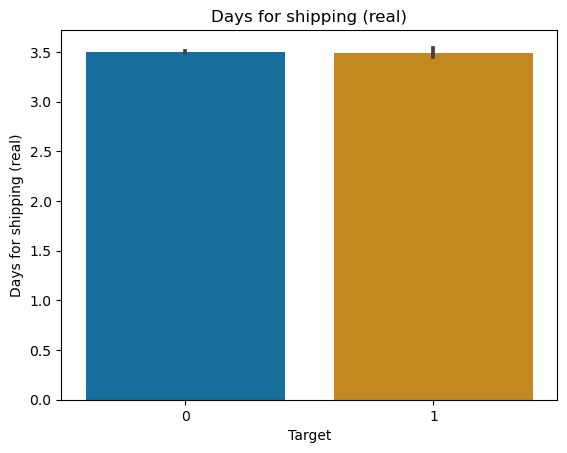

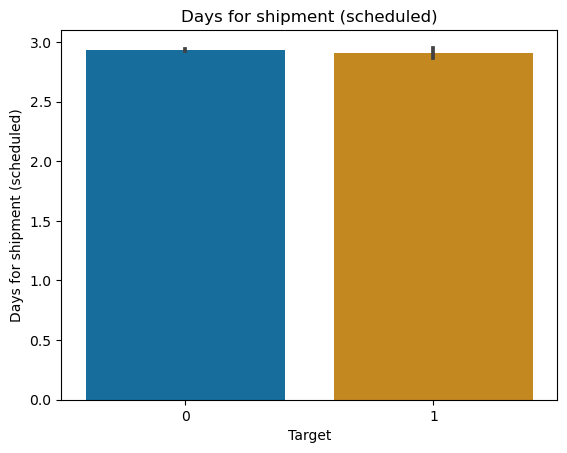

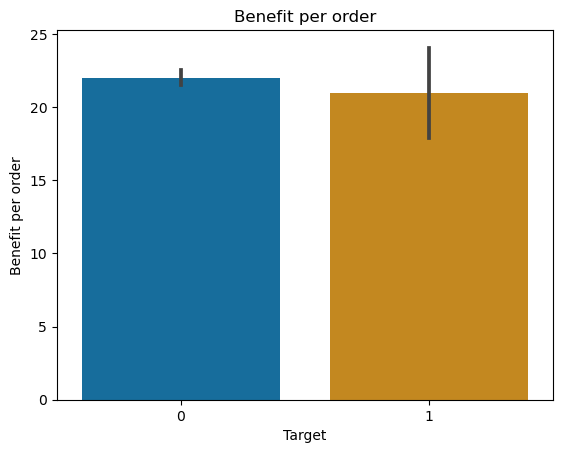

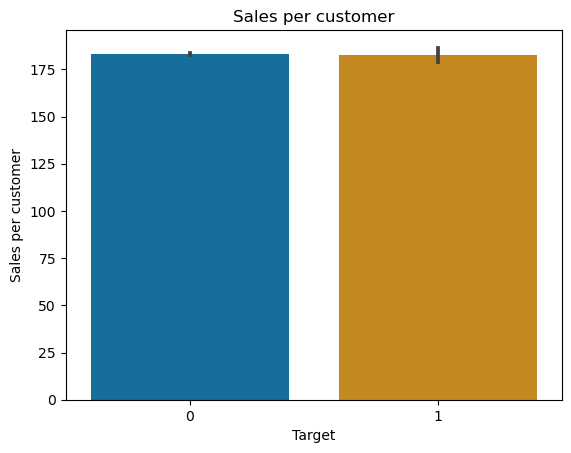

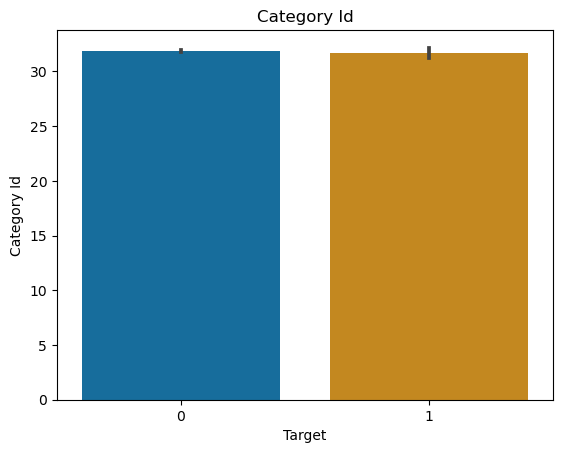

...

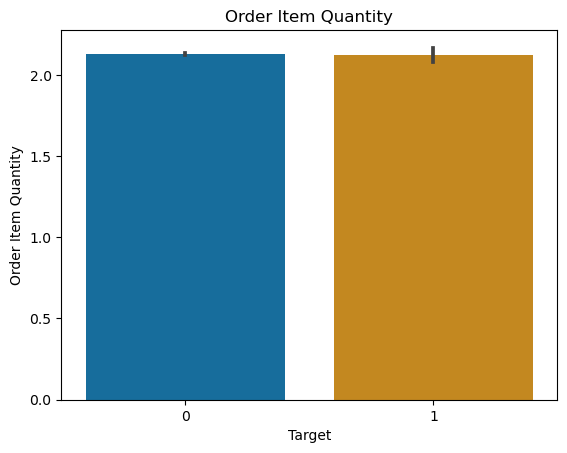

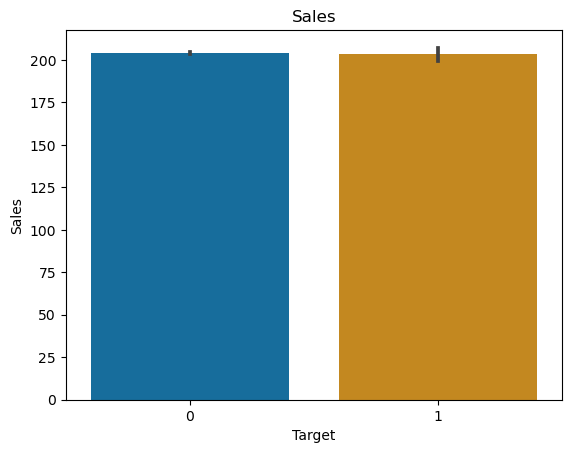

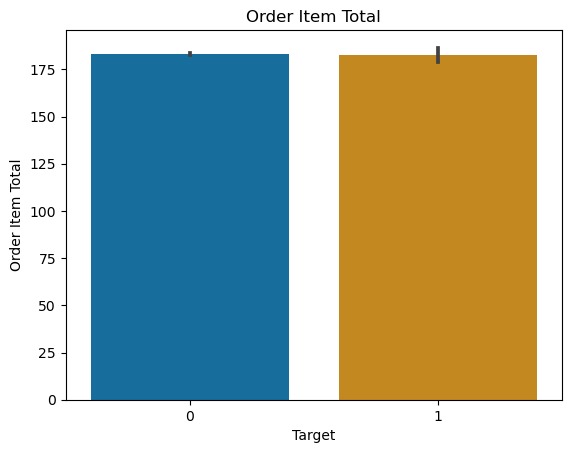

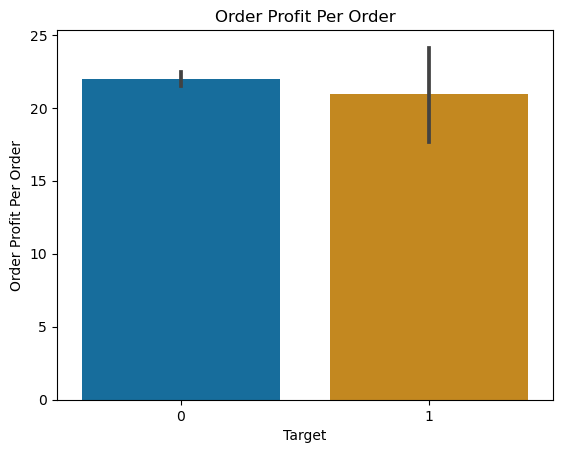

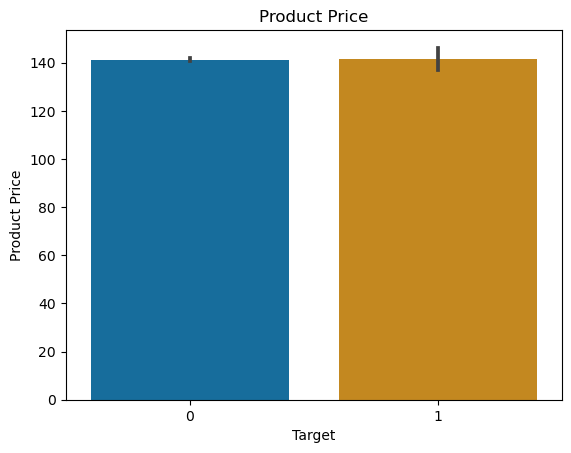

In [44]:
# Bivariate Analysis
#t=1
for i in num.columns.to_list():
    #plt.subplot(6,4,t)
    sns.barplot(y=df1[i],x=df1['Target'],palette='colorblind')
    plt.title(i)
    #t+=1
#plt.tight_layout()
    plt.show()

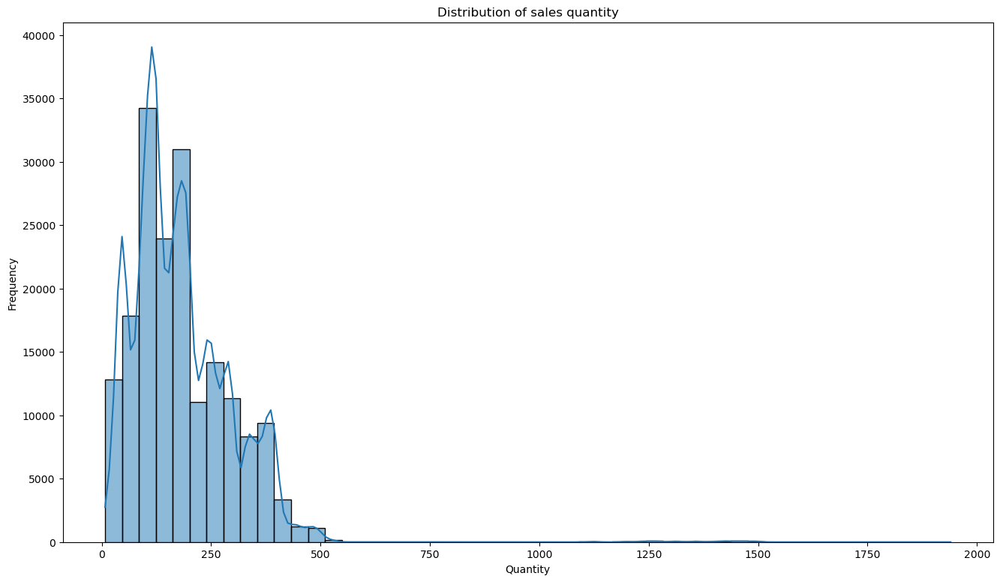

In [45]:
plt.figure(figsize=(16, 9))
sns.histplot(df1['Sales per customer'], bins=50, kde=True)
plt.title('Distribution of sales quantity')
plt.xlabel('Quantity')
plt.ylabel('Frequency')
plt.show()


In [46]:
import datetime as dt

In [47]:
df1['order date (DateOrders)'] =pd.to_datetime(df1['order date (DateOrders)'])

In [48]:
# Grouping by day of the week and counting sales
sales_by_day_of_week = df1.groupby(df1['order date (DateOrders)'].dt.day_name()).size()
# Sorting the results by days of the week
week_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
sales_by_day_of_week = sales_by_day_of_week.reindex(week_order)

sales_by_day_of_week = sales_by_day_of_week.reset_index()
sales_by_day_of_week.rename(columns={0:'Sales Quantity', 'order date (DateOrders)':'Day of the Week'}, inplace=True)

sales_by_day_of_week

,Day of the Week,Sales Quantity
0,Monday,25786
1,Tuesday,25622
2,Wednesday,25587
3,Thursday,25752
4,Friday,25925
5,Saturday,25901
6,Sunday,25946


In [49]:
import plotly.express as px

In [50]:
fig = px.bar(sales_by_day_of_week, x='Day of the Week', y='Sales Quantity', color='Day of the Week',
             text='Sales Quantity', title='Sales by day of the week - in quantity')

fig.update_traces(textposition='outside', texttemplate='%{text}', textfont_size=12)
fig.update_layout(width=1000, height=600)
fig.show()


In [51]:
# Grouping the data by year and month and summing the sales
sales_over_time = df1.resample('M', on='order date (DateOrders)').sum()['Sales']

# Creating a DataFrame from the series
sales_over_time_df = sales_over_time.reset_index()

# Calculating the sales variation
sales_over_time_df['Sales Variation'] = sales_over_time_df['Sales'].diff()

# Calculating the percentage variation of sales
sales_over_time_df['Percentage Variation'] = sales_over_time_df['Sales'].pct_change()

# Converting the variation to percentage and rounding
sales_over_time_df['Percentage Variation'] = (sales_over_time_df['Percentage Variation'] * 100).round(2)

# Visualization
fig = px.line(sales_over_time_df, x='order date (DateOrders)', y='Sales', 
              title='Total Sales per Month (in millions)', labels={'order date (DateOrders)': 'Date', 'Sales': 'Total Sales (in millions)'})
fig.update_layout(width=1000, height=600)
fig.show()


In [52]:
# Grouping by 'Category Name' and summing the sales
Sales_by_segment = df1.groupby('Customer Segment')['Sales'].sum().reset_index()

Sales_by_segment['Sales'] = (Sales_by_segment['Sales'] / 1000000).round(2)

Sales_by_segment.rename(columns={'Sales': 'Sales (in millions)', 'Customer Segment': 'Customer Segment'}, inplace=True)

# Sorting the results
Sales_by_segment = Sales_by_segment.sort_values(by='Sales (in millions)', ascending=False).reset_index(drop=True)

Sales_by_segment


,Customer Segment,Sales (in millions)
0,Consumer,19.10
1,Corporate,11.17
2,Home Office,6.52


In [53]:
# Grouping by 'Category Name' and summing the sales
sales_by_category = df1.groupby('Category Name')['Sales'].sum().reset_index()

sales_by_category['Sales'] = (sales_by_category['Sales'] / 1000000).round(3)

sales_by_category.rename(columns={'Sales': 'Sales (in millions)', 'Category Name': 'Category Name'}, inplace=True)

# Sorting the results
sales_by_category = sales_by_category.sort_values(by='Sales (in millions)', ascending=False).reset_index(drop=True)

#sales_by_category = sales_by_category.head(10)

sales_by_category


,Category Name,Sales (in millions)
0,Fishing,6.930
1,Cleats,4.432
2,Camping & Hiking,4.118
3,Cardio Equipment,3.695
4,Women's Apparel,3.148
5,Water Sports,3.114
6,Men's Footwear,2.892
7,Indoor/Outdoor Games,2.889
8,Shop By Sport,1.310
9,Computers,0.663


In [54]:
df1

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Id,Category Name,Customer City,...,Order Region,Order State,Order Status,Product Card Id,Product Category Id,Product Name,Product Price,shipping date (DateOrders),Shipping Mode,Target
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,73,Sporting Goods,Caguas,...,Southeast Asia,Java Occidental,COMPLETE,1360,73,Smart watch,327.750000,2/3/2018 22:56,Standard Class,0
1,TRANSFER,5,4,-249.089996,311.359985,Late delivery,1,73,Sporting Goods,Caguas,...,South Asia,Rajastán,PENDING,1360,73,Smart watch,327.750000,1/18/2018 12:27,Standard Class,0
2,CASH,4,4,-247.779999,309.720001,Shipping on time,0,73,Sporting Goods,San Jose,...,South Asia,Rajastán,CLOSED,1360,73,Smart watch,327.750000,1/17/2018 12:06,Standard Class,0
3,DEBIT,3,4,22.860001,304.809998,Advance shipping,0,73,Sporting Goods,Los Angeles,...,Oceania,Queensland,COMPLETE,1360,73,Smart watch,327.750000,1/16/2018 11:45,Standard Class,0
4,PAYMENT,2,4,134.210007,298.250000,Advance shipping,0,73,Sporting Goods,Caguas,...,Oceania,Queensland,PENDING_PAYMENT,1360,73,Smart watch,327.750000,1/15/2018 11:24,Standard Class,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180514,CASH,4,4,40.000000,399.980011,Shipping on time,0,45,Fishing,Brooklyn,...,Eastern Asia,Shanghái,CLOSED,1004,45,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,1/20/2016 3:40,Standard Class,0
180515,DEBIT,3,2,-613.770019,395.980011,Late delivery,1,45,Fishing,Bakersfield,...,Eastern Asia,Osaka,COMPLETE,1004,45,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,1/19/2016 1:34,Second Class,0
180516,TRANSFER,5,4,141.110001,391.980011,Late delivery,1,45,Fishing,Bristol,...,Oceania,Australia del Sur,PENDING,1004,45,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,1/20/2016 21:00,Standard Class,0
180517,PAYMENT,3,4,186.229996,387.980011,Advance shipping,0,45,Fishing,Caguas,...,Oceania,Australia del Sur,PENDING_PAYMENT,1004,45,Field & Stream Sportsman 16 Gun Fire Safe,399.980011,1/18/2016 20:18,Standard Class,0


In [55]:
canceled_shipment_df = df[df['Delivery Status']=='Shipping canceled']
canceled_shipment_counts = canceled_shipment_df['Order Status'].value_counts()

canceled_shipment_counts = canceled_shipment_counts.reset_index()
canceled_shipment_counts.columns = ['Cancellation Reason', 'Order Quantity']

canceled_shipment_counts['Cancellation Reason'] = canceled_shipment_counts['Cancellation Reason'].replace({'SUSPECTED_FRAUD': 'POSSIBLE FRAUD', 'CANCELED': 'USER CANCELED'})
canceled_shipment_counts


,Cancellation Reason,Order Quantity
0,POSSIBLE FRAUD,4062
1,USER CANCELED,3692


In [56]:
fraudulent_purchases = df1.groupby('Product Name').size().reset_index(name='Fraudulent Purchases')
fraudulent_purchases.sort_values(by='Fraudulent Purchases', ascending=False, inplace=True)

# Renaming columns
fraudulent_purchases.rename(columns={'Product Name': 'Product Name'}, inplace=True)

fraudulent_purchases


,Product Name,Fraudulent Purchases
71,Perfect Fitness Perfect Rip Deck,24515
56,Nike Men's CJ Elite 2 TD Football Cleat,22246
59,Nike Men's Dri-FIT Victory Golf Polo,21035
67,O'Brien Men's Neoprene Life Vest,19298
24,Field & Stream Sportsman 16 Gun Fire Safe,17325
...,...,...
80,Stiga Master Series ST3100 Competition Indoor,27
77,SOLE E35 Elliptical,15
9,Bushnell Pro X7 Jolt Slope Rangefinder,11
76,SOLE E25 Elliptical,10


In [57]:
fraudulent_purchases_category = df1.groupby('Category Name').size().reset_index(name='Fraudulent Purchases')
fraudulent_purchases_category.sort_values(by='Fraudulent Purchases', ascending=False, inplace=True)

# Renaming columns
fraudulent_purchases_category.rename(columns={'Category Name': 'Category Name'}, inplace=True)

fraudulent_purchases_category


,Category Name,Fraudulent Purchases
12,Cleats,24551
34,Men's Footwear,22246
47,Women's Apparel,21035
30,Indoor/Outdoor Games,19298
18,Fishing,17325
46,Water Sports,15540
9,Camping & Hiking,13729
10,Cardio Equipment,12487
38,Shop By Sport,10984
17,Electronics,3156


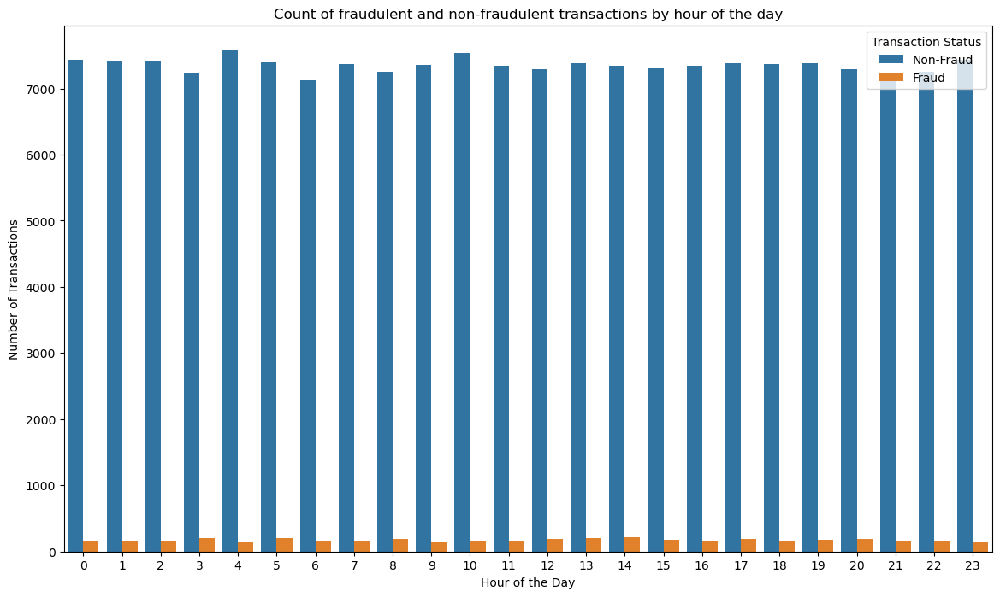

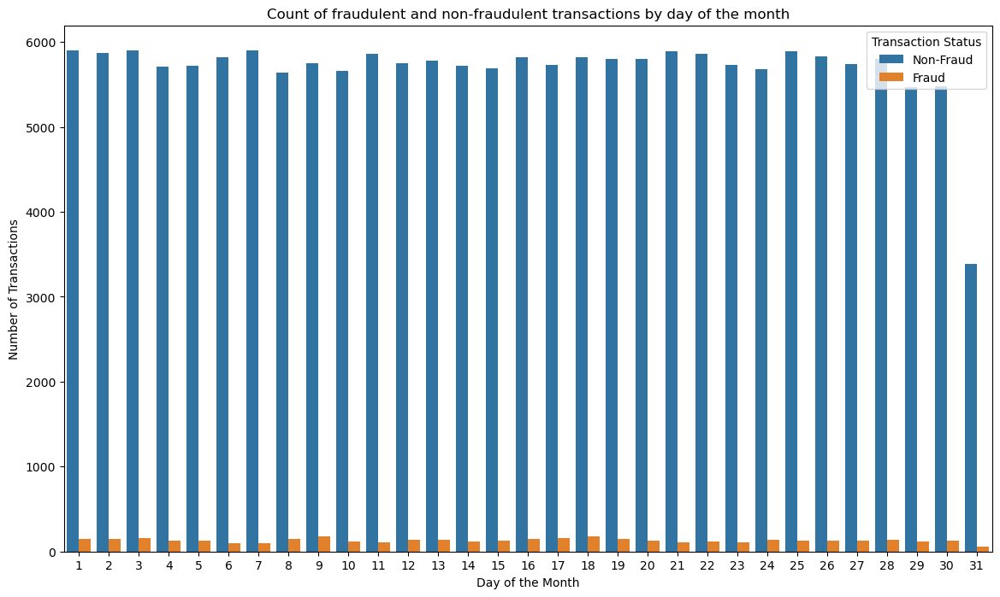

In [58]:
# Creating the target column
#df['target'] = df['Order Status'].apply(lambda x: 1 if x == 'SUSPECTED_FRAUD' else 0)

# Grouping by hour and fraud status and counting occurrences
fraud_by_hour = df1.groupby([df1['order date (DateOrders)'].dt.hour.rename('Hour'), 'Target']).size().reset_index(name='Count')

# Now, using Seaborn to create a bar plot
plt.figure(figsize=(14, 8))
barplot = sns.barplot(data=fraud_by_hour, x='Hour', y='Count', hue='Target')

# Adding titles and labels
plt.title('Count of fraudulent and non-fraudulent transactions by hour of the day')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Transactions')

# Adjusting legend labels
handles, labels = barplot.get_legend_handles_labels()
barplot.legend(handles=handles, title='Transaction Status', labels=['Non-Fraud', 'Fraud'])

plt.show()

# Grouping by day and fraud status and counting occurrences
fraud_by_day = df1.groupby([df1['order date (DateOrders)'].dt.day.rename('Day'), 'Target']).size().reset_index(name='Count')

# Now, using Seaborn to create a bar plot
plt.figure(figsize=(14, 8))
barplot = sns.barplot(data=fraud_by_day, x='Day', y='Count', hue='Target')

# Adding titles and labels
plt.title('Count of fraudulent and non-fraudulent transactions by day of the month')
plt.xlabel('Day of the Month')
plt.ylabel('Number of Transactions')

# Adjusting legend labels
handles, labels = barplot.get_legend_handles_labels()
barplot.legend(handles=handles, title='Transaction Status', labels=['Non-Fraud', 'Fraud'])

plt.show()


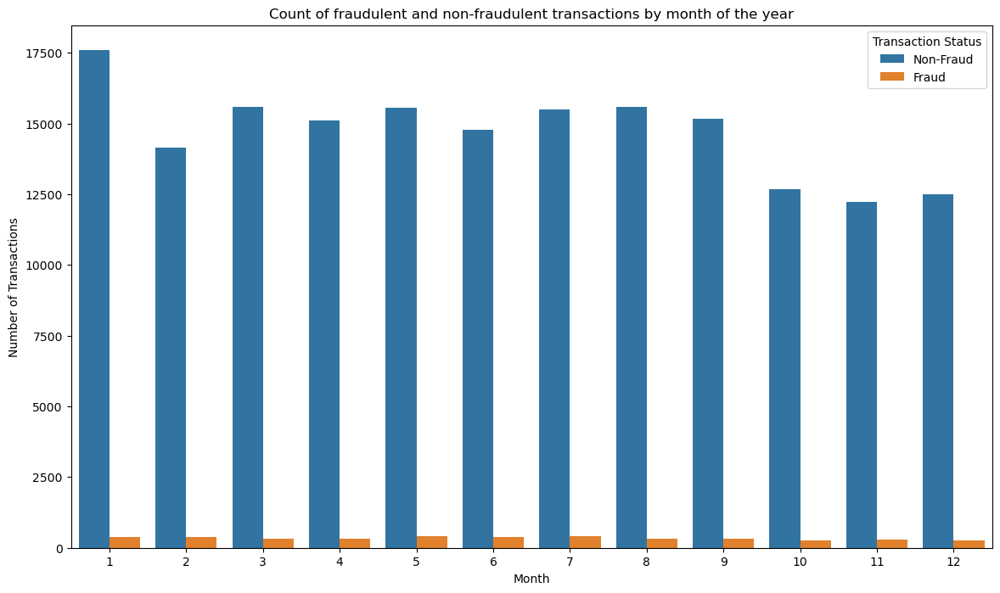

In [59]:
# Grouping by month and fraud status and counting occurrences
fraud_by_month = df1.groupby([df1['order date (DateOrders)'].dt.month.rename('Month'), 'Target']).size().reset_index(name='Count')

# Now, using Seaborn to create a bar plot
plt.figure(figsize=(14, 8))
barplot = sns.barplot(data=fraud_by_month, x='Month', y='Count', hue='Target')

# Adding titles and labels
plt.title('Count of fraudulent and non-fraudulent transactions by month of the year')
plt.xlabel('Month')
plt.ylabel('Number of Transactions')

# Adjusting legend labels
handles, labels = barplot.get_legend_handles_labels()
barplot.legend(handles=handles, title='Transaction Status', labels=['Non-Fraud', 'Fraud'])

plt.show()


In [60]:
# Multivariate Analysis

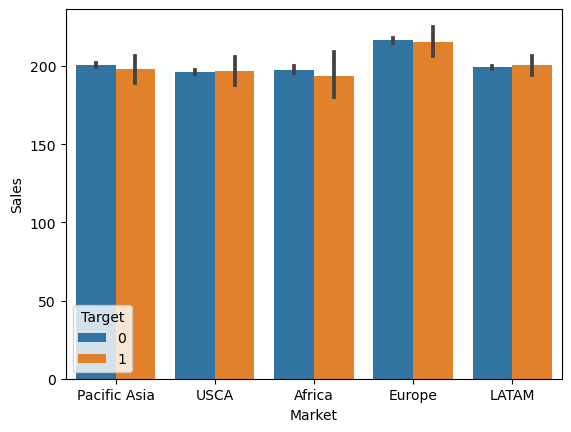

In [61]:
sns.barplot(data=df1,x='Market',y='Sales',hue='Target')
plt.show()

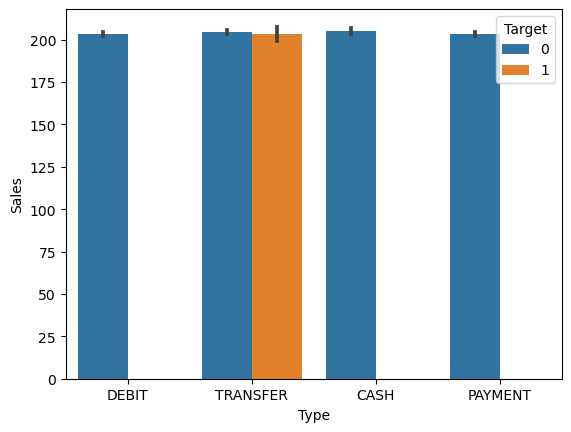

In [62]:
sns.barplot(data=df1,x='Type',y='Sales',hue='Target')
plt.show()

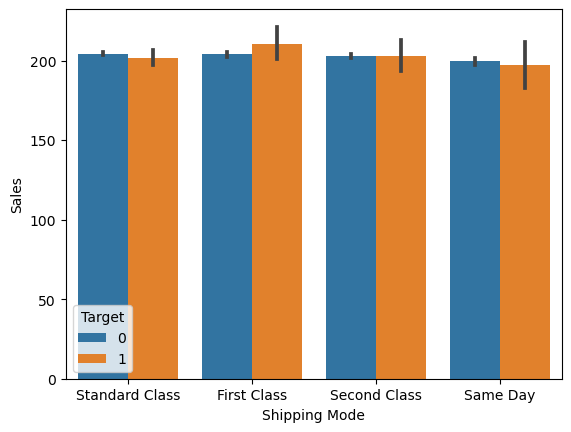

In [63]:
sns.barplot(data=df1,x='Shipping Mode',y='Sales',hue='Target')
plt.show()

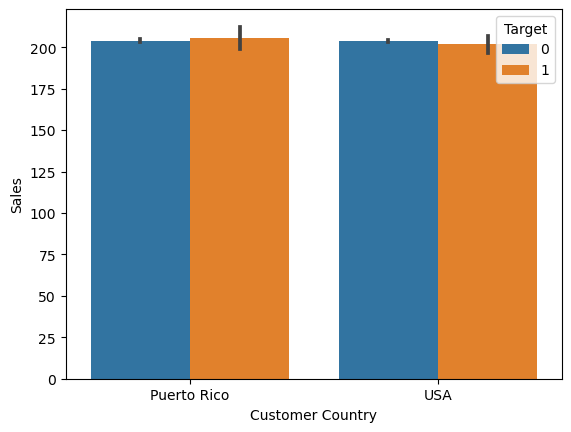

In [64]:
sns.barplot(data=df1,x='Customer Country',y='Sales',hue='Target')
plt.show()

In [65]:
df.drop("Customer Email",axis=1,inplace=True)
df.drop("Customer Password",axis=1,inplace=True)
df.drop("Customer Id",axis=1,inplace=True)
df.drop("Customer Fname",axis=1,inplace=True)
df.drop("Customer Lname",axis=1,inplace=True)
df.drop("Category Id",axis=1,inplace=True)
df.drop("Department Id",axis=1,inplace=True)
df.drop("Order Customer Id",axis=1,inplace=True)
df.drop("Product Image", axis=1,inplace=True)
df.drop("Order Id", axis=1,inplace=True)
df.drop("Latitude", axis=1,inplace=True)
df.drop("Longitude",axis=1,inplace=True)

In [66]:
df["shipping date (DateOrders)"] = pd.to_datetime(df["shipping date (DateOrders)"])
df                  =    df.sort_values(by="shipping date (DateOrders)")
## extracting date columns
df['Shipping weekday'] = df['shipping date (DateOrders)'].dt.weekday
df['Shipping month']=df['shipping date (DateOrders)'].dt.month
## changing the datatypes of extracted date columns
df['Shipping weekday']=df['Shipping weekday'].astype('object')
df['Shipping month']=df['Shipping month'].astype('object')
### replacing the order weekday to day strings
df['Shipping weekday'].replace({0:'Monday',1:'Tuesday',2:'Wednesday',3:'Thursday',4:'Friday',5:'Saturday',6:'Sunday'},inplace=True)
## replacing the order month to month names
df['Shipping month'].replace({1:'January',2:'February',3:'March',4:'April',5:'May',6:'June',7:'July',8:'August',9:'September',10:'October',11:'November',12:'December'},inplace=True)


In [67]:
df["order date (DateOrders)"]=pd.to_datetime(df["order date (DateOrders)"])
df=df.sort_values(by="order date (DateOrders)")

In [68]:
## extracting date columns
df['order weekday']=df['order date (DateOrders)'].dt.weekday
df['order month']=df['order date (DateOrders)'].dt.month
## changing the datatypes of extracted date columns
df['order weekday']=df['order weekday'].astype('object')
df['order month']=df['order month'].astype('object')
### replacing the order weekday to day strings
df['order weekday'].replace({0:'Monday',1:'Tuesday',2:'Wednesday',3:'Thursday',4:'Friday',5:'Saturday',6:'Sunday'},inplace=True)
## replacing the order month to month names
df['order month'].replace({1:'January',2:'February',3:'March',4:'April',5:'May',6:'June',7:'July',8:'August',9:'September',10:'October',11:'November',12:'December'},inplace=True)

In [69]:
## dropping the orderdate column and shipping date column since the date columns are extracted
df.drop("order date (DateOrders)",axis = 1,inplace = True)
df.drop("shipping date (DateOrders)",axis = 1,inplace = True)
df.shape

(180519, 41)

In [70]:
#### adding the Target Column
def set_target(x):
    df['Target'] = 0
    conditions = [
        (df[x]  == 'SUSPECTED_FRAUD')
        ]
    # create a list of the values we want to assign for each condition
    values = [1]

    # create a new column and use np.select to assign values to it using our lists as arguments
    df['Target'] = np.select(conditions, values)
    return df

In [71]:
x                  =     'Order Status'
set_target(x)

,Type,Days for shipping (real),Days for shipment (scheduled),Benefit per order,Sales per customer,Delivery Status,Late_delivery_risk,Category Name,Customer City,Customer Country,...,Product Category Id,Product Name,Product Price,Product Status,Shipping Mode,Shipping weekday,Shipping month,order weekday,order month,Target
33833,CASH,2,4,88.790001,239.979996,Advance shipping,0,Camping & Hiking,Hickory,USA,...,43,Diamondback Women's Serene Classic Comfort Bi,299.980011,0,Standard Class,Saturday,January,Thursday,January,0
109322,PAYMENT,3,4,68.250000,227.500000,Advance shipping,0,Women's Apparel,Chicago,USA,...,24,Nike Men's Dri-FIT Victory Golf Polo,50.000000,0,Standard Class,Sunday,January,Thursday,January,0
87884,PAYMENT,3,4,36.470001,107.889999,Advance shipping,0,Men's Footwear,Chicago,USA,...,18,Nike Men's CJ Elite 2 TD Football Cleat,129.990005,0,Standard Class,Sunday,January,Thursday,January,0
77011,PAYMENT,3,4,91.180000,193.990005,Advance shipping,0,Water Sports,Chicago,USA,...,48,Pelican Sunstream 100 Kayak,199.990005,0,Standard Class,Sunday,January,Thursday,January,0
63764,CASH,5,4,4.100000,40.980000,Late delivery,1,Accessories,San Antonio,USA,...,40,Team Golf New England Patriots Putter Grip,24.990000,0,Standard Class,Tuesday,January,Thursday,January,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160537,TRANSFER,6,4,-107.959999,161.869995,Late delivery,1,Women's Clothing,Caguas,Puerto Rico,...,76,Summer dresses,215.820007,0,Standard Class,Tuesday,February,Wednesday,January,0
93905,DEBIT,2,4,-126.559998,172.660004,Advance shipping,0,Women's Clothing,Plainfield,USA,...,76,Summer dresses,215.820007,0,Standard Class,Friday,February,Wednesday,January,0
0,DEBIT,3,4,91.250000,314.640015,Advance shipping,0,Sporting Goods,Caguas,Puerto Rico,...,73,Smart watch,327.750000,0,Standard Class,Saturday,February,Wednesday,January,0
52147,PAYMENT,4,4,1.530000,10.910000,Shipping on time,0,Toys,Berwyn,USA,...,74,Toys,11.540000,0,Standard Class,Sunday,February,Wednesday,January,0


We shall remove the column, 'Order Status' as we had derived our target variables based on this.

In [72]:
print("Our dataset for further analysis has {0} rows and {1} columns".format(df.shape[0], df.shape[1]))

Our dataset for further analysis has 180519 rows and 42 columns


In [73]:
df.columns

Index(['Type', 'Days for shipping (real)', 'Days for shipment (scheduled)',
       'Benefit per order', 'Sales per customer', 'Delivery Status',
       'Late_delivery_risk', 'Category Name', 'Customer City',
       'Customer Country', 'Customer Segment', 'Customer State',
       'Customer Street', 'Customer Zipcode', 'Department Name', 'Market',
       'Order City', 'Order Country', 'Order Item Cardprod Id',
       'Order Item Discount', 'Order Item Discount Rate', 'Order Item Id',
       'Order Item Product Price', 'Order Item Profit Ratio',
       'Order Item Quantity', 'Sales', 'Order Item Total',
       'Order Profit Per Order', 'Order Region', 'Order State', 'Order Status',
       'Product Card Id', 'Product Category Id', 'Product Name',
       'Product Price', 'Product Status', 'Shipping Mode', 'Shipping weekday',
       'Shipping month', 'order weekday', 'order month', 'Target'],
      dtype='object')

### a) multi-collinearity

In [74]:
df_num  = df.select_dtypes(exclude=['string','object'])
numcols = df_num.columns

In [75]:
df_num.columns

Index(['Days for shipping (real)', 'Days for shipment (scheduled)',
       'Benefit per order', 'Sales per customer', 'Customer Zipcode',
       'Order Item Cardprod Id', 'Order Item Discount',
       'Order Item Discount Rate', 'Order Item Id', 'Order Item Product Price',
       'Order Item Profit Ratio', 'Order Item Quantity', 'Sales',
       'Order Item Total', 'Order Profit Per Order', 'Product Card Id',
       'Product Category Id', 'Product Price', 'Product Status', 'Target'],
      dtype='object')

In [76]:
X   =  df[['Days for shipping (real)', 'Days for shipment (scheduled)',
       'Benefit per order', 'Sales per customer', 'Customer Zipcode',
       'Order Item Cardprod Id', 'Order Item Discount',
       'Order Item Discount Rate', 'Order Item Id', 'Order Item Product Price',
       'Order Item Profit Ratio', 'Order Item Quantity', 'Sales',
       'Order Item Total', 'Order Profit Per Order', 'Product Card Id',
       'Product Category Id', 'Product Price', 'Product Status']]

In [77]:
vif = calculate_VIF(X)

In [78]:
vif.loc[vif['VIF'] > 5]

,VIF,variable
0,7.285560e+00,Days for shipping (real)
1,7.192713e+00,Days for shipment (scheduled)
2,inf,Benefit per order
3,inf,Sales per customer
5,inf,Order Item Cardprod Id
6,3.917661e+08,Order Item Discount
7,7.896525e+00,Order Item Discount Rate
9,inf,Order Item Product Price
11,1.923483e+01,Order Item Quantity
12,2.562605e+10,Sales


In [79]:
vif.loc[vif['VIF'] > 5, 'variable']

0          Days for shipping (real)
1     Days for shipment (scheduled)
2                 Benefit per order
3                Sales per customer
5            Order Item Cardprod Id
6               Order Item Discount
7          Order Item Discount Rate
9          Order Item Product Price
11              Order Item Quantity
12                            Sales
13                 Order Item Total
14           Order Profit Per Order
15                  Product Card Id
16              Product Category Id
17                    Product Price
Name: variable, dtype: object

### Observation

The following variables have VIF value more than the threshold value of 5:
1) Days for shipping (real)
2) Days for shipment (scheduled)
3) Benefit per order
4) Sales per customer
5) Order Item Cardprod Id
6) Order Item Discount
7) Order Item Discount Rate
8) Order Item Product Price
9) Order Item Quantity
10) Sales
11) Order Item Total
12) Order Profit Per Order
13) Product Card Id
14) Product Category Id
15) Product Price

**We need to remove the highly collinear variables.**

In [80]:
remove_high_vif(X)

dropping 'Benefit per order' at index: 2
dropping 'Sales per customer' at index: 2
dropping 'Order Item Cardprod Id' at index: 3
dropping 'Order Item Product Price' at index: 6
dropping 'Sales' at index: 8
dropping 'Product Card Id' at index: 10
dropping 'Order Item Total' at index: 8
dropping 'Days for shipping (real)' at index: 0
dropping 'Order Item Discount' at index: 2
dropping 'Product Category Id' at index: 7
Remaining variables:
Index(['Days for shipment (scheduled)', 'Customer Zipcode',
       'Order Item Discount Rate', 'Order Item Id', 'Order Item Profit Ratio',
       'Order Item Quantity', 'Order Profit Per Order', 'Product Price',
       'Product Status'],
      dtype='object')


,Days for shipment (scheduled),Customer Zipcode,Order Item Discount Rate,Order Item Id,Order Item Profit Ratio,Order Item Quantity,Order Profit Per Order,Product Price,Product Status
33833,4,28601.0,0.20,1,0.37,1,88.790001,299.980011,0
109322,4,60625.0,0.09,3,0.30,5,68.250000,50.000000,0
87884,4,60625.0,0.17,4,0.34,1,36.470001,129.990005,0
77011,4,60625.0,0.03,2,0.47,1,91.180000,199.990005,0
63764,4,78240.0,0.18,5,0.10,2,4.100000,24.990000,0
...,...,...,...,...,...,...,...,...,...
160537,4,725.0,0.25,180515,-0.67,1,-107.959999,215.820007,0
93905,4,60544.0,0.20,180516,-0.73,1,-126.559998,215.820007,0
0,4,725.0,0.04,180517,0.29,1,91.250000,327.750000,0
52147,4,60402.0,0.06,180518,0.14,1,1.530000,11.540000,0


In [81]:
X_  =  X[['Days for shipment (scheduled)', 'Customer Zipcode',
       'Order Item Discount Rate', 'Order Item Id', 'Order Item Profit Ratio',
       'Order Item Quantity', 'Order Profit Per Order', 'Product Price',
       'Product Status']]

In [82]:
vif = calculate_VIF(X_)

In [83]:
vif

,VIF,variable
0,4.120859,Days for shipment (scheduled)
1,1.812402,Customer Zipcode
2,2.730790,Order Item Discount Rate
3,3.382423,Order Item Id
4,3.389081,Order Item Profit Ratio
5,2.886370,Order Item Quantity
6,3.385947,Order Profit Per Order
7,2.241990,Product Price
8,NaN,Product Status


We will remove Product Status as its VIF is NaN

In [84]:
vif.loc[vif['VIF'] > 5]

,VIF,variable


Let us get the name of the non-collinear variables.

In [85]:
vif.loc[vif['VIF'] <= 5, 'variable']

0    Days for shipment (scheduled)
1                 Customer Zipcode
2         Order Item Discount Rate
3                    Order Item Id
4          Order Item Profit Ratio
5              Order Item Quantity
6           Order Profit Per Order
7                    Product Price
Name: variable, dtype: object

In [86]:
X_.drop("Product Status",axis = 1,inplace=True)

### Observation 

The following 8 variables are non-collinear:
1) Days for shipment (scheduled)
2) Customer Zipcode
3) Order Item Discount Rate
4) Order Item Id
5) Order Item Profit Ratio
6) Order Item Quantity
7) Order Profit Per Order
8) Product Price

In [87]:
colc      =  df.describe(include="object").columns 
colc

Index(['Type', 'Delivery Status', 'Late_delivery_risk', 'Category Name',
       'Customer City', 'Customer Country', 'Customer Segment',
       'Customer State', 'Customer Street', 'Department Name', 'Market',
       'Order City', 'Order Country', 'Order Region', 'Order State',
       'Order Status', 'Product Name', 'Shipping Mode', 'Shipping weekday',
       'Shipping month', 'order weekday', 'order month'],
      dtype='object')

In [88]:
Xnames =  ['Type', 'Delivery Status', 'Late_delivery_risk', 'Category Name',
       'Customer City', 'Customer Country', 'Customer Segment',
       'Customer State', 'Customer Street', 'Department Name', 'Market',
       'Order City', 'Order Country', 'Order Region', 'Order State',
       'Product Name', 'Shipping Mode', 'Shipping weekday', 'Shipping month',
       'order weekday', 'order month', 'Days for shipment (scheduled)', 'Customer Zipcode',
       'Order Item Discount Rate', 'Order Item Id', 'Order Item Profit Ratio', 'Order Item Quantity',
       'Order Profit Per Order', 'Product Price'] 

The variable, X_ denotes our indepdent variables

### b) Distribution of variables

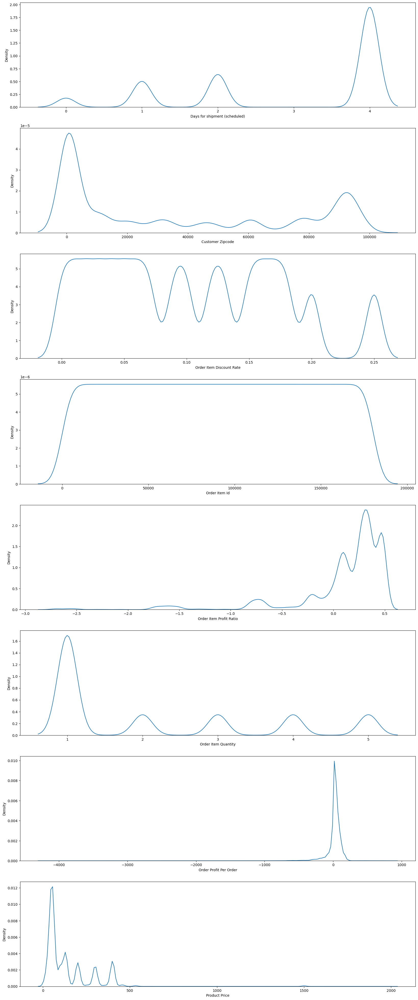

In [89]:
l      =   X_.columns
plt.figure(figsize = (20,50))
for i in range(l.shape[0]):
    plt.subplot(l.shape[0],1,i+1)
    sns.kdeplot(X_[l[i]])
    #plt.text(1, 1, l[i], horizontalalignment='left', size='medium', color='black', weight='semibold')
    plt.xlabel(l[i])
plt.show()

### Observation
None of the variables are normally distributed.

### c) Presence of outliers and its treatment

we set the values of a lower and higher percentile.

We use quantile() to return values at the given quantile within the specified range. Then, we cap the values in series below and above the threshold according to the percentile values.

We replace all of the values of the pandas series in the lower 5th percentile and the values greater than the 95th percentile with respective 5th and 95th percentile values.

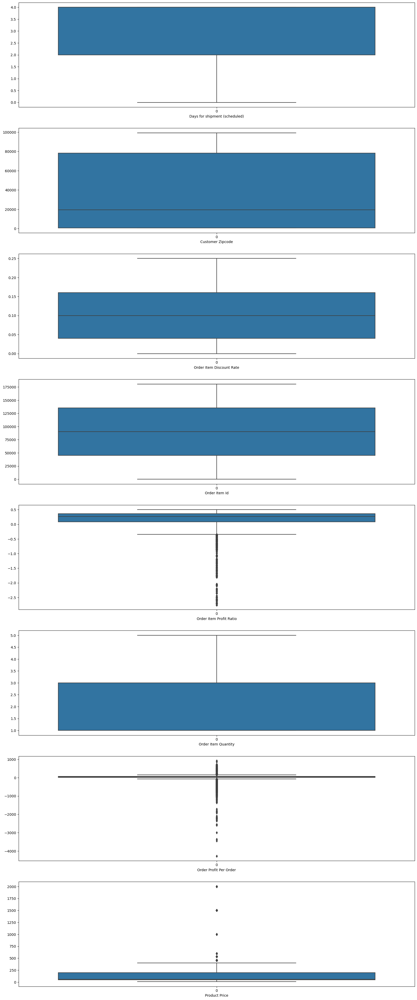

In [90]:
warnings.filterwarnings("ignore")
l = X_.columns
plt.figure(figsize = (20,50))
for i in range(l.shape[0]):
    plt.subplot(l.shape[0],1,i+1)
    sns.boxplot(X_[l[i]])
    #plt.text(1, 1, l[i], horizontalalignment='left', size='medium', color='black', weight='semibold')
    plt.xlabel(l[i])
plt.show()

### Observations

* Days for shipment (scheduled) - No outliers
* Customer Zipcode  - No outliers
* Order Item Discount Rate - No outliers
* Order Item Id - No outliers
* Order Item Profit Ratio - Outliers
* Order Item Quantity - No outliers
* Order Profit Per Order - Outliers
* Product Price - Outliers

Let us check if the outliers are valid values.

In [91]:
X_['Order Item Profit Ratio'].describe()

count    180519.000000
mean          0.120647
std           0.466796
min          -2.750000
25%           0.080000
50%           0.270000
75%           0.360000
max           0.500000
Name: Order Item Profit Ratio, dtype: float64

### Observation

Order item profit ratio can be negative and thus lower outliers. We shall not treat this outlier.

### d) statistical significance of variables

### Normality Tests

#### Shapiro-Wilk Test

Tests whether a data sample has a Gaussian distribution.

Assumptions

Observations in each sample are independent and identically distributed (iid).
Interpretation

H0: the sample has a Gaussian distribution.

H1: the sample does not have a Gaussian distribution.

In [92]:
def Shapiro_Wilk(df, col1):
    from scipy.stats import shapiro
    x          =  df[col1]
    stat, p    =  shapiro(x)
    print('stat=%.3f, p=%.3f' % (stat, p))
    if p > 0.05:
     print('{} Probably Gaussian'.format(col1))
    else:
     print('{} Probably not Gaussian'.format(col1))

In [93]:
colsn   =  ['Days for shipment (scheduled)', 'Customer Zipcode', 'Order Item Discount Rate',\
            'Order Item Id', 'Order Item Profit Ratio', 'Order Item Quantity','Order Profit Per Order',\
            'Product Price']
for  col1 in colsn:
    Shapiro_Wilk(X_, col1)

stat=0.722, p=0.000
Days for shipment (scheduled) Probably not Gaussian
stat=0.796, p=0.000
Customer Zipcode Probably not Gaussian
stat=0.946, p=0.000
Order Item Discount Rate Probably not Gaussian
stat=0.955, p=0.000
Order Item Id Probably not Gaussian
stat=0.676, p=0.000
Order Item Profit Ratio Probably not Gaussian
stat=0.744, p=0.000
Order Item Quantity Probably not Gaussian
stat=0.680, p=0.000
Order Profit Per Order Probably not Gaussian
stat=0.700, p=0.000
Product Price Probably not Gaussian


###  Calculate Correlation Between Continuous & Binary Target Variable

Point biserial correlation is used to calculate the correlation between a binary categorical variable (a variable that can only take on two values) and a continuous variable and has the following properties:

Point biserial correlation can range between -1 and 1.
For each group created by the binary variable, it is assumed that the continuous variable is normally distributed with equal variances.
For each group created by the binary variable, it is assumed that there are no extreme outliers.

The hypotheses for point biserial correlation thus result in:

Null hypothesis: The correlation coefficient r = 0 (There is no correlation)

Alternative hypothesis: The correlation coefficient r ≠ 0 (There is a correlation)

In [94]:
def pointbiserialr(df, col1, y):
    x   =  df[col1]
    stat, p    =  stats.pointbiserialr(y, x)
    print('stat=%.3f, p=%.3f' % (stat, p))
    if p > 0.05:
     print('{} There is no correlation'.format(col1))
    else:
     print('{} There is a correlation'.format(col1))

In [95]:
Target   =  df['Target']
for  col1 in colsn:
    x   =  X_[col1]
    y   =  df['Target']
    pointbiserialr(df, col1, y)

stat=-0.003, p=0.282
Days for shipment (scheduled) There is no correlation
stat=-0.006, p=0.009
Customer Zipcode There is a correlation
stat=0.002, p=0.306
Order Item Discount Rate There is no correlation
stat=0.002, p=0.326
Order Item Id There is no correlation
stat=-0.002, p=0.310
Order Item Profit Ratio There is no correlation
stat=-0.001, p=0.748
Order Item Quantity There is no correlation
stat=-0.001, p=0.531
Order Profit Per Order There is no correlation
stat=0.000, p=0.857
Product Price There is no correlation


### Observations

There is **no correlation** between the following variables and the Target binary variable:

1) Days for shipment (scheduled)

2) Order Item Discount Rate

3) Order Item Id

4) Order Item Profit Ratio

5) Order Item Quantity

6) Order Profit Per Order

7) Product Price

There is **a correlation** between the following variables and the Target binary variable:
1) Customer Zipcode

In [96]:
cat_df  = df.select_dtypes(exclude=['int64','float64'])

In [97]:
cat_df.columns

Index(['Type', 'Delivery Status', 'Late_delivery_risk', 'Category Name',
       'Customer City', 'Customer Country', 'Customer Segment',
       'Customer State', 'Customer Street', 'Department Name', 'Market',
       'Order City', 'Order Country', 'Order Region', 'Order State',
       'Order Status', 'Product Name', 'Shipping Mode', 'Shipping weekday',
       'Shipping month', 'order weekday', 'order month', 'Target'],
      dtype='object')

### Chi sqaure test of independence

The objective is to determine whether the association between two qualitative variables is statistically significant. The formulation of the hypotheses for this statistical analysis is something like this. 

Null Hypothesis (H0): There is no substantial relationship between the two variables (in case of independence test), or there is no difference

Alternative Hypothesis (H1): There is a substantial relationship between the two variables (in case of independence test), or there is a difference

Read more at: https://analyticsindiamag.com/ai-mysteries/how-to-use-the-chi-square-test-for-two-categorical-variables/

In [98]:
def chisqr(df, col1, y):
    import scipy.stats 
    from scipy.stats import chi2
    x             =  df[col1]
    ct_table_ind  =  pd.crosstab(df[col1], y) 
    chi2_stat, p, dof, expected = scipy.stats.chi2_contingency(ct_table_ind)
    print('chi2_stat = %.3f, p=%.3f' % (chi2_stat, p))
    if p > 0.05:
     print('There is no substantial relationship between the two variables {0} and {1}'.format(col1,'Target'))
    else:
     print('There is a substantial relationship between the two variables {0} and {1}'.format(col1,'Target'))


## Read more at: https://analyticsindiamag.com/ai-mysteries/how-to-use-the-chi-square-test-for-two-categorical-variables/

In [99]:
Target   =  df['Target']
colscat  =  cat_df.columns
for  col1 in colscat:
    x   =  df[col1]
    y   =  df['Target']
    chisqr(df, col1, y)

chi2_stat = 10882.640, p=0.000
There is a substantial relationship between the two variables Type and Target
chi2_stat = 92587.832, p=0.000
There is a substantial relationship between the two variables Delivery Status and Target
chi2_stat = 5041.756, p=0.000
There is a substantial relationship between the two variables Late_delivery_risk and Target
chi2_stat = 42.761, p=0.723
There is no substantial relationship between the two variables Category Name and Target
chi2_stat = 1981.037, p=0.000
There is a substantial relationship between the two variables Customer City and Target
chi2_stat = 8.146, p=0.004
There is a substantial relationship between the two variables Customer Country and Target
chi2_stat = 14.575, p=0.001
There is a substantial relationship between the two variables Customer Segment and Target
chi2_stat = 134.047, p=0.000
There is a substantial relationship between the two variables Customer State and Target
chi2_stat = 24019.533, p=0.000
There is a substantial relationsh

### Observation

1) There is a substantial relationship between the two variables Type and Target since chi2_stat = 10882.640, p=0.000

2) There is a substantial relationship between the two variables Delivery Status and Target since chi2_stat = 92587.832, p=0.000

3) There is a substantial relationship between the two variables Late_delivery_risk and Target since chi2_stat = 5041.756, p=0.000

4) There is **no substantial relationship** between the two variables Category Name and Target since chi2_stat = 42.761, p=0.723

5) There is a substantial relationship between the two variables Customer City and Target since chi2_stat = 1981.037, p=0.000

6) There is a substantial relationship between the two variables Customer Country and Target since chi2_stat = 8.146, p=0.004

7) There is a substantial relationship between the two variables Customer Segment and Target since chi2_stat = 14.575, p=0.001

8) There is a substantial relationship between the two variables Customer State and Target since chi2_stat = 134.107, p=0.000

9) There is a substantial relationship between the two variables Customer Street and Target since chi2_stat = 23534.840, p=0.000

10) There is **no substantial relationship** between the two variables Department Name and Target since chi2_stat = 3.452, p=0.969

11) There is **no substantial relationship** between the two variables Market and Target since chi2_stat = 8.951, p=0.062

12) There is a substantial relationship between the two variables Order City and Target since chi2_stat = 11748.568, p=0.000

13) There is a substantial relationship between the two variables Order Country and Target since chi2_stat = 503.234, p=0.000

14) There is a substantial relationship between the two variables Order Region and Target since chi2_stat = 83.035, p=0.000

15) There is a substantial relationship between the two variables Order State and Target since chi2_stat = 4135.204, p=0.000

16) There is **no substantial relationship** between the two variables Product Name and Target since chi2_stat = 103.267, p=0.814

17) There is a substantial relationship between the two variables Shipping Mode and Target since chi2_stat = 8.462, p=0.037

18) There is **no substantial relationship** between the two variables Shipping weekday and Target since chi2_stat = 9.016, p=0.173

19) There is a substantial relationship between the two variables Shipping month and Target since chi2_stat = 39.913, p=0.000

20) There is a substantial relationship between the two variables order weekday and Target since chi2_stat = 48.325, p=0.000

21) There is a substantial relationship between the two variables order month and Target since chi2_stat = 38.415, p=0.000

22) There is a substantial relationship between the two variables Target and Target since chi2_stat = 180473.539, p=0.000

### e) Class imbalance and its treatment

In [100]:
X   =   df[Xnames]
y   =   df['Target']

In [101]:
df['Target']    =    df['Target'].astype('object')
counts          =    df['Target'].value_counts()
percs           =    df['Target'].value_counts(normalize = True)
pd.concat([counts,percs], axis=1, keys=['count', 'percentage'])

,count,percentage
Target,,
0,176457,0.977498
1,4062,0.022502


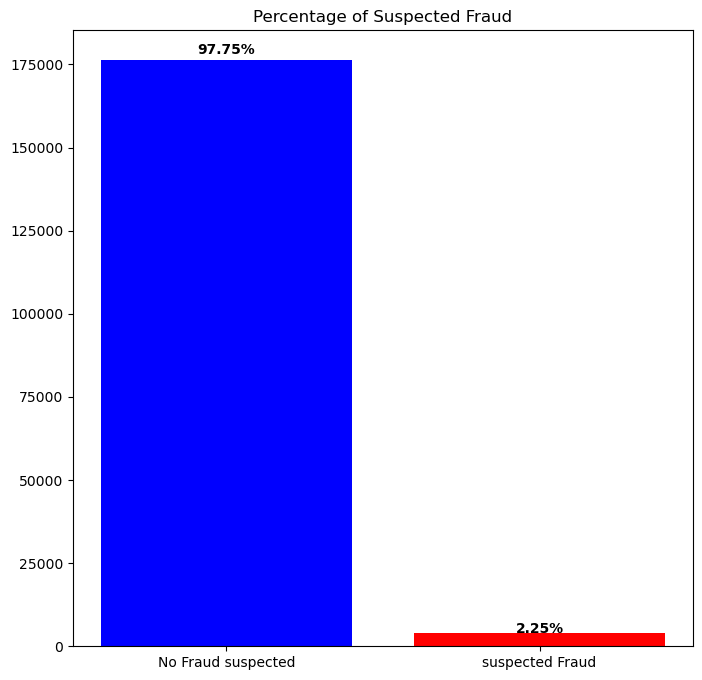

In [102]:
data            =   pd.DataFrame({'Target':['No Fraud suspected','suspected Fraud'],
                     'Count':[176457, 4062]
                    })

total_Count     =   180519
# compute percentage of each format
percentage = []
for i in range(data.shape[0]):
    pct = (data.Count[i] / total_Count) * 100
    percentage.append(round(pct,2))
data['Percentage'] = percentage

# depict illustration
plt.figure(figsize=(8,8))
colors_list = ['Blue','Red']
graph = plt.bar(data.Target,data.Count, color = colors_list)
plt.title('Percentage of Suspected Fraud')

i = 0
for p in graph:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    plt.text(x+width/2,
             y+height*1.01,
             str(data.Percentage[i])+'%',
             ha='center',
             weight='bold')
    i+=1
plt.show()

### Observations

1. Dataset is **highly imbalanced** as the minority class, ** 1** denoting suspected fraud is having around 2.25% of observations while the other class, **'0'** denoting "No fraud" is having the balance of 97.75% of the observations.

2. So, we need to choose the model performance measure carefully to avoid bias to the majority class.

3. Precision and recall are common metrics used when evaluating classification models for detection of a certain important class. Recall represents how many samples of the important. class was discovered by the model of all the samples in the class, while precision represents the accuracy of predictions for that certain class. In this application, the important class is "Suspected Fraud". True positives is the number of correctly identified data points of the important class, False positives is the number of data points incorrectly identified as important and False negatives is the number of data points incorrectly identified as not important.

### SMOTE

problem with imbalanced classification is that there are too few examples of the minority class for a model to effectively learn the decision boundary.

One way to solve this problem is to oversample the examples in the minority class. This can be achieved by simply duplicating examples from the minority class in the training dataset prior to fitting a model. This can balance the class distribution but does not provide any additional information to the model.

An improvement on duplicating examples from the minority class is to synthesize new examples from the minority class. This is a type of data augmentation for tabular data and can be very effective.

Perhaps the most widely used approach to synthesizing new examples is called the Synthetic Minority Oversampling TEchnique, or SMOTE for short. This technique was described by Nitesh Chawla, et al. in their 2002 paper named for the technique titled “SMOTE: Synthetic Minority Over-sampling Technique.”

SMOTE works by selecting examples that are close in the feature space, drawing a line between the examples in the feature space and drawing a new sample at a point along that line.

Specifically, a random example from the minority class is first chosen. Then k of the nearest neighbors for that example are found (typically k=5). A randomly selected neighbor is chosen and a synthetic example is created at a randomly selected point between the two examples in feature space.

We shall apply SMOTE on training data

### Feature Engineering

#### 1) Whether any transformations required
#### 2) Scaling the data
#### 3) Feature selection 
#### 4) Dimensionality reduction

### 1) Whether any transformations required

Data transformation is used when data needs to be converted to match that of the destination system.


* We have extracted Shipping_month, Shipping_weekday from the variable, shipping date (DateOrders).
* We have extracted order_month, order_weekday from the variable, order date (DateOrders).
* We have derived our target variable, Target from the variable, Order Status by assining the value 1 for Order Status = "SUSPECTED FRAUD" else 0.
* We need to perform label encoding to make our data suitable for model building.

### Perform Label encoding

In Python Label Encoding, we need to replace the categorical value using a numerical value ranging between zero and the total number of classes minus one. REf: https://www.javatpoint.com/label-encoding-in-python

In [103]:
def  label_enc(df, col):
     colx      =  col + '_code'
     df[colx]   =  my_label.fit_transform(df[col])  

In [104]:
new_df            =   X.copy()
new_df['Target']  =   df['Target']

In [105]:
new_df.columns

Index(['Type', 'Delivery Status', 'Late_delivery_risk', 'Category Name',
       'Customer City', 'Customer Country', 'Customer Segment',
       'Customer State', 'Customer Street', 'Department Name', 'Market',
       'Order City', 'Order Country', 'Order Region', 'Order State',
       'Product Name', 'Shipping Mode', 'Shipping weekday', 'Shipping month',
       'order weekday', 'order month', 'Days for shipment (scheduled)',
       'Customer Zipcode', 'Order Item Discount Rate', 'Order Item Id',
       'Order Item Profit Ratio', 'Order Item Quantity',
       'Order Profit Per Order', 'Product Price', 'Target'],
      dtype='object')

In [106]:
my_label          =  preprocessing.LabelEncoder()   
cat_newdf         =  new_df.select_dtypes(exclude=['int64','float64'])
cat_cols          =  cat_newdf.columns
for col in cat_cols:
    label_enc(new_df, col)

### 2) Scaling the data

In Data Processing, we try to change the data in such a way that the model can process it without any problems. And Feature Scaling is one such process in which we transform the data into a better version. Feature Scaling is done to normalize the features in the dataset into a finite range.

The concept of standardization comes into picture when continuous independent variables are measured at different scales.
https://www.listendata.com/2017/04/how-to-standardize-variable-in-regression.html

Data scaling is applied to numeric columns. In our dataset we have six continuous numerical columns:. 
1) Days for shipment (scheduled)
2) Order Item Discount Rate
3) Order Item Profit Ratio
4) Order Item Quantity
5) Order Profit Per Order
6) Product Price

The script below filters these **six** columns and removes the remaining columns.

In [107]:
data_numeric = new_df.filter(['Days for shipment (scheduled)', 'Order Item Discount Rate',
'Order Item Profit Ratio', 'Order Item Quantity', 'Order Profit Per Order', 'Product Price'], axis = 1)

data_numeric.head()

,Days for shipment (scheduled),Order Item Discount Rate,Order Item Profit Ratio,Order Item Quantity,Order Profit Per Order,Product Price
33833,4,0.20,0.37,1,88.790001,299.980011
109322,4,0.09,0.30,5,68.250000,50.000000
87884,4,0.17,0.34,1,36.470001,129.990005
77011,4,0.03,0.47,1,91.180000,199.990005
63764,4,0.18,0.10,2,4.100000,24.990000


Let’s plot some statistical values for the columns in our dataset using the describe() method.

In [108]:
data_numeric.describe()

,Days for shipment (scheduled),Order Item Discount Rate,Order Item Profit Ratio,Order Item Quantity,Order Profit Per Order,Product Price
count,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000,180519.000000
mean,2.931847,0.101668,0.120647,2.127638,21.974989,141.232550
std,1.374449,0.070415,0.466796,1.453451,104.433526,139.732492
min,0.000000,0.000000,-2.750000,1.000000,-4274.979980,9.990000
25%,2.000000,0.040000,0.080000,1.000000,7.000000,50.000000
50%,4.000000,0.100000,0.270000,1.000000,31.520000,59.990002
75%,4.000000,0.160000,0.360000,3.000000,64.800003,199.990005
max,4.000000,0.250000,0.500000,5.000000,911.799988,1999.989990



### Robust Scaling:

Robust Scaler effectively handles outliers in data by using the median and interquartile range for scaling.
Preserves Data Relationships:

It normalizes data while keeping the relative distances between data points intact.
Enhanced Model Performance:

Applying Robust Scaler improves model performance in machine learning tasks sensitive to feature scaling.


In [109]:
from sklearn.preprocessing import RobustScaler

mms               = RobustScaler()
data_numeric_mns  = mms.fit_transform(data_numeric)

In [110]:
data_numeric_mns_df  = pd.DataFrame(data_numeric_mns,
                              columns = data_numeric.columns)
data_numeric_mns_df.head()

,Days for shipment (scheduled),Order Item Discount Rate,Order Item Profit Ratio,Order Item Quantity,Order Profit Per Order,Product Price
0,0.0,0.833333,0.357143,0.0,0.990830,1.600040
1,0.0,-0.083333,0.107143,2.0,0.635467,-0.066604
2,0.0,0.583333,0.250000,0.0,0.085640,0.466698
3,0.0,-0.583333,0.714286,0.0,1.032180,0.933396
4,0.0,0.666667,-0.607143,0.5,-0.474394,-0.233349


###  Feature selection

## Automatically select the number of features

The RFE method is available via the RFE class in scikit-learn.

RFE is a transform. To use it, first the class is configured with the chosen algorithm specified via the “estimator” argument and the number of features to select via the “n_features_to_select” argument.

The algorithm must provide a way to calculate important scores, such as a decision tree. The algorithm used in RFE does not have to be the algorithm that is fit on the selected features; different algorithms can be used.

Once configured, the class must be fit on a training dataset to select the features by calling the fit() function. After the class is fit, the choice of input variables can be seen via the “support_” attribute that provides a True or False for each input variable.

It can then be applied to the dataset by calling the transform() function.

In [111]:
###
### We need to remove the not-standardized 6 columns and add standardised 6 columns
###
new_df.drop('Days for shipment (scheduled)', axis = 1, inplace = True)
new_df.drop('Order Item Discount Rate',      axis = 1, inplace = True)
new_df.drop('Order Item Profit Ratio',       axis = 1, inplace = True)
new_df.drop('Order Item Quantity',           axis = 1, inplace = True)
new_df.drop('Order Profit Per Order',        axis = 1, inplace = True)
new_df.drop('Product Price',                 axis = 1, inplace = True)                        

new_df['Days for shipment (scheduled)']    =  data_numeric_mns_df['Days for shipment (scheduled)'] 
new_df['Order Item Discount Rate']         =  data_numeric_mns_df['Order Item Discount Rate'] 
new_df['Order Item Profit Ratio']          =  data_numeric_mns_df['Order Item Profit Ratio'] 
new_df['Order Item Quantity']              =  data_numeric_mns_df['Order Item Quantity'] 
new_df['Order Profit Per Order']           =  data_numeric_mns_df['Order Profit Per Order'] 
new_df['Product Price']                    =  data_numeric_mns_df['Product Price'] 

# Adding the target variable
new_df['Target']                           =  df['Target']


In [112]:
y             =    new_df['Target']
X             =    new_df.drop(['Target'], axis = 1)                       
print('X dimension {}'. format(X.shape))
print('y dimension {}'. format(y.shape))

X dimension (180519, 51)
y dimension (180519,)


In [113]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 180519 entries, 33833 to 17863
Data columns (total 52 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Type                           180519 non-null  object 
 1   Delivery Status                180519 non-null  object 
 2   Late_delivery_risk             180519 non-null  object 
 3   Category Name                  180519 non-null  object 
 4   Customer City                  180519 non-null  object 
 5   Customer Country               180519 non-null  object 
 6   Customer Segment               180519 non-null  object 
 7   Customer State                 180519 non-null  object 
 8   Customer Street                180519 non-null  object 
 9   Department Name                180519 non-null  object 
 10  Market                         180519 non-null  object 
 11  Order City                     180519 non-null  object 
 12  Order Country                  1

In [114]:
new_df.columns

Index(['Type', 'Delivery Status', 'Late_delivery_risk', 'Category Name',
       'Customer City', 'Customer Country', 'Customer Segment',
       'Customer State', 'Customer Street', 'Department Name', 'Market',
       'Order City', 'Order Country', 'Order Region', 'Order State',
       'Product Name', 'Shipping Mode', 'Shipping weekday', 'Shipping month',
       'order weekday', 'order month', 'Customer Zipcode', 'Order Item Id',
       'Target', 'Type_code', 'Delivery Status_code',
       'Late_delivery_risk_code', 'Category Name_code', 'Customer City_code',
       'Customer Country_code', 'Customer Segment_code', 'Customer State_code',
       'Customer Street_code', 'Department Name_code', 'Market_code',
       'Order City_code', 'Order Country_code', 'Order Region_code',
       'Order State_code', 'Product Name_code', 'Shipping Mode_code',
       'Shipping weekday_code', 'Shipping month_code', 'order weekday_code',
       'order month_code', 'Target_code', 'Days for shipment (schedul

In [115]:
new_df.dtypes

Type                              object
Delivery Status                   object
Late_delivery_risk                object
Category Name                     object
Customer City                     object
Customer Country                  object
Customer Segment                  object
Customer State                    object
Customer Street                   object
Department Name                   object
Market                            object
Order City                        object
Order Country                     object
Order Region                      object
Order State                       object
Product Name                      object
Shipping Mode                     object
Shipping weekday                  object
Shipping month                    object
order weekday                     object
order month                       object
Customer Zipcode                 float64
Order Item Id                      int64
Target                            object
Type_code       

In [116]:
X    =   new_df[['Days for shipment (scheduled)', 'Order Item Discount Rate' ,'Order Item Id',
                 'Order Item Profit Ratio','Order Item Quantity','Order Profit Per Order',
                 'Product Price','Customer Zipcode','Type_code',
       'Delivery Status_code', 'Late_delivery_risk_code', 'Category Name_code',
       'Customer City_code', 'Customer Country_code', 'Customer Segment_code',
       'Customer State_code', 'Customer Street_code', 'Department Name_code',
       'Market_code', 'Order City_code', 'Order Country_code',
       'Order Region_code', 'Order State_code', 'Product Name_code',
       'Shipping Mode_code', 'Shipping weekday_code', 'Shipping month_code',
       'order weekday_code', 'order month_code', 'Target_code']]

In [117]:
y             =    X['Target_code']
X             =    X.drop(['Target_code'], axis = 1)                       
print('X dimension {}'. format(X.shape))
print('y dimension {}'. format(y.shape))

X dimension (180519, 29)
y dimension (180519,)


In [118]:
# create pipeline
rfe                    =     RFE(estimator = RandomForestClassifier(), n_features_to_select = 15)
model                  =     RandomForestClassifier(random_state = 42)
pipeline               =     Pipeline(steps=[('s',rfe),('m',model)])
# evaluate model
cv                     =    RepeatedStratifiedKFold(n_splits = 10, n_repeats = 3, random_state = 1)
n_scores               =    cross_val_score(pipeline, X, y, scoring = 'balanced_accuracy', cv = cv, n_jobs = -1, error_score = 'raise')


In [119]:
# report performance
print('balanced_accuracy: %.3f (%.3f)' % (np.mean(n_scores), np.std(n_scores)))

balanced_accuracy: 0.963 (0.007)


### Observation

we can see the RFE that uses a Random Forest and selects 15 features and then fits a model on the selected features achieves a balanced accuracy of about 96.2 %. 

**Balanced accuracy** in binary and multiclass classification problems to deal with imbalanced datasets. It is defined as the average of recall obtained on each class.

Fit an RFE model on the whole dataset and selects five features, then reports each feature column index (0 to 9), whether it was selected or not (True or False), and the relative feature ranking.

The “support_” attribute reports true or false as to which features in order of column index were included and the “ranking_” attribute reports the relative ranking of features in the same order.

In [120]:
# fit RFE
rfe.fit(X, y)
# summarize all features
for i in range(X.shape[1]):
 print('Column: %d, Selected %s, Rank: %.3f' % (i, rfe.support_[i], rfe.ranking_[i]))

Column: 0, Selected False, Rank: 14.000
Column: 1, Selected False, Rank: 7.000
Column: 2, Selected True, Rank: 1.000
Column: 3, Selected False, Rank: 4.000
Column: 4, Selected False, Rank: 13.000
Column: 5, Selected False, Rank: 3.000
Column: 6, Selected False, Rank: 8.000
Column: 7, Selected True, Rank: 1.000
Column: 8, Selected True, Rank: 1.000
Column: 9, Selected True, Rank: 1.000
Column: 10, Selected False, Rank: 5.000
Column: 11, Selected False, Rank: 9.000
Column: 12, Selected True, Rank: 1.000
Column: 13, Selected False, Rank: 15.000
Column: 14, Selected False, Rank: 10.000
Column: 15, Selected False, Rank: 2.000
Column: 16, Selected True, Rank: 1.000
Column: 17, Selected False, Rank: 12.000
Column: 18, Selected False, Rank: 11.000
Column: 19, Selected True, Rank: 1.000
Column: 20, Selected True, Rank: 1.000
Column: 21, Selected True, Rank: 1.000
Column: 22, Selected True, Rank: 1.000
Column: 23, Selected False, Rank: 6.000
Column: 24, Selected True, Rank: 1.000
Column: 25, Sel

In [121]:
x_names   =   X.columns
for i in range(X.shape[1]):
     namex    =  x_names[i]
     print('Column: %d, Name: %s Selected %s, Rank: %.3f' % (i, namex, rfe.support_[i], rfe.ranking_[i]))

Column: 0, Name: Days for shipment (scheduled) Selected False, Rank: 14.000
Column: 1, Name: Order Item Discount Rate Selected False, Rank: 7.000
Column: 2, Name: Order Item Id Selected True, Rank: 1.000
Column: 3, Name: Order Item Profit Ratio Selected False, Rank: 4.000
Column: 4, Name: Order Item Quantity Selected False, Rank: 13.000
Column: 5, Name: Order Profit Per Order Selected False, Rank: 3.000
Column: 6, Name: Product Price Selected False, Rank: 8.000
Column: 7, Name: Customer Zipcode Selected True, Rank: 1.000
Column: 8, Name: Type_code Selected True, Rank: 1.000
Column: 9, Name: Delivery Status_code Selected True, Rank: 1.000
Column: 10, Name: Late_delivery_risk_code Selected False, Rank: 5.000
Column: 11, Name: Category Name_code Selected False, Rank: 9.000
Column: 12, Name: Customer City_code Selected True, Rank: 1.000
Column: 13, Name: Customer Country_code Selected False, Rank: 15.000
Column: 14, Name: Customer Segment_code Selected False, Rank: 10.000
Column: 15, Name:

In [122]:
selected_X  =   []

In [123]:
for i in range(X.shape[1]):
     namex    =  x_names[i]
     if (rfe.support_[i] == True):
         selected_X.append(namex)
         print('Column: %d, Name: %s Selected %s, Rank: %.3f' % (i, namex, rfe.support_[i], rfe.ranking_[i]))
print("\nSelected important features {}".format(selected_X))

Column: 2, Name: Order Item Id Selected True, Rank: 1.000
Column: 7, Name: Customer Zipcode Selected True, Rank: 1.000
Column: 8, Name: Type_code Selected True, Rank: 1.000
Column: 9, Name: Delivery Status_code Selected True, Rank: 1.000
Column: 12, Name: Customer City_code Selected True, Rank: 1.000
Column: 16, Name: Customer Street_code Selected True, Rank: 1.000
Column: 19, Name: Order City_code Selected True, Rank: 1.000
Column: 20, Name: Order Country_code Selected True, Rank: 1.000
Column: 21, Name: Order Region_code Selected True, Rank: 1.000
Column: 22, Name: Order State_code Selected True, Rank: 1.000
Column: 24, Name: Shipping Mode_code Selected True, Rank: 1.000
Column: 25, Name: Shipping weekday_code Selected True, Rank: 1.000
Column: 26, Name: Shipping month_code Selected True, Rank: 1.000
Column: 27, Name: order weekday_code Selected True, Rank: 1.000
Column: 28, Name: order month_code Selected True, Rank: 1.000

Selected important features ['Order Item Id', 'Customer Zip

### Observation

We have selected 15 features which are important in predicting the target variable.

**We shall use this data for our model building.**

In [125]:
X_   =    X.loc[:, selected_X]

X_.to_csv(r"E:\GL\Capstone.csv", index = False)
y.to_csv(r"E:\GL\Capstone.csv", index = False)

In [126]:
X_.shape

(180519, 15)

In [127]:
time_elapsed = datetime.now() - start_time 

print('Time elapsed (hh:mm:ss.ms) {}'.format(time_elapsed))

Time elapsed (hh:mm:ss.ms) 0:28:02.513219


###  Dimensionality reduction

Since we have selected top 15 variables affecting the dependent variable, our dataset is Not Huge. We are not going to apply dimensionality reduction such as Principal Component Analysis or Factor Analysis etc.

We use PCA when you have high-dimensional data to reduce its dimensionality while preserving most of the variance, simplifying analysis and visualization.

## 4) Model evaluation

###  Base Model

In [128]:
mod=[]
acc_train=[]
pre_train=[]
rec_train=[]
f1_train=[]
ck_train=[]
acc_test=[]
pre_test=[]
rec_test=[]
f1_test=[]
ck_test=[]
from sklearn.metrics import *
def model_validation(model,x_train,y_train,x_test,y_test):
    m=model
    m.fit(x_train,y_train)
    hard_train=m.predict(x_train)
    hard_test=m.predict(x_test)
    soft_test=m.predict_proba(x_test)[:,1]
    
    print('classification report\n',classification_report(y_test,hard_test))
    fpr,tpr,thres=roc_curve(y_test,soft_test)
    plt.title(f'ROC AUC:{round(roc_auc_score(y_test,soft_test),3)}')
    plt.plot(fpr,tpr)
    plt.plot([0,1],[0,1],ls='--',color='red')
    plt.show()

    con_mat=confusion_matrix(y_test,hard_test)
    sns.heatmap(con_mat,annot=True)
    plt.show()
    
    inp=input('Do you want to save the model in score card? Y/N')
    if inp.lower()=='y':
        global scorecard_train,scorecard_test
        mod.append(str(model))
        acc_test.append(accuracy_score(y_test,hard_test))
        pre_test.append(precision_score(y_test,hard_test))
        rec_test.append(recall_score(y_test,hard_test))
        f1_test.append(f1_score(y_test,hard_test))
        ck_test.append(cohen_kappa_score(y_test,hard_test))
        scorecard_test=pd.DataFrame({'Model':mod,'Accuracy_test':acc_test,'Precision_test':pre_test,'Recall_test':rec_test,'f1_score_test':f1_test,'Cohen_kappa_test':ck_test})
        acc_train.append(accuracy_score(y_train,hard_train))
        pre_train.append(precision_score(y_train,hard_train))
        rec_train.append(recall_score(y_train,hard_train))
        f1_train.append(f1_score(y_train,hard_train))
        ck_train.append(cohen_kappa_score(y_train,hard_train))
        scorecard_train=pd.DataFrame({'Model':mod,'Accuracy_train':acc_train,'Precision_train':pre_train,'Recall_train':rec_train,'f1_score_train':f1_train,'Cohen_kappa_train':ck_train})


In [129]:
X_

,Order Item Id,Customer Zipcode,Type_code,Delivery Status_code,Customer City_code,Customer State_code,Customer Street_code,Order City_code,Order Country_code,Order State_code,Shipping Mode_code,Shipping weekday_code,Shipping month_code,order weekday_code,order month_code
33833,1,28601.0,0,0,218,24,6384,2075,102,292,3,2,4,4,4
109322,3,60625.0,2,0,88,13,5510,922,33,852,3,3,4,4,4
87884,4,60625.0,2,0,88,13,5510,922,33,852,3,3,4,4,4
77011,2,60625.0,2,0,88,13,5510,922,33,852,3,3,4,4,4
63764,5,78240.0,0,1,447,38,6113,922,33,852,3,5,4,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160537,180515,725.0,3,1,66,34,7349,331,70,475,3,5,3,6,4
93905,180516,60544.0,1,0,398,13,4139,331,70,475,3,0,3,6,4
0,180517,725.0,1,0,66,34,3683,331,70,475,3,2,3,6,4
52147,180518,60402.0,2,3,42,13,1916,331,70,475,3,3,3,6,4


In [130]:
y

33833     0
109322    0
87884     0
77011     0
63764     0
         ..
160537    0
93905     0
0         0
52147     0
17863     0
Name: Target_code, Length: 180519, dtype: int32

In [131]:
xtrain,xtest,ytrain,ytest = train_test_split(X_,y,test_size=0.3,random_state=100)

classification report
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     52933
           1       0.92      0.92      0.92      1223

    accuracy                           1.00     54156
   macro avg       0.96      0.96      0.96     54156
weighted avg       1.00      1.00      1.00     54156



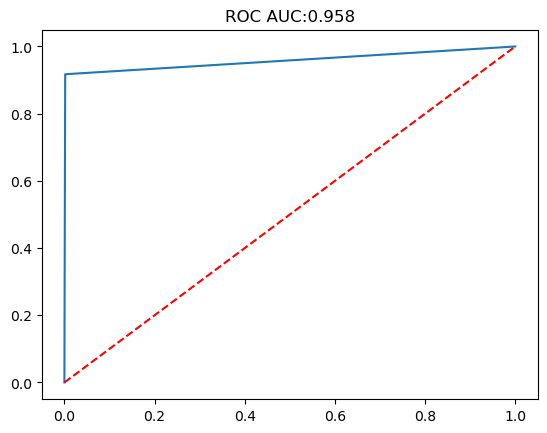

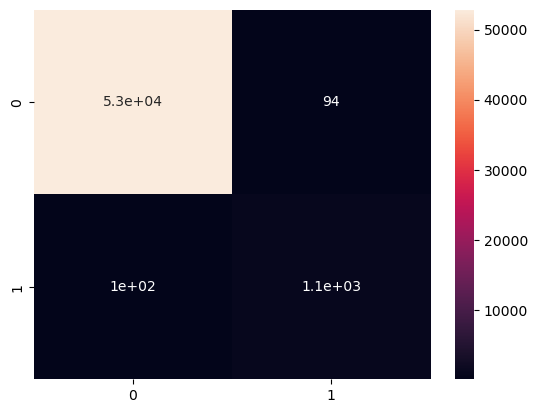

Do you want to save the model in score card? Y/Ny


In [132]:
model_validation(DecisionTreeClassifier(),xtrain,ytrain,xtest,ytest)

In [133]:
scorecard_train

,Model,Accuracy_train,Precision_train,Recall_train,f1_score_train,Cohen_kappa_train
0,DecisionTreeClassifier(),1.0,1.0,1.0,1.0,1.0


In [134]:
scorecard_test

,Model,Accuracy_test,Precision_test,Recall_test,f1_score_test,Cohen_kappa_test
0,DecisionTreeClassifier(),0.996399,0.922697,0.917416,0.920049,0.918207


In [135]:
m=DecisionTreeClassifier()
m.fit(xtrain,ytrain)
hard_train=m.predict(xtrain)
hard_test=m.predict(xtest)
soft_test=m.predict_proba(xtest)[:,1]

In [136]:
xtrain.columns

Index(['Order Item Id', 'Customer Zipcode', 'Type_code',
       'Delivery Status_code', 'Customer City_code', 'Customer State_code',
       'Customer Street_code', 'Order City_code', 'Order Country_code',
       'Order State_code', 'Shipping Mode_code', 'Shipping weekday_code',
       'Shipping month_code', 'order weekday_code', 'order month_code'],
      dtype='object')

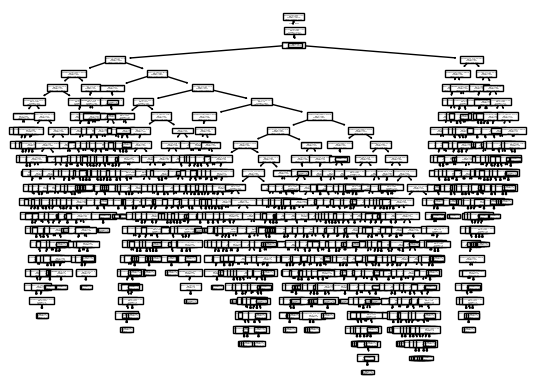

In [137]:
plot_tree(m,feature_names=list(xtrain.columns))
plt.show()

In [138]:
from sklearn.tree import DecisionTreeClassifier

# Assuming you have a trained decision tree model `model`
def extract_rules(model, feature_names):
    """
    Extracts rules from a decision tree.

    Args:
        model: The trained decision tree model.
        feature_names: A list of feature names.

    Returns:
        A list of extracted rules.
    """

    rules = []
    def _extract_rules_recursive(node, rule):
        if m.tree_.children_left[node] == -1:  # Leaf node
            rules.append(rule)
        else:
            feature = feature_names[m.tree_.feature[node]]
            threshold = m.tree_.threshold[node]
            left_rule = rule + f"{feature} <= {threshold}"
            right_rule = rule + f"{feature} > {threshold}"
            _extract_rules_recursive(m.tree_.children_left[node], left_rule)
            _extract_rules_recursive(m.tree_.children_right[node], right_rule)

    _extract_rules_recursive(0, "")  # Start from the root node
    return rules




In [139]:
feature_names = xtrain.columns
rules = extract_rules(m, feature_names)
print(rules)

['Delivery Status_code <= 1.5', 'Delivery Status_code > 1.5Delivery Status_code <= 2.5Customer Zipcode <= 90035.0Order City_code <= 702.5Customer Street_code <= 6528.5Order City_code <= 527.0Customer City_code <= 59.5order weekday_code <= 1.5Customer Street_code <= 2534.5', 'Delivery Status_code > 1.5Delivery Status_code <= 2.5Customer Zipcode <= 90035.0Order City_code <= 702.5Customer Street_code <= 6528.5Order City_code <= 527.0Customer City_code <= 59.5order weekday_code <= 1.5Customer Street_code > 2534.5Customer Street_code <= 4999.0', 'Delivery Status_code > 1.5Delivery Status_code <= 2.5Customer Zipcode <= 90035.0Order City_code <= 702.5Customer Street_code <= 6528.5Order City_code <= 527.0Customer City_code <= 59.5order weekday_code <= 1.5Customer Street_code > 2534.5Customer Street_code > 4999.0', 'Delivery Status_code > 1.5Delivery Status_code <= 2.5Customer Zipcode <= 90035.0Order City_code <= 702.5Customer Street_code <= 6528.5Order City_code <= 527.0Customer City_code <= 5

##### Dictdiffer is a helper module that helps you to diff and patch dictionaries.

In [140]:
### ! pip install dictdiffer # Remove the comment character "#" first time 

## Problem Statement

## Data Dictionary

## Import Libraries

In [141]:
! pip install catboost

In [142]:
import   pandas                   as      pd
import   numpy                    as      np
import   matplotlib.pyplot        as      plt

In [143]:
from   sklearn.svm                import    SVC
from   sklearn.ensemble           import    RandomForestClassifier
from   sklearn.model_selection    import    StratifiedKFold
from   sklearn.model_selection    import    StratifiedGroupKFold
from   sklearn.model_selection    import    RandomizedSearchCV

In [144]:
from    sklearn.linear_model    import  LogisticRegression
from    sklearn.tree            import  DecisionTreeClassifier
from    sklearn.neighbors       import  KNeighborsClassifier
from    sklearn.naive_bayes     import  GaussianNB
from    sklearn.ensemble        import  RandomForestClassifier    
from    xgboost                 import  XGBClassifier  
from    sklearn.ensemble        import  AdaBoostClassifier

In [145]:
from   sklearn.metrics            import  make_scorer, precision_score, recall_score, f1_score
from   sklearn.metrics            import  confusion_matrix, classification_report
from   sklearn.model_selection    import  train_test_split,cross_val_score,cross_val_predict

In [146]:
from dictdiffer import diff

In [147]:
performance_hyper_df       =    pd.DataFrame()

In [148]:
'''
We need to know what changed after getting the best parameters by performing hyper parameter tuning,
'''
def  what_changed(model_name, first_dict, second_dict):
### First dict 
       first_dictKeys = list(first_dict.keys())
       first_dictKeys.sort()
       first_sorted_dict = {i: first_dict[i] for i in first_dictKeys}
### Second dict 
       second_dictKeys = list(second_dict.keys())
       second_dictKeys.sort()
       second_sorted_dict = {i: second_dict[i] for i in second_dictKeys}

       result = diff(first_sorted_dict, second_sorted_dict)
       print("Model name {}".format(model_name))
       return list(result)

In [149]:
def  metrics_graph(df, model_names):
     print(df.columns)
     scores_req   =   ['roc_auc', 'precision', 'recall', 'F1 Weighted']
     for       scoring in   scores_req :
               df1      =  df.loc[df['Score'] == scoring, ['Name', 'Results']]
               df1.plot.box(column = "Results", by = "Name", figsize=(8, 6), grid=False, rot=90, fontsize = 15)
               txt      =  "Model performance using " + scoring
               plt.title(txt)
               plt.show()


### Zero division

https://scikit-learn.org/stable/modules/generated/sklearn.metrics.precision_score.html

zero_division{“warn”, 0.0, 1.0, np.nan}, default=”warn”
Sets the value to return when there is a zero division.

Notes: - If set to “warn”, this acts like 0, but a warning is also raised. - If set to np.nan, such values will be excluded from the average.

In [150]:
def evaluate_model_performance(model, name, X, y):
    from  sklearn.model_selection import  StratifiedKFold
    from  sklearn.model_selection import  cross_val_score

    # Predict the response for training dataset
    classifier   =  model.fit(X, y)
    scores_req   =  ['roc_auc', 'precision', 'recall', 'F1 Weighted']
    df_model     =  pd.DataFrame()
    for scoring in scores_req:
        score_fn  =  scoring         

        print("\nPerformance Measure : %s" %scoring)

        if scoring == 'F1 Weighted':
            score_fn  =  make_scorer (f1_score, average = 'weighted', zero_division = 0)

        skf           =   StratifiedKFold(n_splits = 10, shuffle = True, random_state = 12345)
        cv_results    =   cross_val_score(model, X, np.ravel(y,order="c"), cv = skf, scoring = score_fn)
        msg = "%s" % (str(round(cv_results.mean(),2)) + " ± " + str(round(cv_results.std(),2)))
        print(msg)
        df_measures_tuned.at[name, scoring] = round(cv_results.mean(),2)
        indices_      =   list(range(1, 11))
        df_ind        =   pd.DataFrame({'Score' : scoring, 'Name' : name, 'Resuts' : cv_results,\
                                        'Mean-Sd' : msg}, index = indices_)
        df_model      =   pd.concat([df_model, df_ind]) 
    return df_model

In [151]:
def get_default(model, X, y):
    model.fit(X, np.ravel(y,order="c"))
    print(model.get_params())
    return model.get_params()

In [152]:
def draw_cm( actual, predicted ):
    
    import matplotlib.pyplot as   plt
    import sklearn.metrics   as   metrics
    import seaborn           as   sns
    
    cm = metrics.confusion_matrix( actual, predicted)
    sns.heatmap(cm, annot=True, fmt='.2f', xticklabels = ["Yes", "No"] , yticklabels = ["Yes", "No"] )
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()  

In [153]:
def draw_roc( actual, probs ):

    import pandas            as   pd
    import numpy             as   np
    import seaborn           as   sns
    import matplotlib.pyplot as   plt
    import sklearn.metrics   as   metrics
    import seaborn           as   sns
    

    
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
    drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(6, 4))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic curve')
    plt.legend(loc="lower right")
    plt.show()
    return fpr, tpr, thresholds

In [154]:
def evaluate_model_performance(name, model, x_train, y_train, x_test, y_test):
    from sklearn.metrics import recall_score, precision_score,roc_auc_score,f1_score  
    # Predict the response for training dataset
    classifier         =  model.fit(x_train, y_train)
    # print the model parameters
    print("Model parameters: {}".format(model.get_params()))
    predicted_train    =  classifier.predict(x_train)
    matrix             =  confusion_matrix(y_train, predicted_train)
    ###
    train_auroc        =  roc_auc_score(y_train, predicted_train)
    train_recall       =  recall_score(y_train, predicted_train)
    train_precision    =  precision_score(y_train, predicted_train)
    train_f1score      =  f1_score(y_train, predicted_train, average = 'weighted')
    ###
    print("\nTraining Data")
    print(matrix)
    draw_cm(y_train, predicted_train)
    measures_train      = classification_report(y_train, predicted_train) 
    print("\nTraining Data")
    print(measures_train) 
    draw_roc(y_train, predicted_train)
    # Predict the response for testing dataset
    predicted_test     =  classifier.predict(x_test)
    matrix1            =  confusion_matrix(y_test, predicted_test)
    ### 
    test_auroc         =  roc_auc_score(y_test, predicted_test)
    test_recall        =  recall_score(y_test, predicted_test)
    test_precision     =  precision_score(y_test, predicted_test)
    test_f1score       =  f1_score(y_test, predicted_test, average = 'weighted')
    ###    
    print("\nTest  Data")
    print(matrix1)
    draw_cm(y_test, predicted_test)
    measures_test     = classification_report(y_test, predicted_test) 
    print("\nTest  Data")
    print(measures_test) 
    draw_roc(y_test, predicted_test) 
    df_smote  =  pd.DataFrame({'Model' : name, 'Recall Training data' : train_recall, 'Recall Test data' : test_recall,\
                              'F1 Weighted Training data' : train_f1score, 'F1 Weighted Test data' : test_f1score,
                              'AUROC Training data' : train_auroc, 'AUROC Test data' : test_auroc,
                              'Precision Training data' : train_precision, 'Precision Test data' : test_precision},\
                              index = [0]) 
    return df_smote

#### Define dataframes

In [155]:
df1_0    =   pd.DataFrame({'Model' : 'LR', 'roc_auc' : 0, 'precision' : 0, 'recall' : 0, 'F1 Weighted' :0}, index = [0])
df1_0.reset_index()
dict = {'Model' : 'KNN', 'roc_auc' : 0, 'precision' : 0, 'recall' : 0, 'F1 Weighted' :0}
df12 = pd.DataFrame(dict, index = [0])
#
dict = {'Model' : 'CART', 'roc_auc' : 0, 'precision' : 0, 'recall' : 0, 'F1 Weighted' :0}
df13 = pd.DataFrame(dict, index = [0])
#
dict = {'Model' : 'NB', 'roc_auc' : 0, 'precision' : 0, 'recall' : 0, 'F1 Weighted' :0}
df14  = pd.DataFrame(dict, index = [0])
#
dict = {'Model' : 'RF', 'roc_auc' : 0, 'precision' : 0, 'recall' : 0, 'F1 Weighted' :0}
df15  = pd.DataFrame(dict, index = [0])
#
dict = {'Model' : 'XGBoost', 'roc_auc' : 0, 'precision' : 0, 'recall' : 0, 'F1 Weighted' :0}
df16  = pd.DataFrame(dict, index = [0])
#
dict = {'Model' : 'AdaBoost', 'roc_auc' : 0, 'precision' : 0, 'recall' : 0, 'F1 Weighted' :0}
df17  = pd.DataFrame(dict, index = [0])
##
df17_ = pd.concat([df1_0, df12, df13, df14, df15, df16, df17], ignore_index = True)
#

df_measures_untuned  =  df17_.copy()
df_measures_untuned.set_index(['Model'], inplace = True)
print(df_measures_untuned)

          roc_auc  precision  recall  F1 Weighted
Model                                            
LR              0          0       0            0
KNN             0          0       0            0
CART            0          0       0            0
NB              0          0       0            0
RF              0          0       0            0
XGBoost         0          0       0            0
AdaBoost        0          0       0            0


In [156]:
df_0    =   pd.DataFrame({'Model' : 'LR', 'roc_auc' : 0, 'precision' : 0, 'recall' : 0, 'F1 Weighted' :0}, index = [0])
df_0.reset_index()
dict = {'Model' : 'KNN', 'roc_auc' : 0, 'precision' : 0, 'recall' : 0, 'F1 Weighted' :0}
df2 = pd.DataFrame(dict, index = [0])
#
dict = {'Model' : 'CART', 'roc_auc' : 0, 'precision' : 0, 'recall' : 0, 'F1 Weighted' :0}
df3 = pd.DataFrame(dict, index = [0])
#
dict = {'Model' : 'NB', 'roc_auc' : 0, 'precision' : 0, 'recall' : 0, 'F1 Weighted' :0}
df4  = pd.DataFrame(dict, index = [0])
#
dict = {'Model' : 'RF', 'roc_auc' : 0, 'precision' : 0, 'recall' : 0, 'F1 Weighted' :0}
df5  = pd.DataFrame(dict, index = [0])
#
dict = {'Model' : 'XGBoost', 'roc_auc' : 0, 'precision' : 0, 'recall' : 0, 'F1 Weighted' :0}
df6  = pd.DataFrame(dict, index = [0])
#
dict = {'Model' : 'AdaBoost', 'roc_auc' : 0, 'precision' : 0, 'recall' : 0, 'F1 Weighted' :0}
df7  = pd.DataFrame(dict, index = [0])
##
df7_ = pd.concat([df_0, df2, df3, df4, df5, df6, df7], ignore_index = True)
#

df_measures_tuned  =  df7_.copy()
df_measures_tuned.set_index(['Model'], inplace = True)
print(df_measures_tuned)

          roc_auc  precision  recall  F1 Weighted
Model                                            
LR              0          0       0            0
KNN             0          0       0            0
CART            0          0       0            0
NB              0          0       0            0
RF              0          0       0            0
XGBoost         0          0       0            0
AdaBoost        0          0       0            0


### Load the Dataset

In [157]:
print("\n Shape of X {}".format(X_.shape))
print("\n Shape of y {}".format(y.shape))


 Shape of X (180519, 15)

 Shape of y (180519,)


In [158]:
y.value_counts()

Target_code
0    176457
1      4062
Name: count, dtype: int64

In [159]:
print("\nIndependent Variables {}".format(X_.columns))


Independent Variables Index(['Order Item Id', 'Customer Zipcode', 'Type_code',
       'Delivery Status_code', 'Customer City_code', 'Customer State_code',
       'Customer Street_code', 'Order City_code', 'Order Country_code',
       'Order State_code', 'Shipping Mode_code', 'Shipping weekday_code',
       'Shipping month_code', 'order weekday_code', 'order month_code'],
      dtype='object')


In [160]:
X_train,X_test,y_train,y_test = train_test_split(X_, y, train_size = 0.8, test_size = 0.2, random_state =3, stratify = y)
print(X_train.shape,X_test.shape,y_train.shape,y_test.shape)

(144415, 15) (36104, 15) (144415,) (36104,)


### Performance measure for this project

**RECALL**

*Recall ensures that actual instances of fraud are not missed amongst the safe transactions.*

Recall is a metric that quantifies the number of correct positive predictions made out of all positive predictions that could have been made.

Unlike precision that only comments on the correct positive predictions out of all positive predictions, recall provides an indication of missed positive predictions.

In this way, recall provides some notion of the coverage of the positive class.

For imbalanced learning, recall is typically used to measure the coverage of the minority class.

Support beyond binary targets is achieved by treating multiclass and multilabel data as a collection of binary problems, one for each label. For the binary case, setting average='binary' will return F1 score for pos_label.

**PRECISION**

*Precision helps ensure safe transactions are not mistakenly classified as fraudulent.*

Hence, we choose RECALL for the minority class as our measure of performance.

### Synthetic Minority Oversampling TEchnique (SMOTE)

A problem with imbalanced classification is that there are too few examples of the minority class for a model to effectively learn the decision boundary.

One way to solve this problem is to **oversample** the examples in the minority class. This can be achieved by simply duplicating examples from the minority class in the training dataset prior to fitting a model. This can balance the class distribution but does not provide any additional information to the model.

An improvement on duplicating examples from the minority class is to synthesize new examples from the minority class. This is a type of data augmentation for tabular data and can be very effective.

Perhaps the most widely used approach to synthesizing new examples is called the Synthetic Minority Oversampling TEchnique, or SMOTE for short. This technique was described by Nitesh Chawla, et al. in their 2002 paper named for the technique titled “SMOTE: Synthetic Minority Over-sampling Technique.”

SMOTE works by selecting examples that are close in the feature space, drawing a line between the examples in the feature space and drawing a new sample at a point along that line.

Specifically, a random example from the minority class is first chosen. Then k of the nearest neighbors for that example are found (typically k=5). A randomly selected neighbor is chosen and a synthetic example is created at a randomly selected point between the two examples in feature space.

**Undersampling** is a technique to balance uneven datasets by keeping all of the data in the minority class and decreasing the size of the majority class. It is one of several techniques data scientists can use to extract more accurate information from originally imbalanced datasets.

Undersampling can result in the loss of relevant information by removing valuable and significant patterns.
Undersampling is appropriate when there is plenty of data for an accurate analysis. The data scientist uses all of the rare events but reduces the number of abundant events to create two equally sized classes.

We have **4062 (2.25%) observations for the minority class** and 176457 (97.75%) observations for the majority class. 
So, it was decided to go for **Oversampling** method.

### A)  Before SMOTE

In [161]:
start_time   =  datetime.now()

In [162]:
model_names  =  ["LR","KNN","CART","NB","RF","XGBoost","AdaBoost"]
models       =  [LogisticRegression(max_iter = 3000),\
                 KNeighborsClassifier(),\
                 DecisionTreeClassifier(),\
                 GaussianNB(),\
                 RandomForestClassifier(),\
                 XGBClassifier(),\
                 AdaBoostClassifier()]

i = 0 Model = LR
Model parameters: {'C': 1.0, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 3000, 'multi_class': 'deprecated', 'n_jobs': None, 'penalty': 'l2', 'random_state': None, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}

Training Data
[[141006    159]
 [  3243      7]]


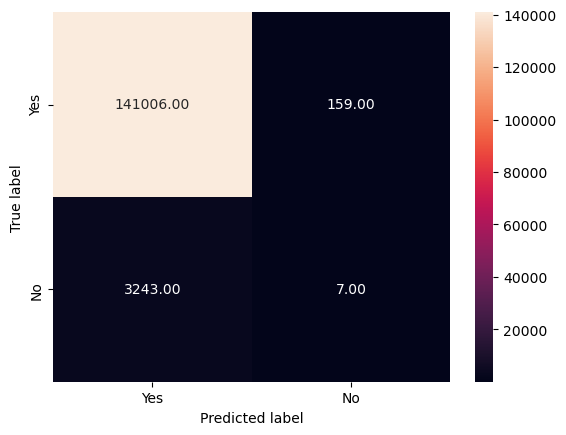


Training Data
              precision    recall  f1-score   support

           0       0.98      1.00      0.99    141165
           1       0.04      0.00      0.00      3250

    accuracy                           0.98    144415
   macro avg       0.51      0.50      0.50    144415
weighted avg       0.96      0.98      0.97    144415



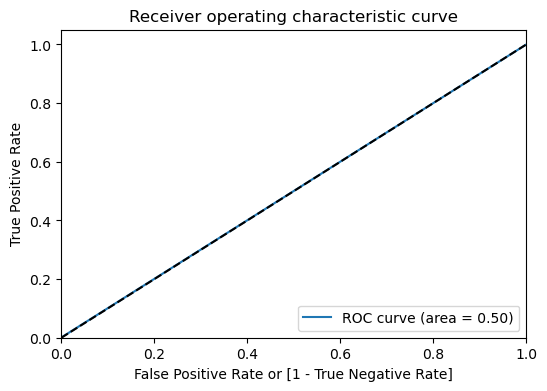


Test  Data
[[35248    44]
 [  811     1]]


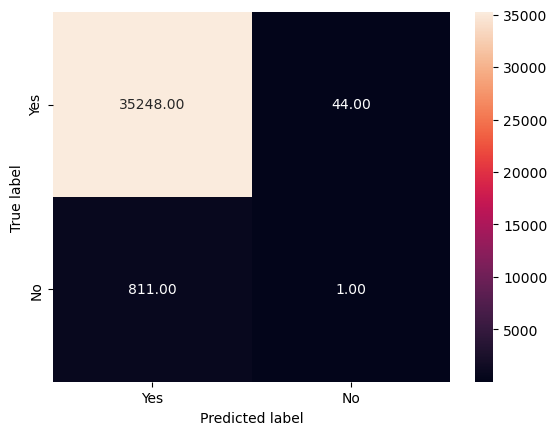


Test  Data
              precision    recall  f1-score   support

           0       0.98      1.00      0.99     35292
           1       0.02      0.00      0.00       812

    accuracy                           0.98     36104
   macro avg       0.50      0.50      0.50     36104
weighted avg       0.96      0.98      0.97     36104



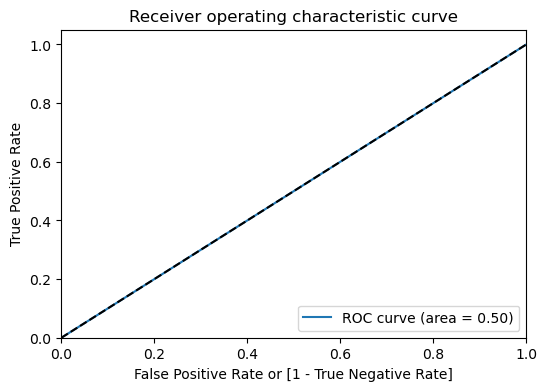

i = 1 Model = KNN
Model parameters: {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 5, 'p': 2, 'weights': 'uniform'}

Training Data
[[140666    499]
 [  1061   2189]]


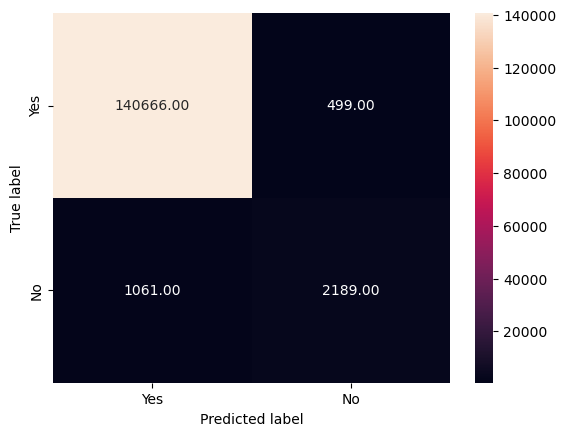


Training Data
              precision    recall  f1-score   support

           0       0.99      1.00      0.99    141165
           1       0.81      0.67      0.74      3250

    accuracy                           0.99    144415
   macro avg       0.90      0.84      0.87    144415
weighted avg       0.99      0.99      0.99    144415



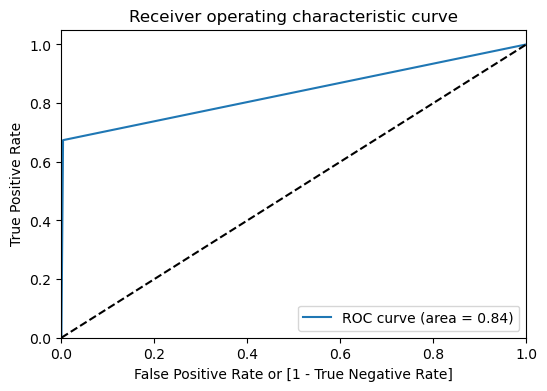


Test  Data
[[35035   257]
 [  467   345]]


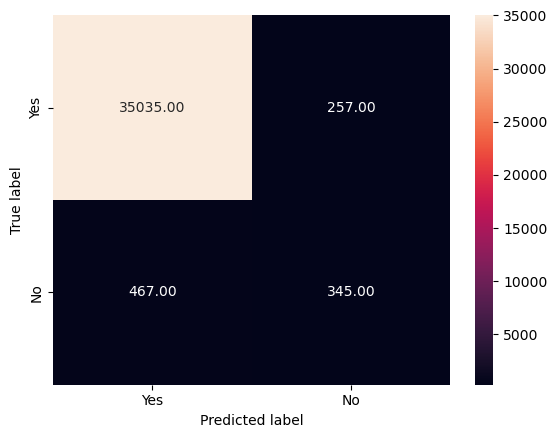


Test  Data
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     35292
           1       0.57      0.42      0.49       812

    accuracy                           0.98     36104
   macro avg       0.78      0.71      0.74     36104
weighted avg       0.98      0.98      0.98     36104



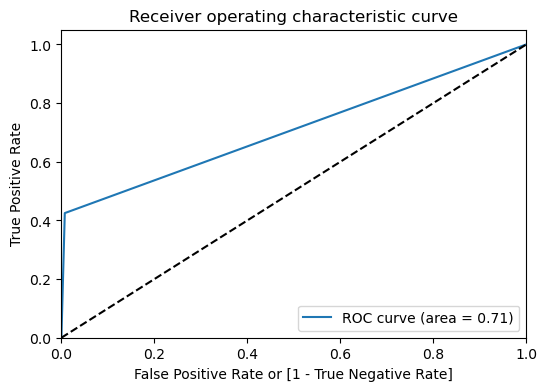

i = 2 Model = CART
Model parameters: {'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'random_state': None, 'splitter': 'best'}

Training Data
[[141165      0]
 [     0   3250]]


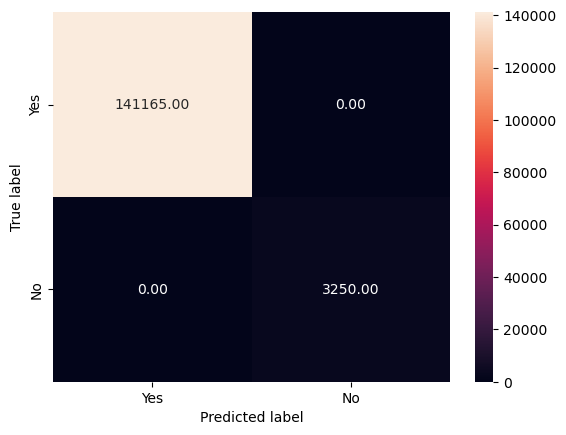


Training Data
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    141165
           1       1.00      1.00      1.00      3250

    accuracy                           1.00    144415
   macro avg       1.00      1.00      1.00    144415
weighted avg       1.00      1.00      1.00    144415



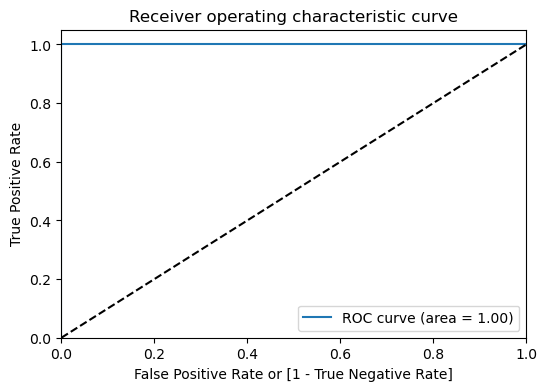


Test  Data
[[35254    38]
 [   70   742]]


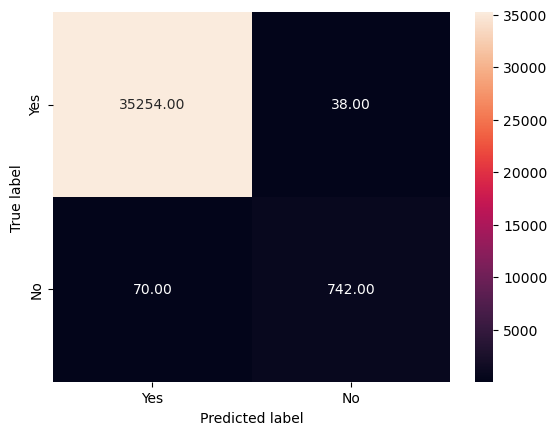


Test  Data
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     35292
           1       0.95      0.91      0.93       812

    accuracy                           1.00     36104
   macro avg       0.97      0.96      0.97     36104
weighted avg       1.00      1.00      1.00     36104



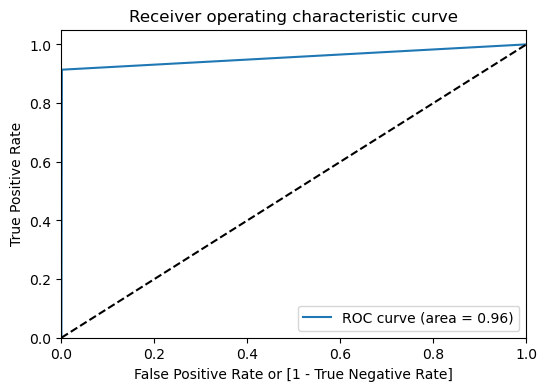

i = 3 Model = NB
Model parameters: {'priors': None, 'var_smoothing': 1e-09}

Training Data
[[141165      0]
 [  3250      0]]


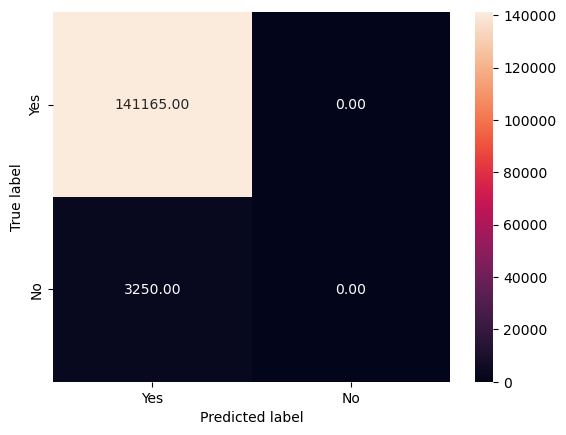


Training Data
              precision    recall  f1-score   support

           0       0.98      1.00      0.99    141165
           1       0.00      0.00      0.00      3250

    accuracy                           0.98    144415
   macro avg       0.49      0.50      0.49    144415
weighted avg       0.96      0.98      0.97    144415



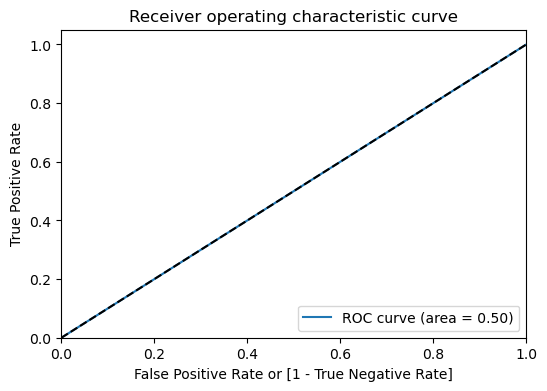


Test  Data
[[35292     0]
 [  812     0]]


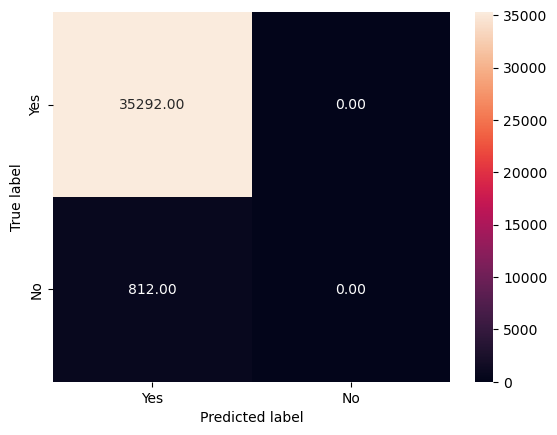


Test  Data
              precision    recall  f1-score   support

           0       0.98      1.00      0.99     35292
           1       0.00      0.00      0.00       812

    accuracy                           0.98     36104
   macro avg       0.49      0.50      0.49     36104
weighted avg       0.96      0.98      0.97     36104



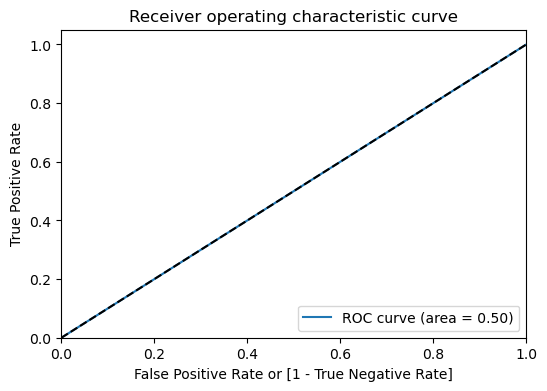

i = 4 Model = RF
Model parameters: {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}

Training Data
[[141165      0]
 [     0   3250]]


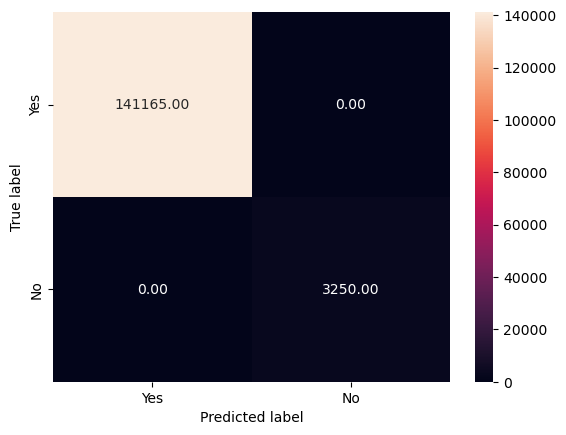


Training Data
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    141165
           1       1.00      1.00      1.00      3250

    accuracy                           1.00    144415
   macro avg       1.00      1.00      1.00    144415
weighted avg       1.00      1.00      1.00    144415



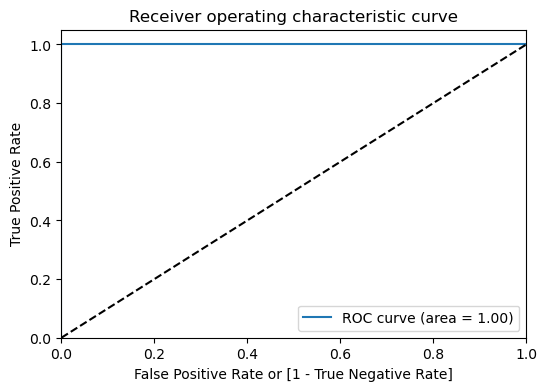


Test  Data
[[35258    34]
 [   81   731]]


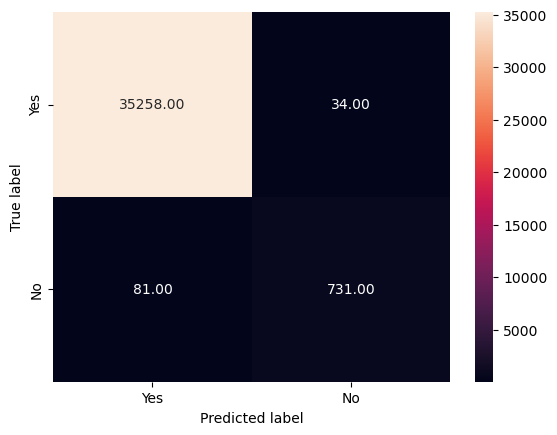


Test  Data
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     35292
           1       0.96      0.90      0.93       812

    accuracy                           1.00     36104
   macro avg       0.98      0.95      0.96     36104
weighted avg       1.00      1.00      1.00     36104



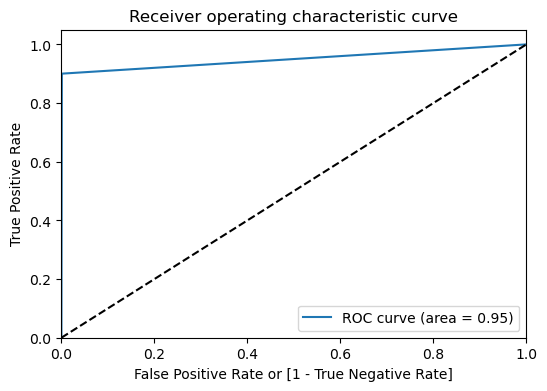

i = 5 Model = XGBoost
Model parameters: {'objective': 'binary:logistic', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': None, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': None, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': None, 'max_leaves': None, 'min_child_weight': None, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': None, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': None, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': None, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}

Training Data
[[141116     49]
 [    41   3209]]


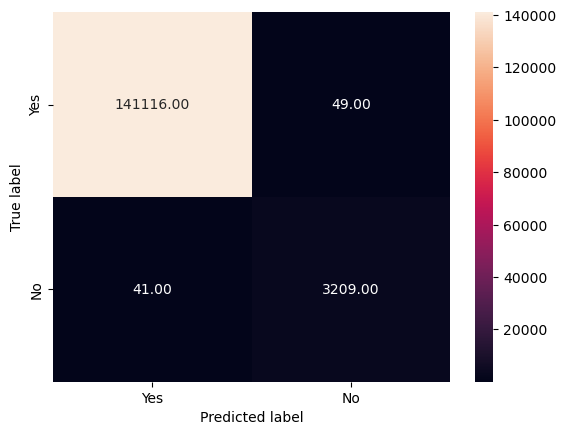


Training Data
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    141165
           1       0.98      0.99      0.99      3250

    accuracy                           1.00    144415
   macro avg       0.99      0.99      0.99    144415
weighted avg       1.00      1.00      1.00    144415



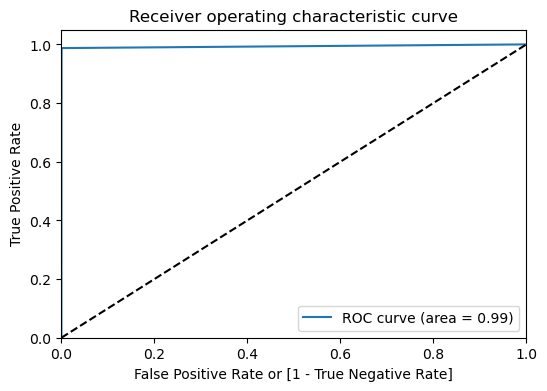


Test  Data
[[35220    72]
 [   58   754]]


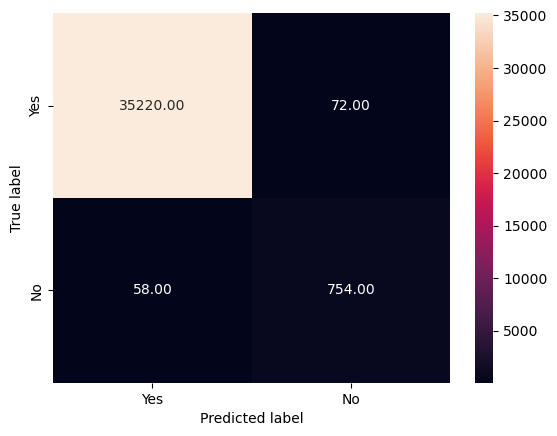


Test  Data
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     35292
           1       0.91      0.93      0.92       812

    accuracy                           1.00     36104
   macro avg       0.96      0.96      0.96     36104
weighted avg       1.00      1.00      1.00     36104



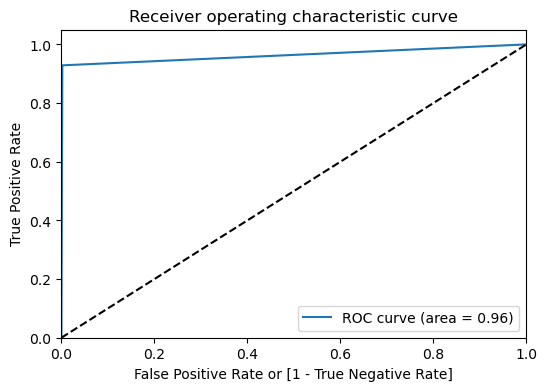

i = 6 Model = AdaBoost
Model parameters: {'algorithm': 'SAMME.R', 'estimator': None, 'learning_rate': 1.0, 'n_estimators': 50, 'random_state': None}

Training Data
[[139567   1598]
 [  1015   2235]]


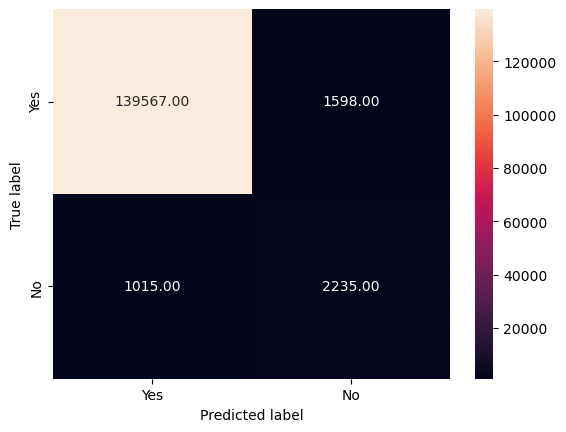


Training Data
              precision    recall  f1-score   support

           0       0.99      0.99      0.99    141165
           1       0.58      0.69      0.63      3250

    accuracy                           0.98    144415
   macro avg       0.79      0.84      0.81    144415
weighted avg       0.98      0.98      0.98    144415



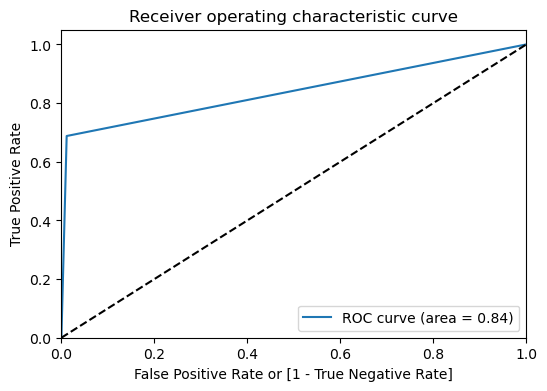


Test  Data
[[34903   389]
 [  280   532]]


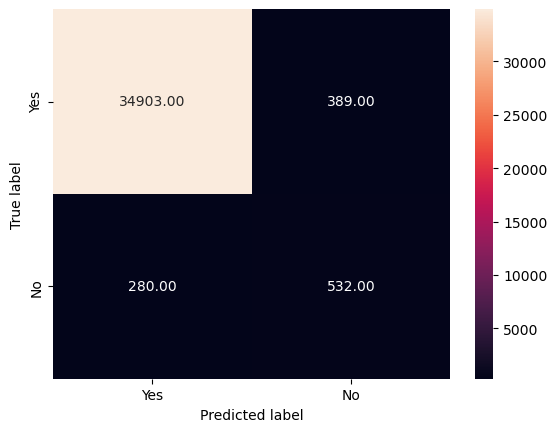


Test  Data
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     35292
           1       0.58      0.66      0.61       812

    accuracy                           0.98     36104
   macro avg       0.78      0.82      0.80     36104
weighted avg       0.98      0.98      0.98     36104



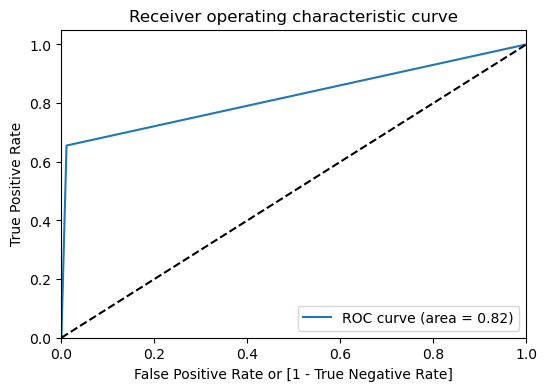

In [163]:
metrics_df    =  pd.DataFrame()
for   i    in   range(len(model_names)):
      model_x            =   model_names[i]
      print("i = %d Model = %s" %(i,model_x))
      classifier         =   models[i] 
      mp_df         =  evaluate_model_performance(model_x, classifier, X_train, y_train, X_test, y_test)
      metrics_df    =  pd.concat([metrics_df, mp_df])

In [164]:
metrics_df.sort_values(by=['Recall Test data'], ascending = False)

,Model,Recall Training data,Recall Test data,F1 Weighted Training data,F1 Weighted Test data,AUROC Training data,AUROC Test data,Precision Training data,Precision Test data
0,XGBoost,0.987385,0.928571,0.999377,0.996414,0.993519,0.963266,0.984960,0.912833
0,CART,1.000000,0.913793,1.000000,0.996979,1.000000,0.956358,1.000000,0.951282
0,RF,1.000000,0.900246,1.000000,0.996768,1.000000,0.949641,1.000000,0.955556
0,AdaBoost,0.687692,0.655172,0.982632,0.982039,0.838186,0.822075,0.583094,0.577633
0,KNN,0.673538,0.424877,0.988697,0.978487,0.835002,0.708797,0.814360,0.573090
0,LR,0.002154,0.001232,0.965936,0.965848,0.500514,0.499992,0.042169,0.022222
0,NB,0.000000,0.000000,0.966371,0.966392,0.500000,0.500000,0.000000,0.000000


In [165]:
time_elapsed = datetime.now() - start_time
print('\nExecution Time for evaluating the performance of 7 models on Raw data not treated for data imbalance')
print('Time elapsed (hh:mm:ss.ms) {}'.format(time_elapsed))


Execution Time for evaluating the performance of 7 models on Raw data not treated for data imbalance
Time elapsed (hh:mm:ss.ms) 0:01:03.131534


### b) After SMOTE

In [166]:
start_time   =  datetime.now()

For appling SMOTE, we have splitted the data into training and test datasets in the ratio, 80%: 20% and applied SMOTE only on Training data.

As we need to apply SMOTE only on Training data, we have not applied K Fold cross validation.

In [167]:
from imblearn.over_sampling import SMOTE

# transform the dataset
oversample = SMOTE()

In [168]:
X_train_SMOTE, y_train_SMOTE = oversample.fit_resample(X_train, y_train)

In [169]:
model_names  =  ["LR","KNN","CART","NB","RF","XGBoost","AdaBoost"]

In [170]:
models       =  [LogisticRegression(max_iter = 3000),\
                 KNeighborsClassifier(),\
                 DecisionTreeClassifier(),\
                 GaussianNB(),\
                 RandomForestClassifier(),\
                 XGBClassifier(),\
                 AdaBoostClassifier()]

i = 0 Model = LR
Model parameters: {'C': 1.0, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 3000, 'multi_class': 'deprecated', 'n_jobs': None, 'penalty': 'l2', 'random_state': None, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}

Training Data
[[113306  27859]
 [  8399 132766]]


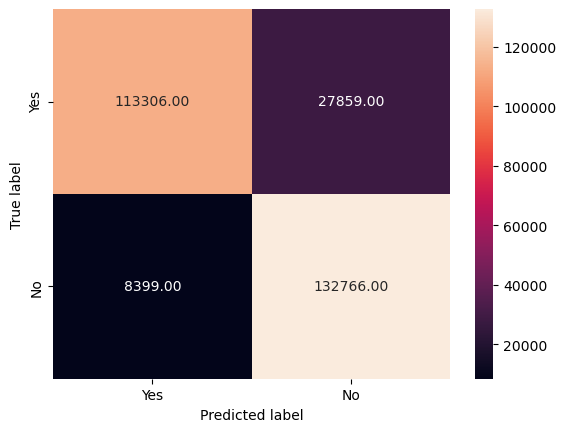


Training Data
              precision    recall  f1-score   support

           0       0.93      0.80      0.86    141165
           1       0.83      0.94      0.88    141165

    accuracy                           0.87    282330
   macro avg       0.88      0.87      0.87    282330
weighted avg       0.88      0.87      0.87    282330



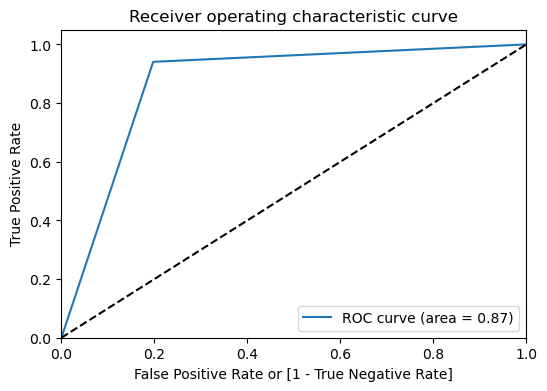


Test  Data
[[28417  6875]
 [   73   739]]


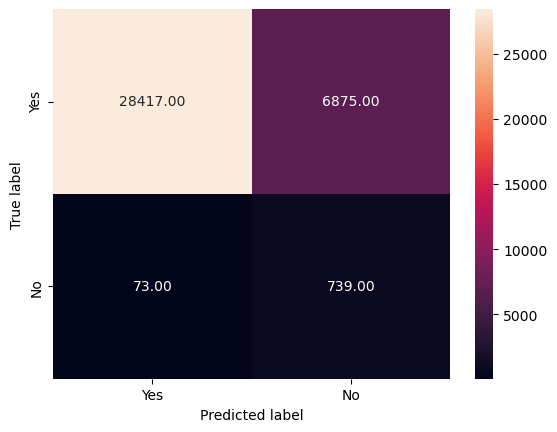


Test  Data
              precision    recall  f1-score   support

           0       1.00      0.81      0.89     35292
           1       0.10      0.91      0.18       812

    accuracy                           0.81     36104
   macro avg       0.55      0.86      0.53     36104
weighted avg       0.98      0.81      0.87     36104



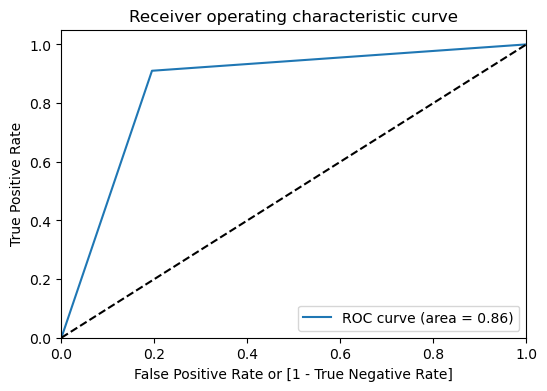

i = 1 Model = KNN
Model parameters: {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 5, 'p': 2, 'weights': 'uniform'}

Training Data
[[137776   3389]
 [   120 141045]]


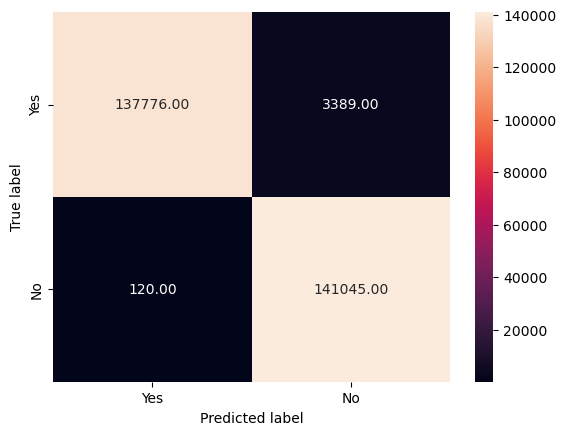


Training Data
              precision    recall  f1-score   support

           0       1.00      0.98      0.99    141165
           1       0.98      1.00      0.99    141165

    accuracy                           0.99    282330
   macro avg       0.99      0.99      0.99    282330
weighted avg       0.99      0.99      0.99    282330



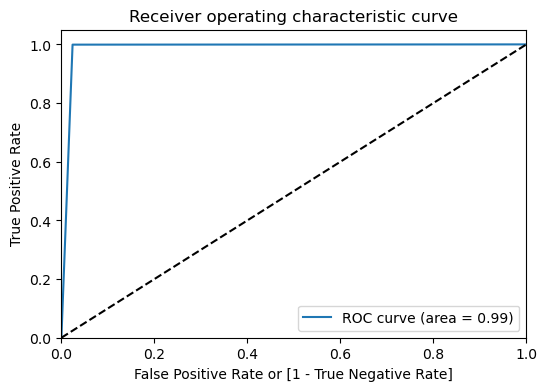


Test  Data
[[33744  1548]
 [  100   712]]


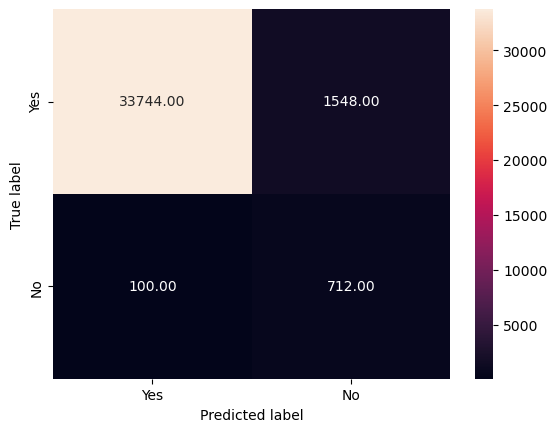


Test  Data
              precision    recall  f1-score   support

           0       1.00      0.96      0.98     35292
           1       0.32      0.88      0.46       812

    accuracy                           0.95     36104
   macro avg       0.66      0.92      0.72     36104
weighted avg       0.98      0.95      0.96     36104



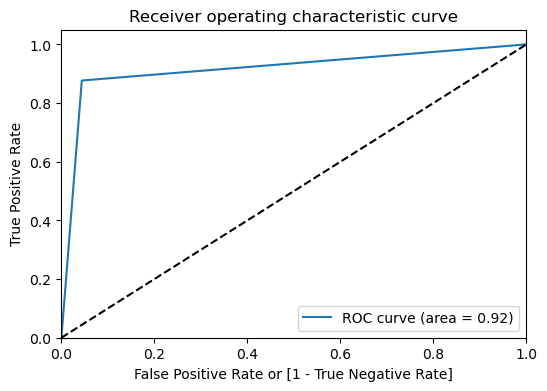

i = 2 Model = CART
Model parameters: {'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'random_state': None, 'splitter': 'best'}

Training Data
[[141165      0]
 [     0 141165]]


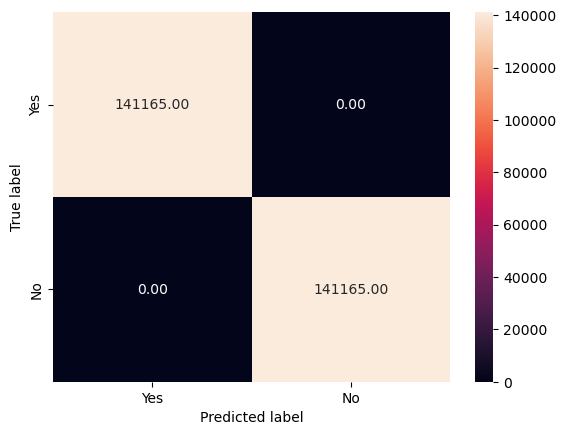


Training Data
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    141165
           1       1.00      1.00      1.00    141165

    accuracy                           1.00    282330
   macro avg       1.00      1.00      1.00    282330
weighted avg       1.00      1.00      1.00    282330



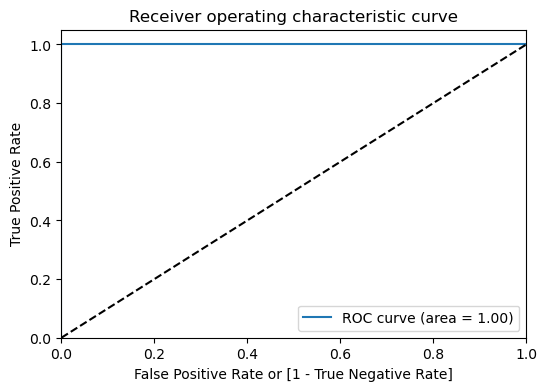


Test  Data
[[35219    73]
 [   59   753]]


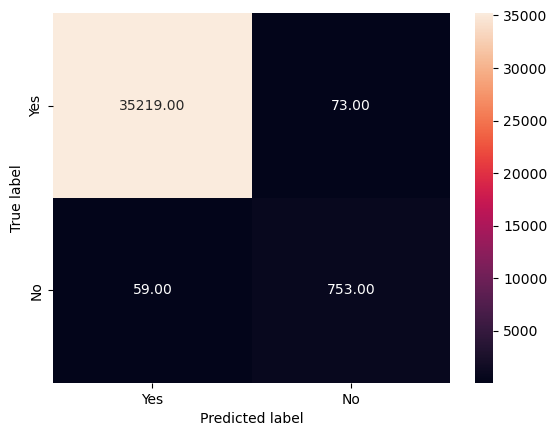


Test  Data
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     35292
           1       0.91      0.93      0.92       812

    accuracy                           1.00     36104
   macro avg       0.95      0.96      0.96     36104
weighted avg       1.00      1.00      1.00     36104



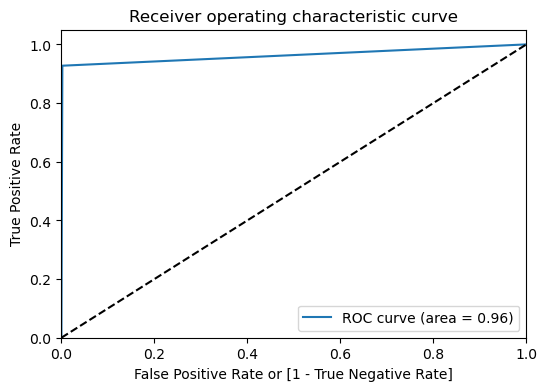

i = 3 Model = NB
Model parameters: {'priors': None, 'var_smoothing': 1e-09}

Training Data
[[ 89250  51915]
 [  2849 138316]]


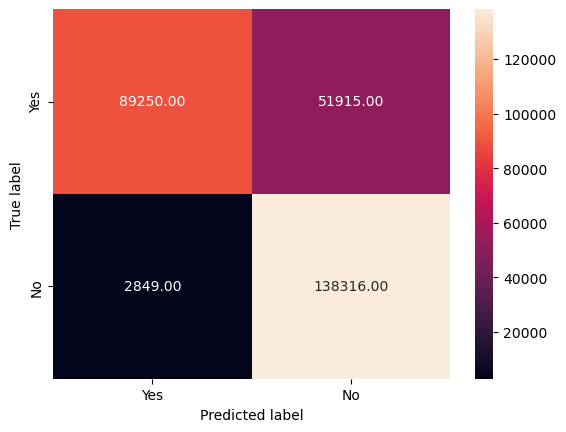


Training Data
              precision    recall  f1-score   support

           0       0.97      0.63      0.77    141165
           1       0.73      0.98      0.83    141165

    accuracy                           0.81    282330
   macro avg       0.85      0.81      0.80    282330
weighted avg       0.85      0.81      0.80    282330



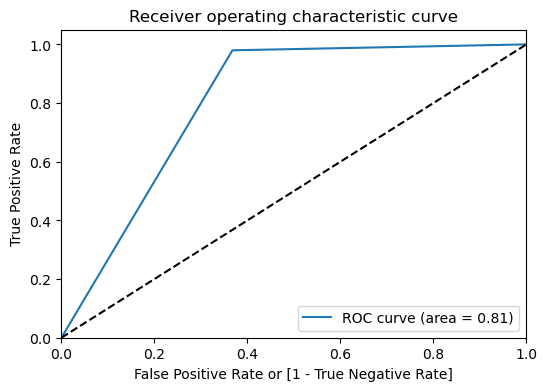


Test  Data
[[22426 12866]
 [   24   788]]


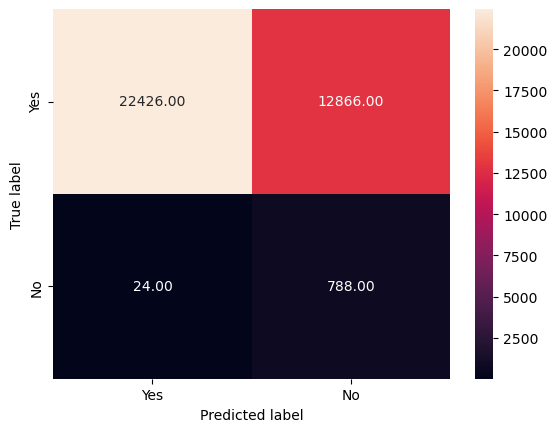


Test  Data
              precision    recall  f1-score   support

           0       1.00      0.64      0.78     35292
           1       0.06      0.97      0.11       812

    accuracy                           0.64     36104
   macro avg       0.53      0.80      0.44     36104
weighted avg       0.98      0.64      0.76     36104



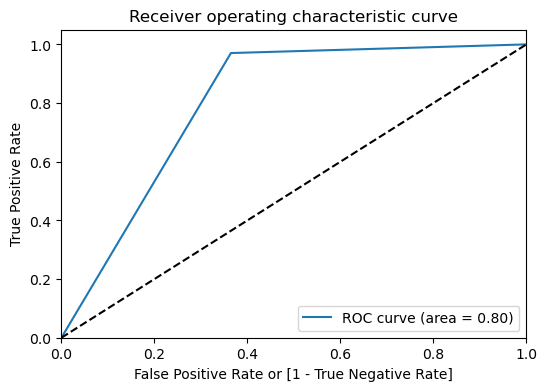

i = 4 Model = RF
Model parameters: {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}

Training Data
[[141165      0]
 [     0 141165]]


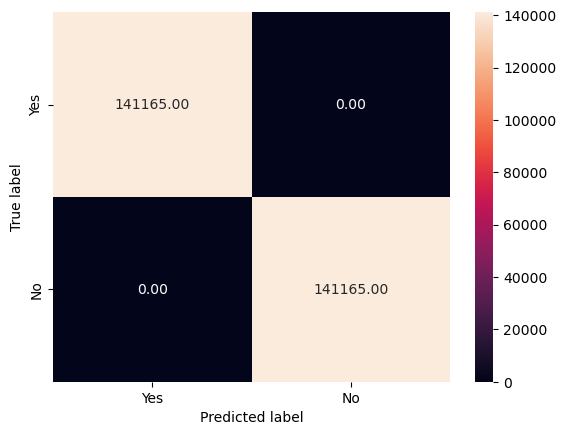


Training Data
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    141165
           1       1.00      1.00      1.00    141165

    accuracy                           1.00    282330
   macro avg       1.00      1.00      1.00    282330
weighted avg       1.00      1.00      1.00    282330



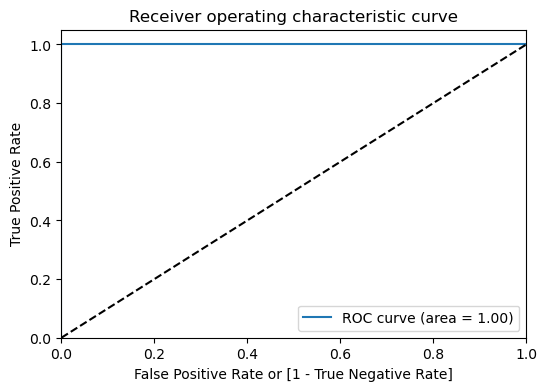


Test  Data
[[35211    81]
 [   27   785]]


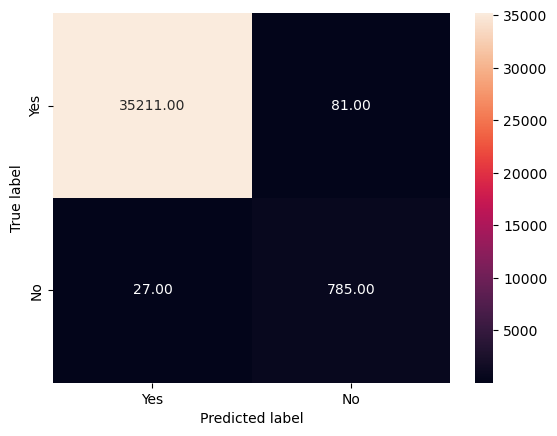


Test  Data
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     35292
           1       0.91      0.97      0.94       812

    accuracy                           1.00     36104
   macro avg       0.95      0.98      0.97     36104
weighted avg       1.00      1.00      1.00     36104



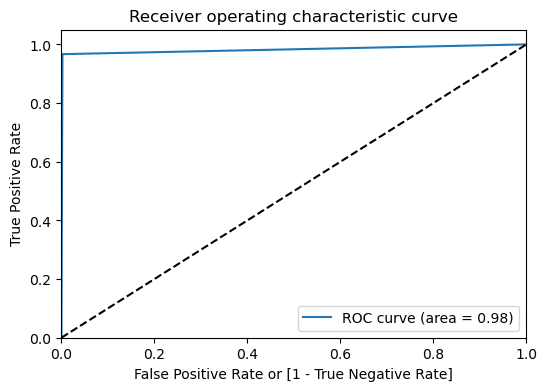

i = 5 Model = XGBoost
Model parameters: {'objective': 'binary:logistic', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': None, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': None, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': None, 'max_leaves': None, 'min_child_weight': None, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': None, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': None, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': None, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}

Training Data
[[140361    804]
 [     5 141160]]


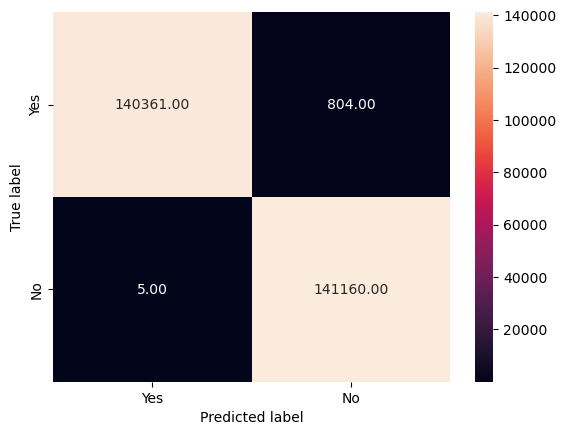


Training Data
              precision    recall  f1-score   support

           0       1.00      0.99      1.00    141165
           1       0.99      1.00      1.00    141165

    accuracy                           1.00    282330
   macro avg       1.00      1.00      1.00    282330
weighted avg       1.00      1.00      1.00    282330



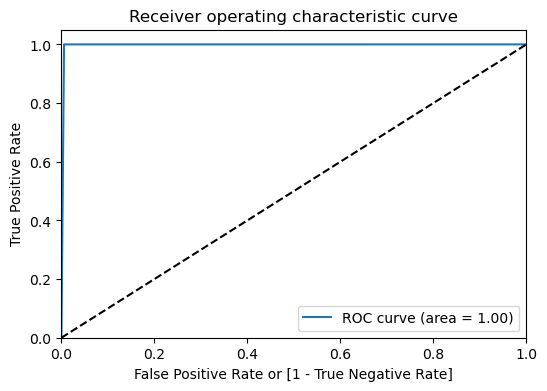


Test  Data
[[34983   309]
 [   18   794]]


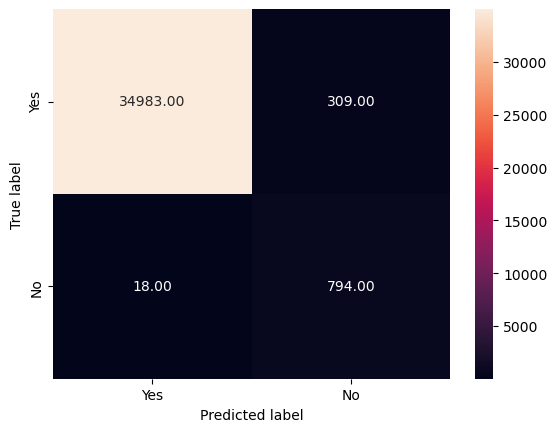


Test  Data
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     35292
           1       0.72      0.98      0.83       812

    accuracy                           0.99     36104
   macro avg       0.86      0.98      0.91     36104
weighted avg       0.99      0.99      0.99     36104



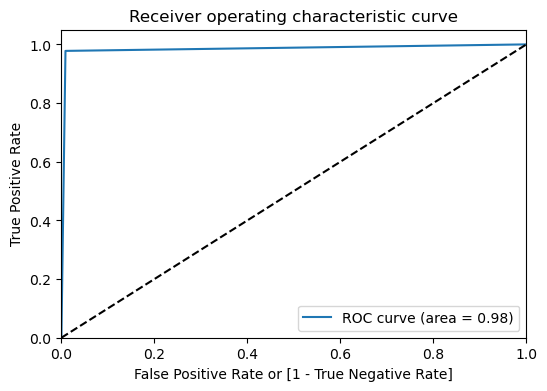

i = 6 Model = AdaBoost
Model parameters: {'algorithm': 'SAMME.R', 'estimator': None, 'learning_rate': 1.0, 'n_estimators': 50, 'random_state': None}

Training Data
[[138200   2965]
 [     1 141164]]


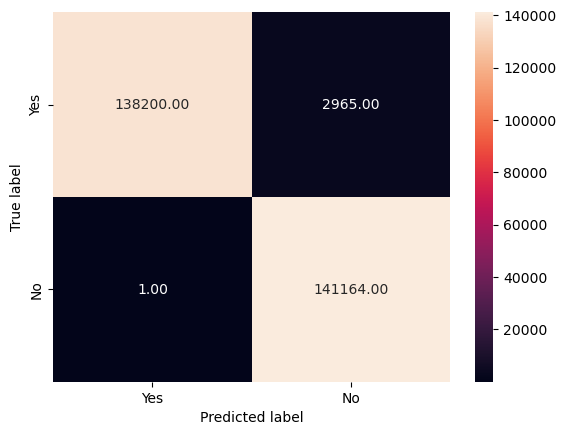


Training Data
              precision    recall  f1-score   support

           0       1.00      0.98      0.99    141165
           1       0.98      1.00      0.99    141165

    accuracy                           0.99    282330
   macro avg       0.99      0.99      0.99    282330
weighted avg       0.99      0.99      0.99    282330



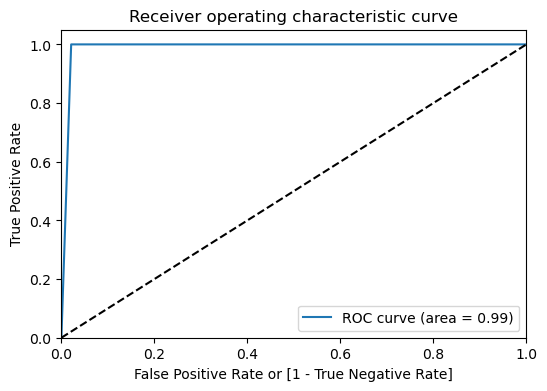


Test  Data
[[34579   713]
 [    2   810]]


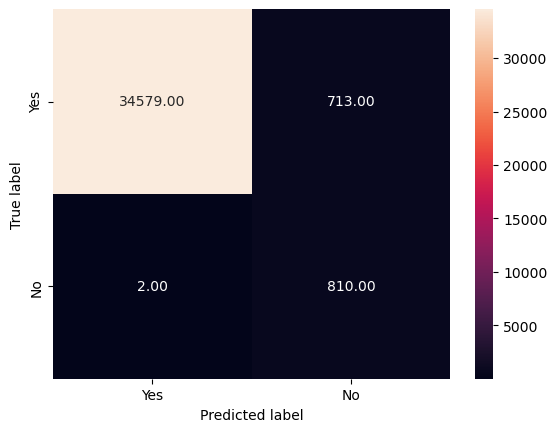


Test  Data
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     35292
           1       0.53      1.00      0.69       812

    accuracy                           0.98     36104
   macro avg       0.77      0.99      0.84     36104
weighted avg       0.99      0.98      0.98     36104



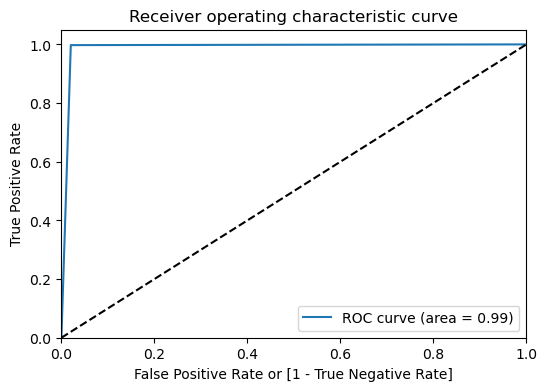

In [171]:
SMOTE_metrics_df =  pd.DataFrame()
for   i    in   range(len(model_names)):
      model_x            =   model_names[i]
      print("i = %d Model = %s" %(i,model_x))
      classifier         =   models[i] 
      smote_df = evaluate_model_performance(model_x, classifier, X_train_SMOTE, y_train_SMOTE, X_test, y_test)
      SMOTE_metrics_df =  pd.concat([SMOTE_metrics_df,smote_df])

In [172]:
SMOTE_metrics_df.sort_values(by=['Recall Test data'], ascending = False)

,Model,Recall Training data,Recall Test data,F1 Weighted Training data,F1 Weighted Test data,AUROC Training data,AUROC Test data,Precision Training data,Precision Test data
0,AdaBoost,0.999993,0.997537,0.989493,0.983110,0.989495,0.988667,0.979428,0.531845
0,XGBoost,0.999965,0.977833,0.997135,0.991612,0.997135,0.984538,0.994337,0.719855
0,NB,0.979818,0.970443,0.799987,0.761746,0.806028,0.802942,0.727095,0.057712
0,RF,1.000000,0.966749,1.000000,0.997056,1.000000,0.982227,1.000000,0.906467
0,CART,1.000000,0.927340,1.000000,0.996359,1.000000,0.962636,1.000000,0.911622
0,LR,0.940502,0.910099,0.870963,0.874971,0.871576,0.857648,0.826559,0.097058
0,KNN,0.999150,0.876847,0.987570,0.964634,0.987571,0.916492,0.976536,0.315044


In [173]:
time_elapsed = datetime.now() - start_time
print('\nExecution Time for evaluating the performance of 7 models on the data treated for data imbalance')
print('Time elapsed (hh:mm:ss.ms) {}'.format(time_elapsed))


Execution Time for evaluating the performance of 7 models on the data treated for data imbalance
Time elapsed (hh:mm:ss.ms) 0:02:11.013081


### Observations

Without applying SMOTE technique to treat the data imbalance, the **best model is Decision Tree (CART)** has the very good recall of 100 % Recall & 100% F1-Weighted score for training data and recall of 92.7% Recall & 99.68% F1-Weighted score for test data. 

After applying SMOTE technique to treat the data imbalance, the **best model is AdaBoost** giving the very good recall of 99.9999 % using training data  and 99.75 % for test data and the F1- weighted is 98.95 % using training data and 98.31% using test data.

**Decision Tree (CART)** gives the recall of 100 % using training data and 93.10 % using test data. F1-weighted is 100% using training data and 93.10 % using test data.

So far, the **performance of Decision Tree model is good**. Deecion Tree models are preferred as they require fewer computational resources to construct and make predictions, Decision Trees are quicker than Random Forests. They help develop simple models and exploratory data analysis because they are also reasonably simple to interpret. 


## 5) Comparison to benchmark

## CART using Python

In [174]:
! pip install pydotplus

In [175]:
! pip install pydot

### Import required Libraries

In [176]:
import pandas                   as      pd
import numpy                    as      np
import sklearn.datasets         as      datasets
import matplotlib.pyplot        as      plt

from   sklearn                  import  tree
from   sklearn.tree             import  DecisionTreeClassifier
# from   sklearn.tree             import _tree

from   sklearn                  import  metrics 
from   sklearn.metrics          import  classification_report
from   sklearn.metrics          import  confusion_matrix
from   sklearn.metrics          import  roc_curve, auc
from   sklearn.model_selection  import  KFold, cross_val_score
from   six                      import  StringIO
from   sklearn                  import  tree 

import pydotplus
import pydot

%matplotlib inline

In [177]:
def draw_cm( actual, predicted ):
    
    import matplotlib.pyplot as   plt
    import sklearn.metrics   as   metrics
    import seaborn           as   sns
    
    cm = metrics.confusion_matrix( actual, predicted)
    sns.heatmap(cm, annot=True, fmt='.2f', xticklabels = ["Yes", "No"] , yticklabels = ["Yes", "No"] )
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()   

In [178]:
def draw_roc( actual, probs ):

    import pandas            as   pd
    import numpy             as   np
    import seaborn           as   sns
    import matplotlib.pyplot as   plt
    import sklearn.metrics   as   metrics
    import seaborn           as   sns
    
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
    drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(6, 4))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic curve')
    plt.legend(loc="lower right")
    plt.show()
    return fpr, tpr, thresholds

In [179]:
def build_decision_tree(model, X, y, flist, file_name):
    from sklearn.tree            import export_graphviz
    from IPython.core.pylabtools import figsize
    from IPython.display         import Image
    figsize(12.5, 6)
    import pydot

    #dot_data = StringIO()  
    file_name_dot = file_name + '.dot'
    file_name_png = file_name + '.png'
    
    export_graphviz(model, out_file = file_name_dot, feature_names = flist,\
                    class_names = ['No suspected Fraud' , 'suspected Fraud'],
                    filled = True, rounded = True)
    (graph,) = pydot.graph_from_dot_file(file_name_dot)
    graph.write_png(file_name_png)
    return Image(file_name_png)

In [180]:
'''
This function returns a set of rules defined in the Decision Tree which is easy to understand
'''
def tree_to_rules(tree, feature_names, class_names):

    left = tree.tree_.children_left
    right = tree.tree_.children_right
    threshold = tree.tree_.threshold
    features = [feature_names[i] for i in tree.tree_.feature]
    value = tree.tree_.value

    def recurse(left, right, threshold, features, node, depth=0):

        indent = "  " * depth

        if (threshold[node] != -2):

            print(indent,"if ( " + features[node] + " <= " + str(threshold[node]) + " ) {")

            if left[node] != -1:

                recurse (left, right, threshold, features, left[node], depth+1)
                print(indent,"} else {")

                if right[node] != -1:
                    recurse (left, right, threshold, features, right[node], depth+1)

                print(indent,"}")

        else:
            if value[node][0,0] > value[node][0,1]:
              classified = class_names[0]
            else:
              classified = class_names[1]
            print(indent,"Class = " + classified)
    recurse(left, right, threshold, features, 0)

In [181]:
'''
This function calculates the Youdens J score which gives the optimum cut-off
point given the fpr, tpr and thresholds
'''
def get_youdens_j_cutoff(fpr,tpr,thresholds):
    j_scores = tpr-fpr
    j_ordered = sorted(zip(j_scores,thresholds))
    return j_ordered[-1][1]

### Read data file

### Create X, independent variable and y dependent variable

In [207]:
X_train_enc          =   pd.get_dummies(xtrain, drop_first=True)
y_train_enc          =   pd.get_dummies(ytrain, drop_first=True)

In [209]:
y_train_enc.replace({False:0,True:1},inplace=True)

In [213]:
y_train_enc.rename(columns={1:'Target'},inplace=True)

In [214]:
y_train_enc.head()

,Target
115671,0
146025,0
19467,0
75072,0
125885,0


In [215]:
label_names    =   np.array(y_train_enc.Target.unique()).astype('str').tolist()
label_names


['0', '1']

y_train.columns

label_names = y.Target.unique()

In [221]:
print("\n Shape of X {}".format(X_train.shape))
print("\n Shape of y {}".format(y_train.shape))


 Shape of X (144415, 15)

 Shape of y (144415,)


### Understand Data

In [185]:
feature_names   = X_train_enc.columns

### Check if the data set is balanced or not

In [186]:
y_train.value_counts().apply(lambda x: [x, ( x * 100) / y_train.shape[0]])

Target_code
0    [141165, 97.74954125263996]
1      [3250, 2.250458747360039]
Name: count, dtype: object

In [187]:
X_train_enc.columns

Index(['Order Item Id', 'Customer Zipcode', 'Type_code',
       'Delivery Status_code', 'Customer City_code', 'Customer State_code',
       'Customer Street_code', 'Order City_code', 'Order Country_code',
       'Order State_code', 'Shipping Mode_code', 'Shipping weekday_code',
       'Shipping month_code', 'order weekday_code', 'order month_code'],
      dtype='object')

In [188]:
clf    = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf    = clf.fit(X_train_enc,y_train_enc)

In [189]:
#Predict the response for train dataset
predicted_train = clf.predict(X_train_enc)


Training Data
[[123524      0]
 [     0   2839]]


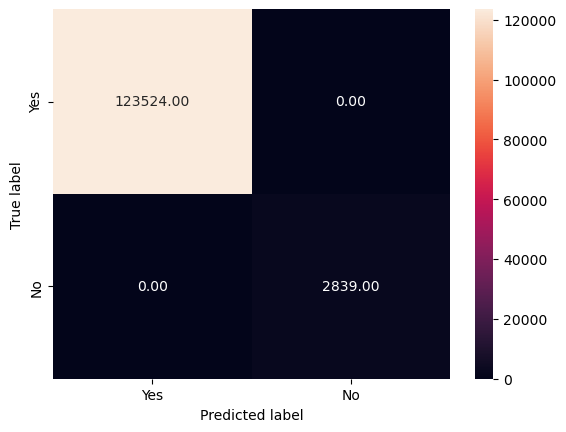

Training Accuracy: 100.000%


In [190]:
matrix             = confusion_matrix(y_train_enc, predicted_train)
print("\nTraining Data")
print(matrix)
draw_cm(y_train_enc, predicted_train )
    
accuracy_train = clf.score(X_train_enc, y_train_enc) 
print("Training Accuracy: %.3f%%" % (accuracy_train * 100.0))

In [191]:
measures_train     = classification_report(y_train_enc, predicted_train) 
print("\nTraining data")
print(measures_train) 


Training data
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    123524
           1       1.00      1.00      1.00      2839

    accuracy                           1.00    126363
   macro avg       1.00      1.00      1.00    126363
weighted avg       1.00      1.00      1.00    126363




Training  data


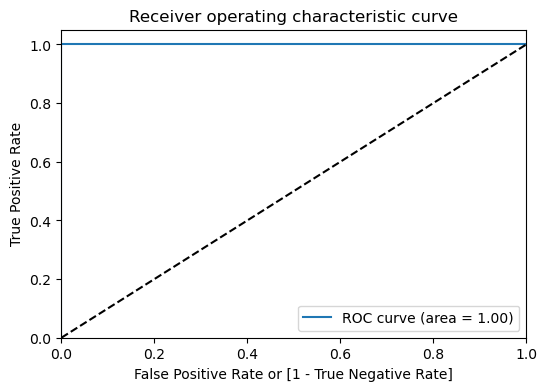

(array([0., 0., 1.]), array([0., 1., 1.]), array([inf,  1.,  0.]))

In [192]:
print("\nTraining  data")
draw_roc(y_train_enc, predicted_train)  

Recursive partitioning is a fundamental tool in data mining. It helps us explore the structure of a set of data, while developing easy to visualize decision rules for predicting a categorical (classification tree) or continuous (regression tree) outcome.

CART Modeling via DecisionTreeClassifier

Classification and Regression Trees (as described by Brieman, Freidman, Olshenm and Stone) can be generated through the DecisionTreeClassifier package.

i) Grow the tree

For controlling tree growth, we set the following parameters:
* max_depth: The maximum depth of the tree.
* min_samples_split: The minimum number of samples required to split an internal node
* min_samples_leaf: min no of samples at a leaf node
* min_impurity_decrease : A node will be split if this split induces a decrease of the impurity greater than or equal to this value. 

In [222]:
class_names   =  label_names

In [193]:
build_decision_tree(clf, X_train_enc, y_train_enc, feature_names, 'Suspected Fraud')

We observe that the above tree is unpruned and it is unexplainable and difficult to comprehend. 
Let us improve the graph by pruning.

### Optimize Decision Tree performance

Let us look at the following parameters:

| Parameter | Details                            |
| ----------------- | --------------------------------------------------------|
| criterion | This parameter allows us to use the different-different attribute selection measure.    Allowed criteria are “gini” (default) for the Gini index and “entropy” for the information gain.|
| splitter  | This parameter allows us to choose the split strategy. Allowed strategies are “best” to  choose the best split and “random” to choose the best random split| 
| max_depth | This parameter allows us to state the maximum depth of the tree. If None, then nodes are  expanded until all the leaves contain less than min_samples_split samples. The higher value of maximum depth causes overfitting, and a lower value causes underfitting |

How do you interpret the tree or understand the rules from the above picture?

In [194]:
clf1    =   DecisionTreeClassifier(criterion="entropy", max_depth = 4, min_impurity_decrease = 0)
# Train Decision Tree Classifer
clf1    = clf1.fit(X_train_enc,y_train_enc)


Training Data
[[121343   2181]
 [   336   2503]]


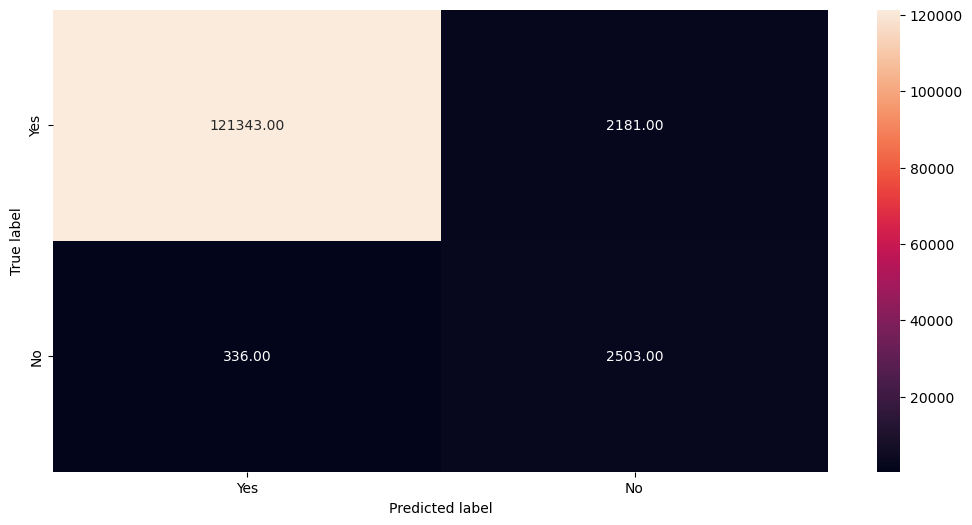

Training Accuracy: 100.000%


In [195]:
#Predict the response for train dataset
predicted_train1 = clf1.predict(X_train_enc)
matrix             = confusion_matrix(y_train_enc, predicted_train1)
print("\nTraining Data")
print(matrix)
draw_cm(y_train_enc, predicted_train1)
    
accuracy_train = clf.score(X_train_enc, y_train_enc) 
print("Training Accuracy: %.3f%%" % (accuracy_train * 100.0))

In [196]:
measures_train1     = classification_report(y_train_enc, predicted_train1) 
print("\nTraining data after pruning")
print(measures_train1) 


Training data after pruning
              precision    recall  f1-score   support

           0       1.00      0.98      0.99    123524
           1       0.53      0.88      0.67      2839

    accuracy                           0.98    126363
   macro avg       0.77      0.93      0.83    126363
weighted avg       0.99      0.98      0.98    126363



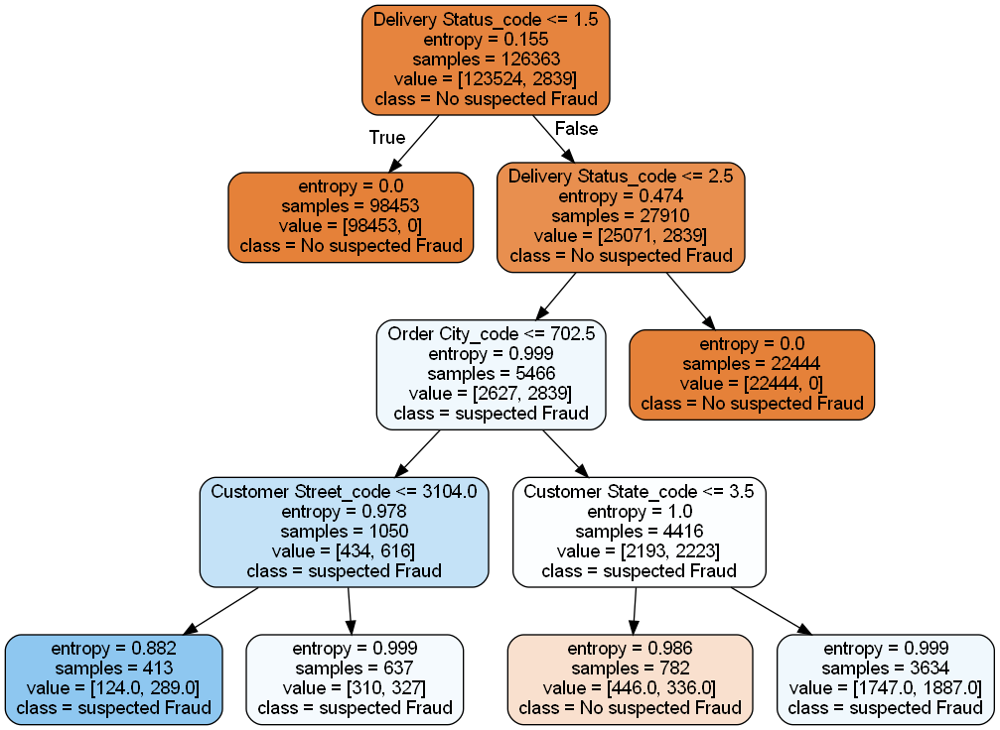

In [197]:
build_decision_tree(clf1, X_train_enc, y_train_enc, feature_names, 'Suspected Fraud')

In [223]:
tree_to_rules(clf, list(X_train_enc.loc[:,feature_names]), class_names)

 if ( Delivery Status_code <= 1.5 ) {
   Class = 0
 } else {
   if ( Delivery Status_code <= 2.5 ) {
     if ( Customer Zipcode <= 90035.0 ) {
       if ( Order City_code <= 702.5 ) {
         if ( Customer Street_code <= 6528.5 ) {
           if ( Order City_code <= 527.0 ) {
             if ( Customer City_code <= 59.5 ) {
               if ( order weekday_code <= 1.5 ) {
                 if ( Order City_code <= 275.5 ) {
                   if ( Customer City_code <= 40.5 ) {
                     Class = 1
                   } else {
                     Class = 0
                   }
                 } else {
                   Class = 0
                 }
               } else {
                 if ( Customer Street_code <= 1388.0 ) {
                   Class = 1
                 } else {
                   if ( order weekday_code <= 5.5 ) {
                     Class = 0
                   } else {
                     if ( Shipping month_code <= 7.0 ) {
                       Cla

https://www.kdnuggets.com/2017/05/simplifying-decision-tree-interpretation-decision-rules-python.html

### Variable importance plot

Ref: https://h2o-release.s3.amazonaws.com/h2o/rel-yau/3/docs-website/h2o-docs/variable-importance.html

**The feature importances:**

The higher, the more important the feature. The importance of a feature is computed as the (normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance.
It displays each feature’s importance after it has been scaled between 0 and 1.

In **scikit-learn** the feature importance is the decrease in node impurity. The key is that it measures the importance only at a node level. Then, all the nodes are weighted by how many samples reach that node.


In [199]:
from decimal import Decimal, getcontext

getcontext().prec = 8

In [200]:
varImp_df   = pd.DataFrame({'Feature_names' :feature_names,\
                            'Importances' : clf.feature_importances_})
varImp_df.sort_values('Importances', ascending = False, inplace = True) 

In [201]:
vimp        =  varImp_df.iloc[:10]
vimp

,Feature_names,Importances
3,Delivery Status_code,0.508347
6,Customer Street_code,0.084006
7,Order City_code,0.071188
9,Order State_code,0.055287
0,Order Item Id,0.054100
1,Customer Zipcode,0.036268
8,Order Country_code,0.031956
4,Customer City_code,0.027881
11,Shipping weekday_code,0.027211
12,Shipping month_code,0.026696


In [202]:
Feature_names =  vimp['Feature_names']
values        =  vimp['Importances']

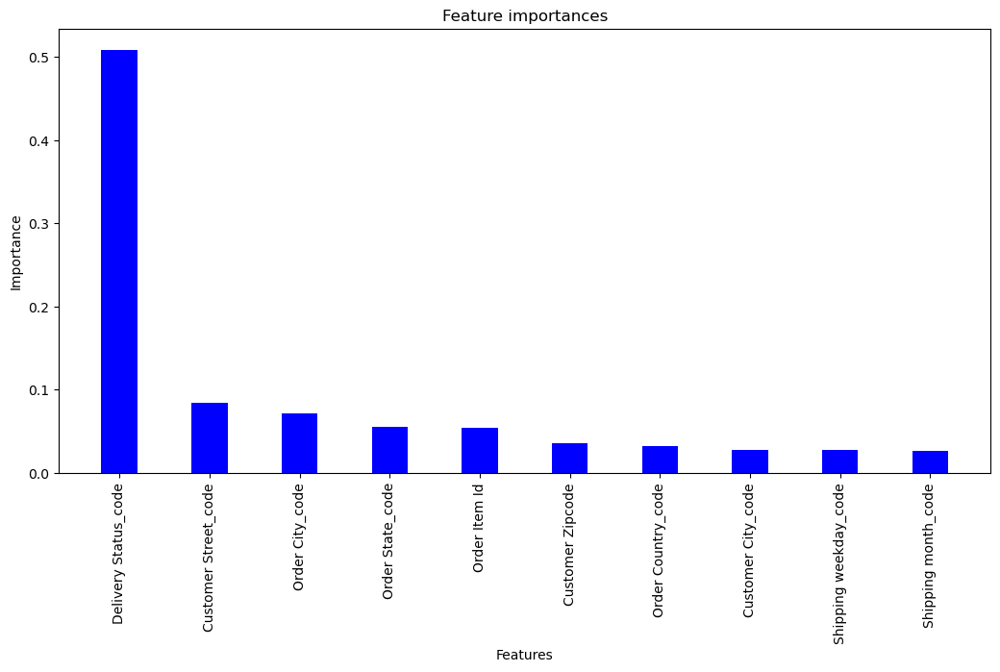

In [203]:
plt.bar(Feature_names, values, color ='blue', 
        width = 0.4)

plt.xlabel("Features")
plt.xticks(rotation=90)
plt.ylabel("Importance")
plt.title("Feature importances")
plt.show()

### Observations

Top three independent variables impacting the target variable:
1) Delivery Status_Shipping canceled: 0.511000
2) Order Item Id: 0.066118
3) Customer Zipcode: 0.056776	

## 7.	IMPLICATIONS
In the field of Supply Chain Management, the Fraud orders detections is a manual process as we automated this using machine learning predictions with a high accuracy we predict once the orders are placed whether the order made is a Suspected Fraud or genuine orders. With this prediction we can delay the shipment of fraud orders for some time, this reduces the unnecessary shipment costs for a fraudulent order.


## 8.	LIMITATIONS
•	Decision trees tend to overfit the training data, especially when the tree becomes deep (i.e., with many splits). This can lead to poor generalization on unseen data.
•	Small changes in the training data can lead to large changes in the structure of the tree. This makes decision trees highly unstable, as they are sensitive to variations in the input data.

## 9.	CLOSING REFLECTIONS
•	In our data the one of the challenges faced is curse of dimensionality i.e., we have 54 columns in our data. We reduced them by using Variance Inflation Factor and ID columns were dropped.
•	In other hand we had a huge data imbalance such that the Fraud orders(0) is 2.25% and genuine orders are 97.75% of the data. This made us to choose SMOTE, an oversampling technique to proceed further in the predictions.
